In [1]:
#data manipulation
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 60)

#data visualization
from mpl_toolkits.mplot3d import axes3d
from mpl_toolkits import mplot3d

from IPython.core.pylabtools import figsize

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
import seaborn as sns
sns.set_context(font_scale=2)

%matplotlib notebook
%matplotlib inline

# to bypass warnings in various dataframe assignments
pd.options.mode.chained_assignment = None

# preprocessing functions and evaluation models
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.dummy import DummyClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

# machine learning models
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

#save/load models
from joblib import dump, load

In [2]:
#function for checking extreme outliers (cereniyim@github), mild = 0, extreme =1, and copying those outliers to additional dataframe

def outlier_function(df, col_name, outlier_type):
    ''' this function detects first and third quartile and interquartile range for a given column of a dataframe,
        calculates upper and lower limits to determine outliers conservatively, according to given outlier type,
    returns the number of lower and uper limit, number of outliers respectively and dataframe containing only outliers
    '''
    first_quartile = np.percentile(np.array(df[col_name]).tolist(), 25)
    third_quartile = np.percentile(np.array(df[col_name]).tolist(), 75)
    IQR = third_quartile - first_quartile
    
    #mild outlier limits
    if outlier_type == 0:
        upper_limit = third_quartile+(1.5*IQR)
        lower_limit = first_quartile-(1.5*IQR)
    
    #extreme outlier limits
    if outlier_type == 1:
        upper_limit = third_quartile+(3*IQR)
        lower_limit = first_quartile-(3*IQR)
    
    
    outlier_count = 0
    row_count = 0
    df_outliers = pd.DataFrame(columns = df.columns.to_list())
    
    df_outliers = df[(df[col_name] < lower_limit) | (df[col_name] > upper_limit)]
    
    for value in df[col_name].tolist():
        if (value < lower_limit) | (value > upper_limit):
            outlier_count +=1

    return lower_limit, upper_limit, outlier_count, df_outliers

In [3]:
#function for listing outliers in dataset, one-hot coded columns are excluded, create dataframe containing outliers

def list_outliers (df, outlier_type, shupac):

    df_outliers = pd.DataFrame(columns = df.columns.to_list())

    for column in df.columns:
        if ("Wilderness" not in column) & ("Soil" not in column):
            if outlier_function(df, column, outlier_type)[2] > 0:
                if shupac == 1:
                    print ('Column: ', column, outlier_type)
                    print ('Lower limit: ', outlier_function(df, column, outlier_type)[0])
                    print ('Upper limit: ', outlier_function(df, column, outlier_type)[1])
                    print ('Outliers: ', outlier_function(df, column, outlier_type)[2])
                df_outliers = df_outliers.append(outlier_function(df, column, outlier_type)[3])
    return df_outliers

In [4]:
#function for one-hot encoding (cereniyim@github) - not used

def split_numbers_chars(row):
    '''This function fetches the numerical characters at the end of a string
    and returns alphabetical character and numerical chaarcters respectively'''
    head = row.rstrip('0123456789')
    tail = row[len(head):]
    return head, tail

def reverse_one_hot_encode(dataframe, start_loc, end_loc, numeric_column_name):
    ''' this function takes the start and end location of the one-hot-encoded column set and numeric column name to be created as arguments
    1) transforms one-hot-encoded columns into one column consisting of column names with string data type
    2) splits string column into the alphabetical and numerical characters
    3) fetches numerical character and creates numeric column in the given dataframe
    '''
    dataframe['String_Column'] = (dataframe.iloc[:, start_loc:end_loc] == 1).idxmax(1)
    dataframe['Tuple_Column'] = dataframe['String_Column'].apply(split_numbers_chars)
    dataframe[numeric_column_name] = dataframe['Tuple_Column'].apply(lambda x: x[1]).astype('int64')
    dataframe.drop(columns=['String_Column','Tuple_Column'], inplace=True)

In [5]:
#verification if columns with specific string are one-hot encoded, creating one-hot encoded array and returning parameters for df.insert()
#must be used before removing columns with all zeros (only if there are any in one-hot encoded columns)

def one_hot_encode (df, loc, column_string):
    '''loc - column position where new reverse one-hot encoded column will be placed
    column_string - name of new column, AND column_string is used for masking so it MUST be the same part of all one-hot encoded columns' names'''
    
    one_hot_column = np.zeros([df.shape[0], 1])
    is_binary_columns = [column for column in df.columns if (column_string in column)]

#check if there are only 2 unique values, if their sum is 1 and if there is only one 1 per row    
    '''[1, 0, 0, 0]*[1, 2, 3, 4].T'''
    
    if ((pd.unique(df[is_binary_columns].values.ravel()).shape == (2,)) and (pd.unique(df[is_binary_columns].values.ravel()).sum() == 1)):
        if ((df.filter(regex=column_string).sum(axis=1) & 1).sum() == df[is_binary_columns].shape[0]):
            one_hot_column = np.array(( df.filter(regex=column_string) * (np.arange(1, (df.filter(regex=column_string).shape[1] + 1), 1 )) ).sum(axis=1)).reshape((1, df.shape[0])).T
            df.insert(loc, column_string, one_hot_column)
        else: 
            print ('Columns are NOT one-hot-coded! Check that shit!')
    else: 
        print ('Columns are NOT one-hot-coded! Check that shit!')
       
    return df


In [6]:
#searching column numbers based on specific string, with basic counter:

def search_for_columns (df, column_string):

    column_list = []
    column_numbers = []

    s = 0
    for column in df.columns:
        if (column_string in column):
            column_list.append(column)
            column_numbers.append(s)
        s += 1
        
    return column_string, column_list, column_numbers

In [7]:
#detects columns containing zero values and removes them from dataset:

def remove_zeros_columns (df):
    
#     temp = (df[search_for_columns(df, column_string)[1]].sum() == 0).reset_index().rename(columns={'index' : column_string, 0 : 'Is_Empty'})
#     peratemp = temp[(temp['Is_Empty'] == True)][column_string]
    
#     if peratemp.empty != True:
#         df.drop(columns = peratemp, axis = 1, inplace = True)
#         print (peratemp.values.tolist(), 'columns found with all-zero values and removed from dataset')

#     else:
#         print ('For', column_string, 'no columns found with all-zero values')
          
    w = []
    
    #drop columns with same min and max values of df.describe() output
    '''w - list of dropped columns'''
    
    for column in df.describe().columns:
        if df.describe().loc['min',column] == df.describe().loc['max',column]:
            df.drop(columns = column, axis = 1, inplace = True)
            w.append(column)
    
    if w != []:
        print (w, 'columns found with all-zero values and removed from dataset')
    
    else:
        print ('No columns found with all-zero values')
        
    return df

In [8]:
# Function to calculate correlation coefficient between two columns (cereniyim@github)
def corr_func(x, y, **kwargs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r),
                xy=(.2, .8), xycoords=ax.transAxes,
                size = 20)

In [9]:
#function to split dataset to X (up to the last column which is Y), and Y

def split_dataset (df):
    
    df_x = df.iloc[:, :(df.shape[1] -1)]
    df_y = df.iloc[:, (df.shape[1]-1)]

    return df_x, df_y

In [10]:
# function to train a given model, generate predictions, and return accuracy score, confusion matrix and classification report:

def fit_evaluate_model(model, X_train, y_train, X_valid, y_valid):
    model.fit(X_train, y_train)
    y_predicted = model.predict(X_valid)
    return model, accuracy_score(y_valid, y_predicted), confusion_matrix(y_valid, y_predicted), classification_report(y_valid, y_predicted)

In [11]:
#load dataset

df = pd.read_csv(r'D:\Machine Learning\Projects\Forest Cover Type\train.csv')
print('Dataset shape:', df.shape)

Dataset shape: (15120, 56)


In [12]:
#dataset intuition: check dataset for NaN values

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15120 entries, 0 to 15119
Data columns (total 56 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Id                                  15120 non-null  int64
 1   Elevation                           15120 non-null  int64
 2   Aspect                              15120 non-null  int64
 3   Slope                               15120 non-null  int64
 4   Horizontal_Distance_To_Hydrology    15120 non-null  int64
 5   Vertical_Distance_To_Hydrology      15120 non-null  int64
 6   Horizontal_Distance_To_Roadways     15120 non-null  int64
 7   Hillshade_9am                       15120 non-null  int64
 8   Hillshade_Noon                      15120 non-null  int64
 9   Hillshade_3pm                       15120 non-null  int64
 10  Horizontal_Distance_To_Fire_Points  15120 non-null  int64
 11  Wilderness_Area1                    15120 non-null  int64
 12  Wild

In [13]:
#dataset intuition: check statistics of dataset

df.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,15120.00000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.0,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.0,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,7560.50000,2749.322553,156.676653,16.501587,227.195701,51.076521,1714.023214,212.704299,218.965608,135.091997,1511.147288,0.237897,0.033003,0.419907,0.309193,0.023479,0.041204,0.063624,0.055754,0.010913,0.042989,0.0,0.000066,0.000661,0.141667,0.026852,0.015013,0.031481,0.011177,0.0,0.007540,0.040476,0.003968,0.003042,0.009193,0.001058,0.022817,0.050066,0.016997,0.000066,0.003571,0.000992,0.000595,0.085384,0.047950,0.021958,0.045635,0.040741,0.001455,0.006746,0.000661,0.002249,0.048148,0.043452,0.030357,4.000000
std,4364.91237,417.678187,110.085801,8.453927,210.075296,61.239406,1325.066358,30.561287,22.801966,45.895189,1099.936493,0.425810,0.178649,0.493560,0.462176,0.151424,0.198768,0.244091,0.229454,0.103896,0.202840,0.0,0.008133,0.025710,0.348719,0.161656,0.121609,0.174621,0.105133,0.0,0.086506,0.197080,0.062871,0.055075,0.095442,0.032514,0.149326,0.218089,0.129265,0.008133,0.059657,0.031482,0.024391,0.279461,0.213667,0.146550,0.208699,0.197696,0.038118,0.081859,0.025710,0.047368,0.214086,0.203880,0.171574,2.000066
min,1.00000,1863.000000,0.000000,0.000000,0.000000,-146.000000,0.000000,0.000000,99.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3780.75000,2376.000000,65.000000,10.000000,67.000000,5.000000,764.000000,196.000000,207.000000,106.000000,730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,7560.50000,2752.000000,126.000000,15.000000,180.000000,32.000000,1316.000000,220.000000,223.000000,138.000000,1256.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0

In [14]:
#checking feature's last column position in dataset:

search_for_columns(df, 'Soil_Type')[2][len(search_for_columns(df, 'Soil_Type')[2])-1]


54

In [15]:
#adding reverse one-hot encoded columns to existing dataset

df = one_hot_encode(df, 55, 'Soil_Type')
df = one_hot_encode(df, 55, 'Wilderness_Area')

In [16]:
#creating 2 separate dataframes and dropping 'Id' column:
# df_one - original dataset containing one-hot encoded features
# df_rev - dataset containing reverse one-hot encoded columns
## df_one_net - original dataset containing one-hot encoded features + added features from online community
## df_rev_net - dataset containing reverse one-hot encoded columns + added features from online community

df_one = pd.concat([df.loc[:, :'Soil_Type40'], df.iloc[:, df.shape[1]-1]], axis=1).drop(columns = 'Id')
df_rev = pd.concat([df.loc[:, :'Horizontal_Distance_To_Fire_Points'], df.iloc[:, (df.shape[1]-3):]], axis=1).drop(columns = 'Id')
df_one_net = df_one[:]
df_rev_net = df_rev[:]

In [17]:
colors = np.array(['salmon', 'limegreen', 'skyblue', 'hotpink', 'darkorange', 'mediumpurple', 'gold'])
# plt.style.use('fivethirtyeight')

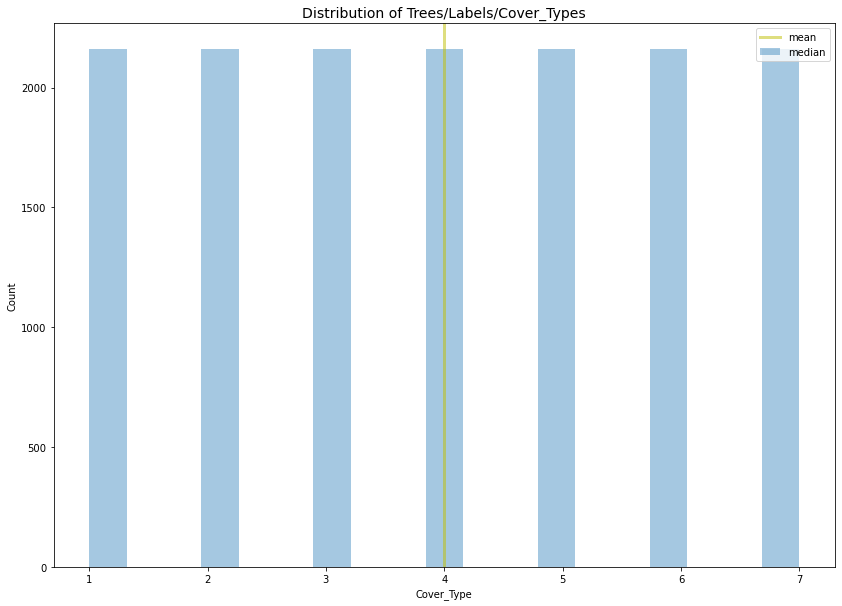

In [18]:
# #checking class distribution of Cover_Type

#set the plot size
figsize(14,10)

#set the histogram, mean and median
sns.distplot(df_rev['Cover_Type'], kde=False)
plt.axvline(x=df_rev.Cover_Type.median(), linewidth=3, color='y', label='median', alpha=0.5)

#set title, legends and labels
plt.xlabel('Cover_Type')
plt.ylabel('Count')
plt.title('Distribution of Trees/Labels/Cover_Types', size=14)
plt.legend(['mean', 'median'])

No handles with labels found to put in legend.


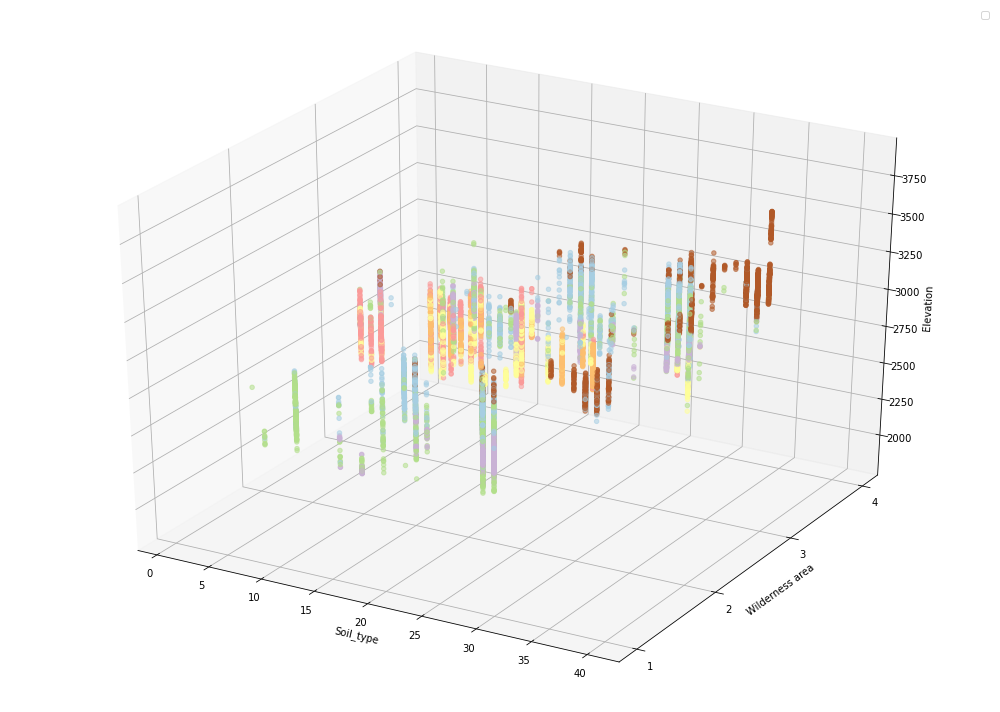

In [19]:
# #Cover_Type distribution according to Soil_Type, Wilderness_Area and Elevation

fig1 = plt.figure()
ax1 = fig1.add_subplot(111, projection='3d')

ax1.scatter(df_rev.Soil_Type, df_rev.Wilderness_Area, df_rev.Elevation, c=((df_rev.Cover_Type-1).array.astype(float)), cmap='Paired', alpha=0.55)

ax1.set_xlabel('Soil_type')
ax1.set_ylabel('Wilderness area')
ax1.set_zlabel('Elevation')
# ax1.set_label()
plt.yticks(np.arange(1, 5, step=1), np.array(['1', '2', '3', '4']))

ax1.legend()
plt.tight_layout()

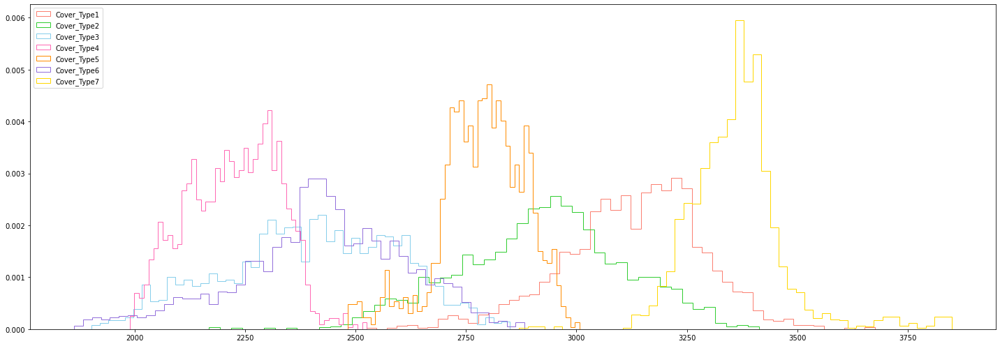

In [20]:
# #distribution of Cover_Type according to Elevation

fig2 = plt.figure(figsize=(20,7))
ax2 = fig2.add_subplot()

for i in range (df_rev.Cover_Type.nunique()):
    ax2.hist(df_rev.Elevation[df_rev.Cover_Type == (i+1)], bins=50, histtype='step', color=colors[i], label=('Cover_Type'+str(i+1)), density=True, )
    
    
ax2.legend()    
plt.tight_layout()

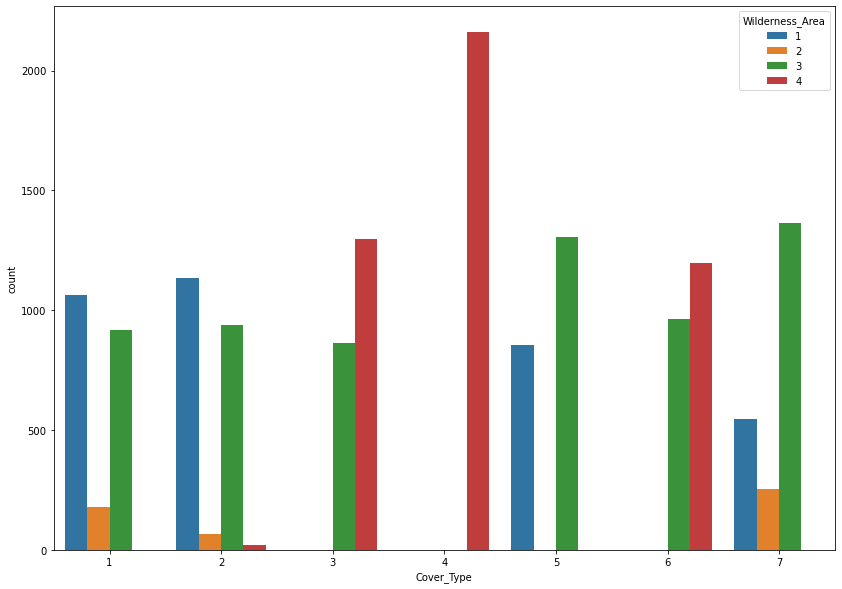

In [21]:
# # #distribution of Cover_Type in different Wilderness_Area values
figsize(14,10)

# plot cover_type distribution for each wilderness area
sns.countplot( x = df_rev['Cover_Type'], hue = df_rev['Wilderness_Area'])

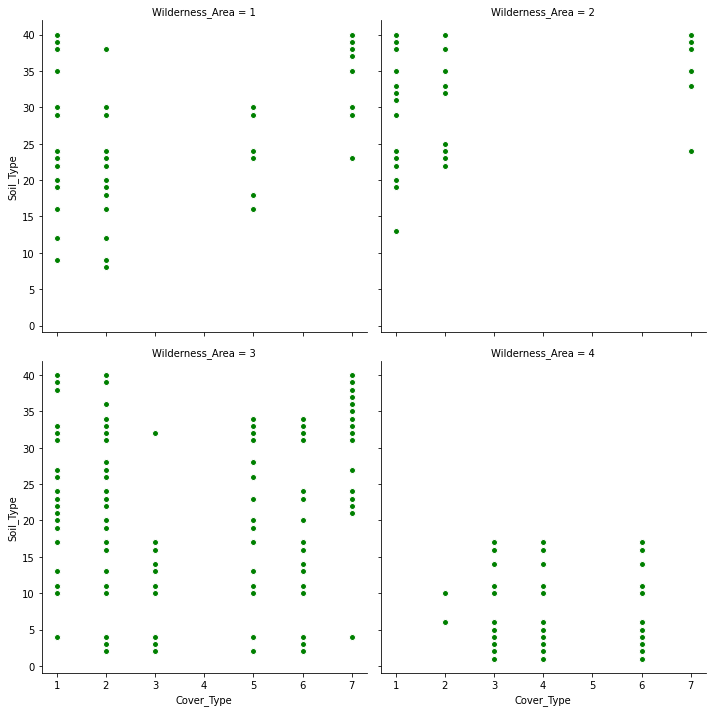

In [22]:
# # plot relationship of soil type and cover type among different wilderness areas
g = sns.FacetGrid(df_rev, col='Wilderness_Area', 
                  col_wrap=2, height=5, col_order=sorted(df_rev['Wilderness_Area'].unique()))
g = g.map(plt.scatter, 'Cover_Type', 'Soil_Type', edgecolor="w", color="g")

In [23]:
#setting points for dividing Elevation feature:

mark1 = 2650
mark2 = 2950

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


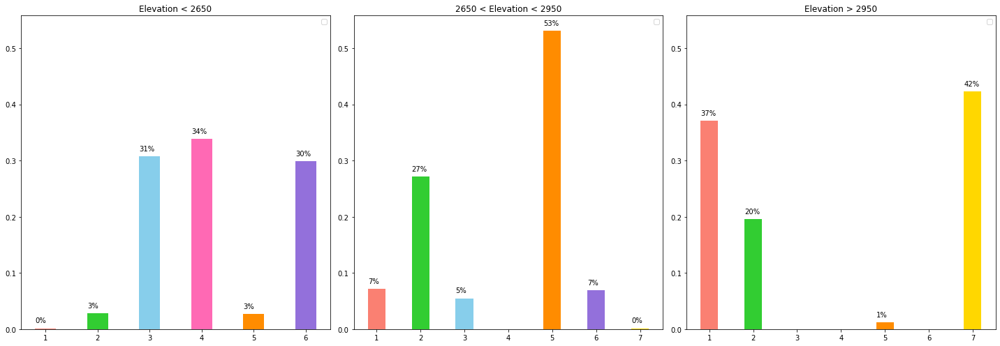

In [24]:
# #checking Cover_Type distribution based on Elevation split
'''# #caution: error oko ax21, proveriti!!!'''

fig4 = plt.figure( figsize = (20,7))
ax21 = fig4.add_subplot(131)
ax22 = fig4.add_subplot(132, sharey = ax21)
ax23 = fig4.add_subplot(133, sharey = ax21)

width = 0.40

cover_type_sum_1 = df_rev[(df_rev.Elevation <= mark1)].Cover_Type.value_counts().sum()
cover_type_sum_2 = df_rev[((df_rev.Elevation > mark1) & (df_rev.Elevation < mark2))].Cover_Type.value_counts().sum()
cover_type_sum_3 = df_rev[(df_rev.Elevation >= mark2)].Cover_Type.value_counts().sum()


for i in np.array(list(df_rev[(df_rev.Elevation <= mark1)].Cover_Type.value_counts().sort_index().index)):
#     print(i)
#     print(df_rev[(df_rev.Elevation <= below)].Cover_Type.value_counts().sort_index()[i])
    ax21.bar(i, ((df_rev[(df_rev.Elevation <= mark1)].Cover_Type.value_counts().sort_index()[i]) / cover_type_sum_1), width=width, color = colors[i-1])
    
for p in ax21.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax21.annotate('{:.0%}'.format(height), (x, y + height + 0.01))
    

for i in np.array(list(df_rev[((df_rev.Elevation > mark1) & (df_rev.Elevation < mark2))].Cover_Type.value_counts().sort_index().index)):
#     print(i)
#     print(df_rev[((df_rev.Elevation > above) & (df_rev.Elevation < below))].Cover_Type.value_counts().sort_index()[i])
    ax22.bar(i, ((df_rev[((df_rev.Elevation > mark1) & (df_rev.Elevation < mark2))].Cover_Type.value_counts().sort_index()[i]) / cover_type_sum_2), width=width, color = colors[i-1])
    
for p in ax22.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax22.annotate('{:.0%}'.format(height), (x, y + height + 0.01))

    
for i in np.array(list(df_rev[(df_rev.Elevation >= mark2)].Cover_Type.value_counts().sort_index().index)):
#     print(i)
#     print(df_rev[(df_rev.Elevation >= above)].Cover_Type.value_counts().sort_index()[i])
    ax23.bar(i, ((df_rev[(df_rev.Elevation >= mark2)].Cover_Type.value_counts().sort_index()[i]) / cover_type_sum_3), width=width, color = colors[i-1]) 

for p in ax23.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax23.annotate('{:.0%}'.format(height), (x, y + height + 0.01))    

    
ax21.legend()
ax21.set_title('Elevation < {}'.format(mark1))

ax22.legend()
ax22.set_title('{} < Elevation < {}'.format(mark1, mark2))

ax23.legend()
ax23.set_title('Elevation > {}'.format(mark2))


plt.tight_layout()
plt.show()

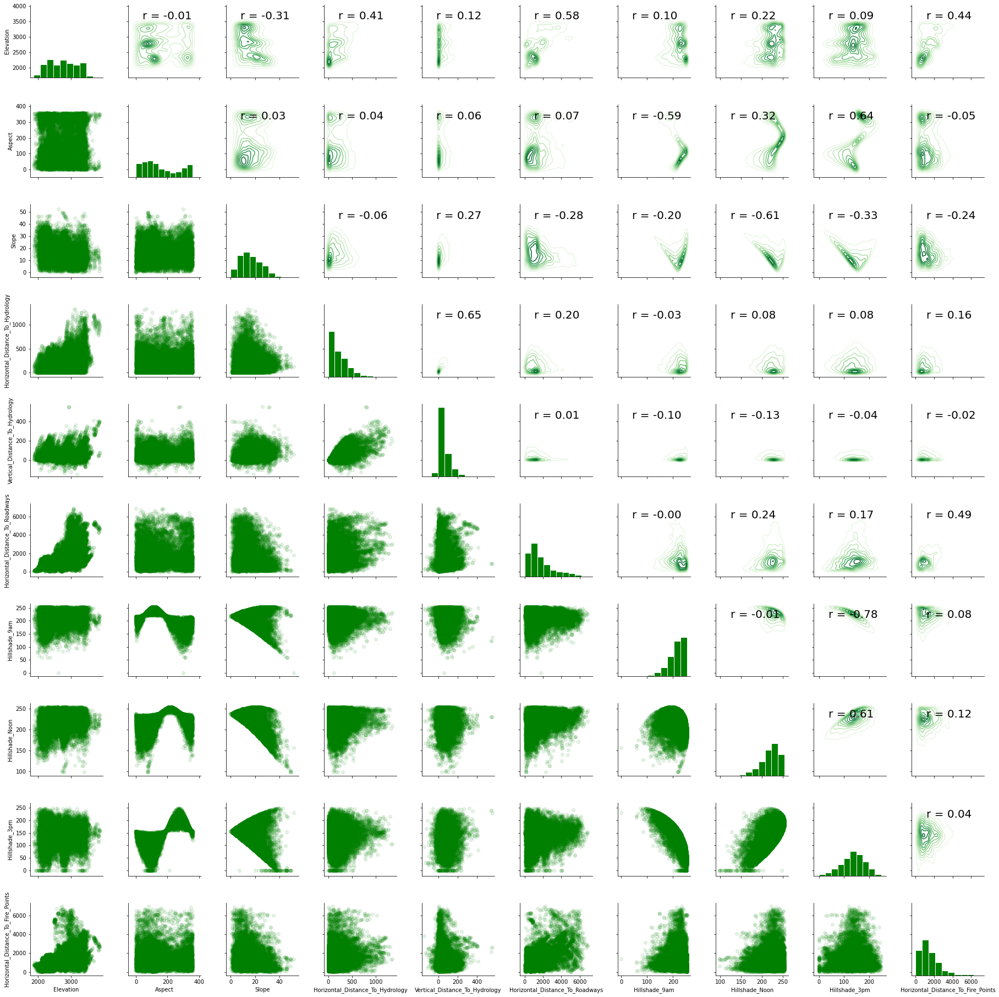

In [25]:
# # Create the pairgrid object
grid = sns.PairGrid(data = df_rev.loc[:, :'Horizontal_Distance_To_Fire_Points'])

# Upper is a correlation and kdeplot
grid.map_upper(corr_func)
grid.map_upper(sns.kdeplot, cmap = plt.cm.Greens)

# Diagonal is a histogram
grid.map_diag(plt.hist, color = 'green', edgecolor = 'white')

# Bottom is scatter plot
grid.map_lower(plt.scatter, color = 'green', alpha = 0.1)

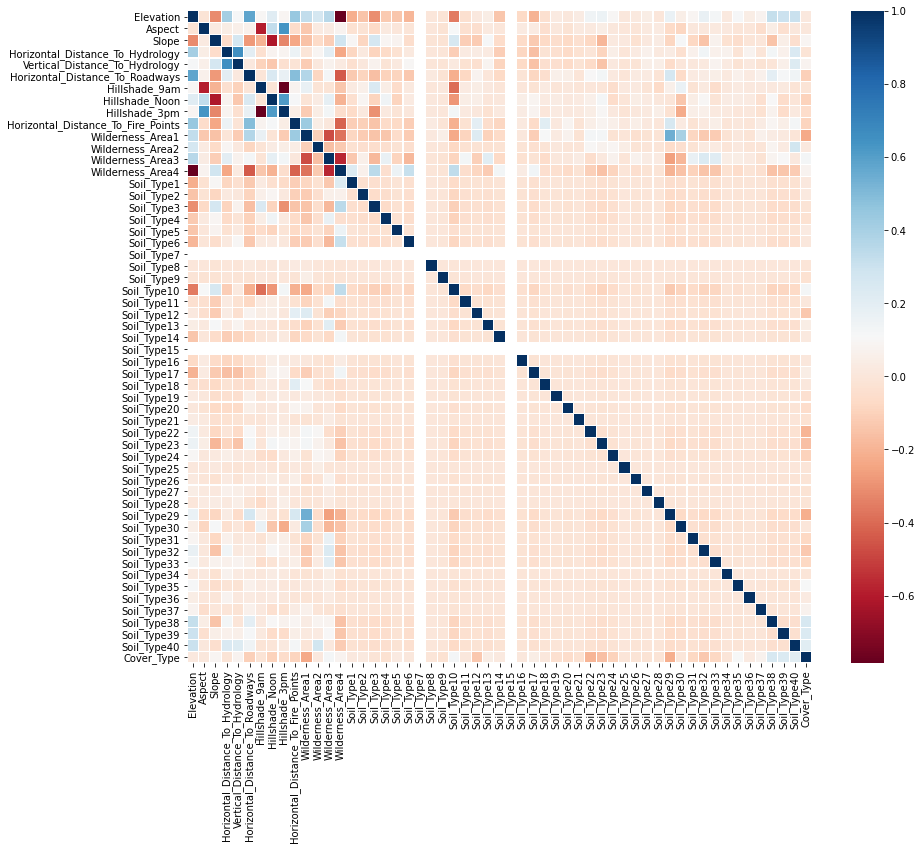

In [26]:
# #correlation heatmap

plt.figure(figsize=(14,12))

#plot heatmap set the title
colormap = plt.cm.RdBu
sns.heatmap(df_one.corr(), linewidths=0.1, vmax=1.0, square=False, cmap=colormap, linecolor='white', annot=False)

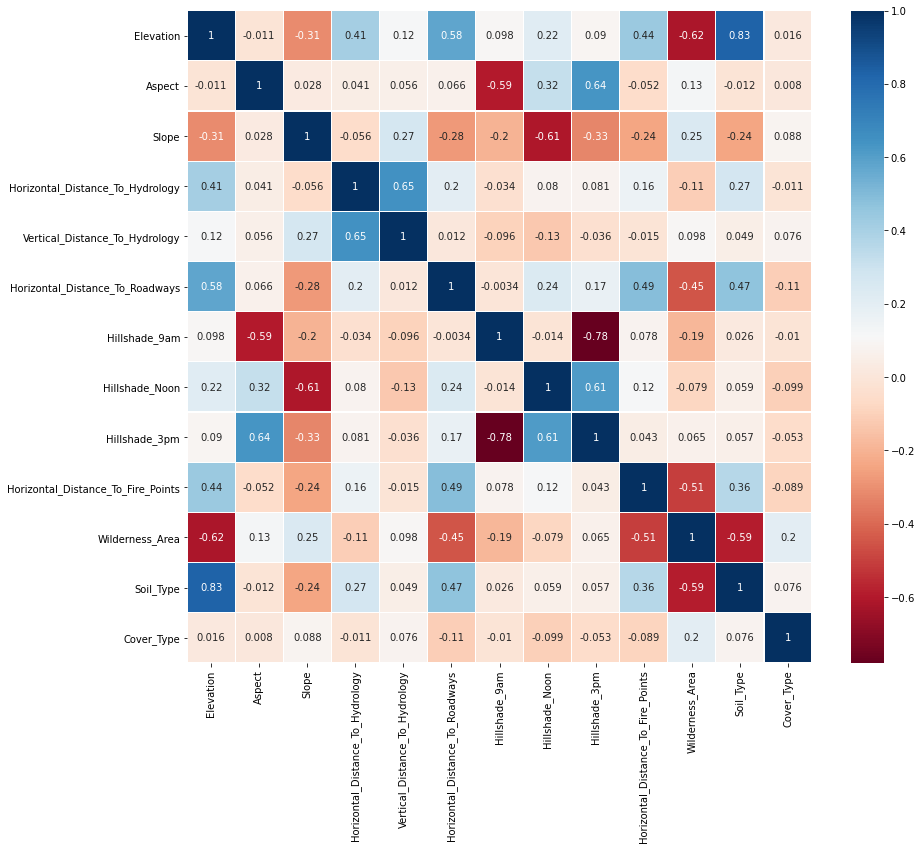

In [27]:
# #correlation heatmap

plt.figure(figsize=(14,12))

#plot heatmap set the title
colormap = plt.cm.RdBu
sns.heatmap(df_rev.corr(), linewidths=0.1, vmax=1.0, square=False, cmap=colormap, linecolor='white', annot=True)

In [28]:
#feature engineering - adding euclidian distance to hydrology (a^2+b^2=c^2)
df_one_net.insert(52, 'Euclidian_Distance_To_Hydrology', round((df_one_net['Horizontal_Distance_To_Hydrology']**2 + df_one_net['Vertical_Distance_To_Hydrology']**2)**0.5))
df_rev_net.insert(12, 'Euclidian_Distance_To_Hydrology', round((df_one_net['Horizontal_Distance_To_Hydrology']**2 + df_one_net['Vertical_Distance_To_Hydrology']**2)**0.5))

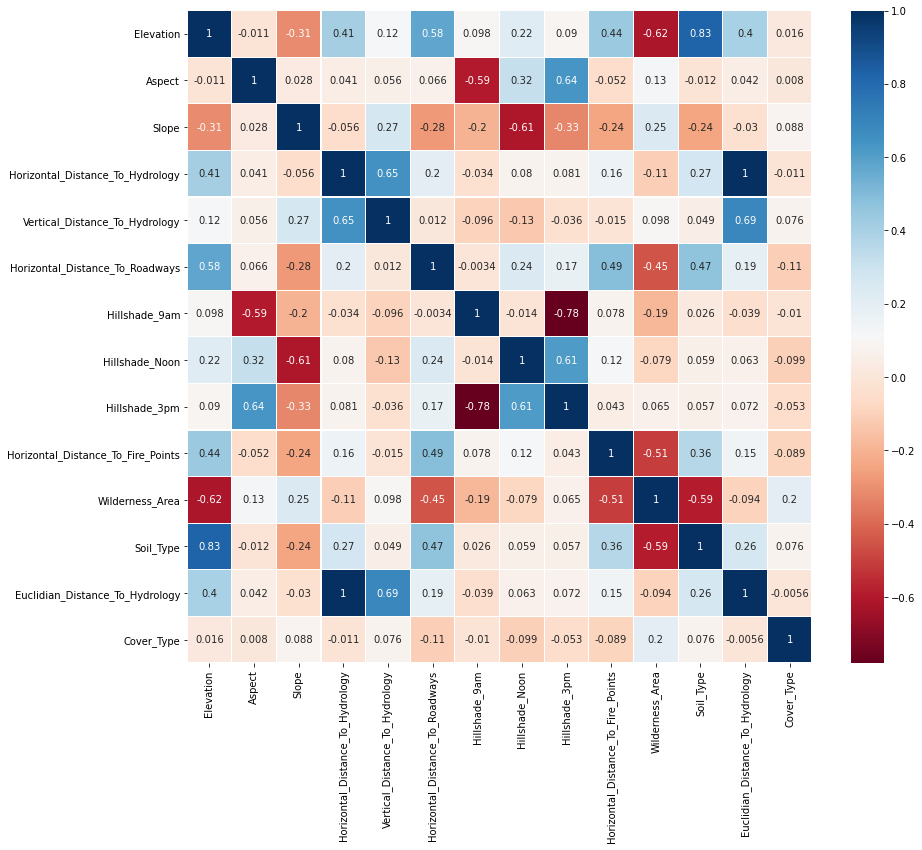

In [29]:
# #correlation heatmap

plt.figure(figsize=(14,12))

#plot heatmap set the title
colormap = plt.cm.RdBu
sns.heatmap(df_rev_net.corr(), linewidths=0.1, vmax=1.0, square=False, cmap=colormap, linecolor='white', annot=True)

In [30]:
correlations_transformed = df_rev_net.corr()
correlations_transformed = correlations_transformed["Cover_Type"].reset_index()

# format, and display sorted correlations_transformed
correlations_transformed.columns = ["Feature", "Correlation with Cover_Type"]
correlations_transformed = (correlations_transformed[correlations_transformed["Feature"] != "Cover_Type"].sort_values(by="Correlation with Cover_Type", ascending=False))
display(correlations_transformed)

,Feature,Correlation with Cover_Type
10,Wilderness_Area,0.203883
2,Slope,0.087722
11,Soil_Type,0.076205
4,Vertical_Distance_To_Hydrology,0.075647
0,Elevation,0.016090
1,Aspect,0.008015
12,Euclidian_Distance_To_Hydrology,-0.005552
6,Hillshade_9am,-0.010286
3,Horizontal_Distance_To_Hydrology,-0.010515
8,Hillshade_3pm,-0.053399


In [31]:
#splitting dataset according to Elevation marks

df1_one = df_one[(df_one.Elevation <= mark1)]
df2_one = df_one[((df_one.Elevation > mark1) & (df_one.Elevation < mark2))]
df3_one = df_one[(df_one.Elevation >= mark2)]

df1_one_net = df_one_net[(df_one_net.Elevation <= mark1)]
df2_one_net = df_one_net[((df_one_net.Elevation > mark1) & (df_one_net.Elevation < mark2))]
df3_one_net = df_one_net[(df_one_net.Elevation >= mark2)]

df1_rev = df_rev[(df_rev.Elevation <= mark1)]
df2_rev = df_rev[((df_rev.Elevation > mark1) & (df_rev.Elevation < mark2))]
df3_rev = df_rev[(df_rev.Elevation >= mark2)]

df1_rev_net = df_rev_net[(df_rev_net.Elevation <= mark1)]
df2_rev_net = df_rev_net[((df_rev_net.Elevation > mark1) & (df_rev_net.Elevation < mark2))]
df3_rev_net = df_rev_net[(df_rev_net.Elevation >= mark2)]

In [175]:
# loop through all columns to see if there are any outliers

df_out_index = ['df1_one', 'df2_one', 'df3_one'] #, 'df1_one_net', 'df2_one_net', 'df3_one_net', 'df1_rev', 'df2_rev', 'df3_rev', 'df1_rev_net', 'df2_rev_net', 'df3_rev_net']

df_out_num = pd.DataFrame(columns = df.columns, index = df_out_index).drop(columns = 'Id')

for column in df1_one.columns:
    if outlier_function(df1_one, column, 1)[2] > 0:
        df_out_num.loc['df1_one', column] = outlier_function(df1_one, column, 1)[2]
        #print(outlier_function(df1_one, column, 1)[2], ' ', column)

for column in df2_one.columns:
    if outlier_function(df2_one, column, 1)[2] > 0:
        df_out_num.loc['df2_one', column] = outlier_function(df2_one, column, 1)[2]
        #print(outlier_function(df2_one, column, 1)[2], ' ', column)
        
for column in df3_one.columns:
    if outlier_function(df3_one, column, 1)[2] > 0:
        df_out_num.loc['df3_one', column] = outlier_function(df3_one, column, 1)[2]
        #print(outlier_function(df3_one, column, 1)[2], ' ', column)

In [33]:
df_out_num

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Wilderness_Area,Soil_Type,Cover_Type
df1_one,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,NaN,93,160,NaN,1551,NaN,355,563,956,593,165,650,NaN,NaN,10,NaN,181,13,28,169,NaN,92,490,60,NaN,41,NaN,1,6,6,NaN,NaN,NaN,3,42,17,NaN,NaN,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
df2_one,NaN,NaN,NaN,10,5,NaN,6,13,NaN,63,NaN,NaN,NaN,NaN,NaN,60,6,243,NaN,NaN,NaN,1,NaN,237,221,176,397,NaN,NaN,20,122,NaN,25,61,1,12,242,73,NaN,45,NaN,6,499,569,144,213,252,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
df3_one,NaN,NaN,8,NaN,39,NaN,6,13,NaN,NaN,NaN,499,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,2,4,38,51,NaN,NaN,2,NaN,NaN,21,37,15,332,509,178,1,9,15,NaN,750,139,188,477,322,11,102,10,34,728,657,459,NaN,NaN,NaN


In [34]:
#removing Firepoints outliers

df1_one = df1_one[(df1_one['Horizontal_Distance_To_Fire_Points'] > outlier_function(df1_one, 'Horizontal_Distance_To_Fire_Points', 1)[0]) & (df1_one['Horizontal_Distance_To_Fire_Points'] < outlier_function(df1_one, 'Horizontal_Distance_To_Fire_Points', 1)[1])]
df2_one = df2_one[(df2_one['Horizontal_Distance_To_Fire_Points'] > outlier_function(df2_one, 'Horizontal_Distance_To_Fire_Points', 1)[0]) & (df2_one['Horizontal_Distance_To_Fire_Points'] < outlier_function(df2_one, 'Horizontal_Distance_To_Fire_Points', 1)[1])]
df1_one_net = df1_one_net[(df1_one_net['Horizontal_Distance_To_Fire_Points'] > outlier_function(df1_one_net, 'Horizontal_Distance_To_Fire_Points', 1)[0]) & (df1_one_net['Horizontal_Distance_To_Fire_Points'] < outlier_function(df1_one_net, 'Horizontal_Distance_To_Fire_Points', 1)[1])]
df2_one_net = df2_one_net[(df2_one_net['Horizontal_Distance_To_Fire_Points'] > outlier_function(df2_one_net, 'Horizontal_Distance_To_Fire_Points', 1)[0]) & (df2_one_net['Horizontal_Distance_To_Fire_Points'] < outlier_function(df2_one_net, 'Horizontal_Distance_To_Fire_Points', 1)[1])]

df1_rev = df1_rev[(df1_rev['Horizontal_Distance_To_Fire_Points'] > outlier_function(df1_rev, 'Horizontal_Distance_To_Fire_Points', 1)[0]) & (df1_rev['Horizontal_Distance_To_Fire_Points'] < outlier_function(df1_rev, 'Horizontal_Distance_To_Fire_Points', 1)[1])]
df2_rev = df2_rev[(df2_rev['Horizontal_Distance_To_Fire_Points'] > outlier_function(df2_rev, 'Horizontal_Distance_To_Fire_Points', 1)[0]) & (df2_rev['Horizontal_Distance_To_Fire_Points'] < outlier_function(df2_rev, 'Horizontal_Distance_To_Fire_Points', 1)[1])]
df1_rev_net = df1_rev_net[(df1_rev_net['Horizontal_Distance_To_Fire_Points'] > outlier_function(df1_rev_net, 'Horizontal_Distance_To_Fire_Points', 1)[0]) & (df1_rev_net['Horizontal_Distance_To_Fire_Points'] < outlier_function(df1_rev_net, 'Horizontal_Distance_To_Fire_Points', 1)[1])]
df2_rev_net = df2_rev_net[(df2_rev_net['Horizontal_Distance_To_Fire_Points'] > outlier_function(df2_rev_net, 'Horizontal_Distance_To_Fire_Points', 1)[0]) & (df2_rev_net['Horizontal_Distance_To_Fire_Points'] < outlier_function(df2_rev_net, 'Horizontal_Distance_To_Fire_Points', 1)[1])]

In [35]:
#check if same outliers were removed from all datasets

df1_one.shape[0] == df1_one_net.shape[0] == df1_rev.shape[0] == df1_rev_net.shape[0]
df2_one.shape[0] == df2_one_net.shape[0] == df2_rev.shape[0] == df2_rev_net.shape[0]

True

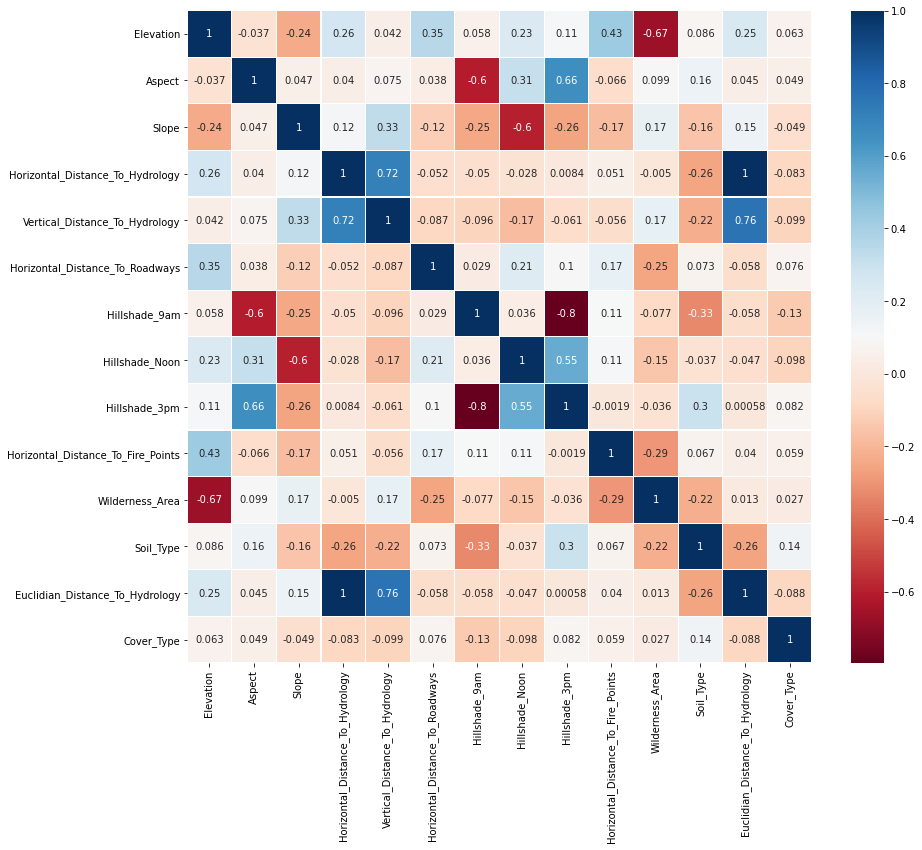

In [36]:
# #correlation heatmap

plt.figure(figsize=(14,12))

#plot heatmap set the title
colormap = plt.cm.RdBu
sns.heatmap(df1_rev_net.corr(), linewidths=0.1, vmax=1.0, square=False, cmap=colormap, linecolor='white', annot=True)

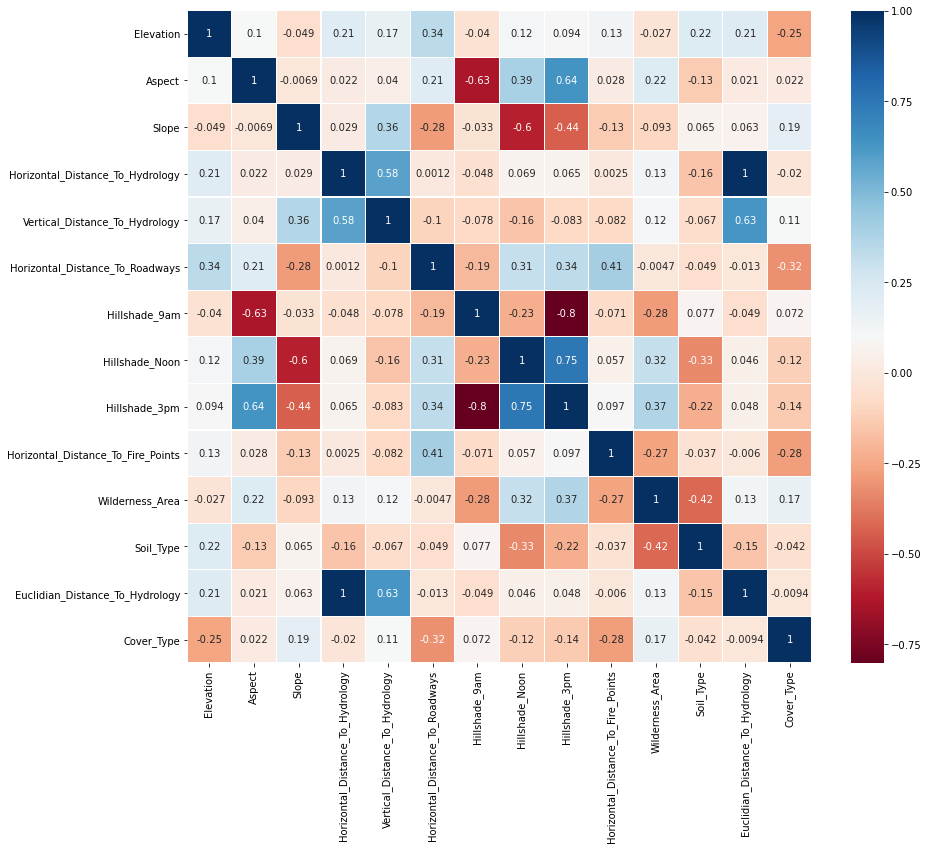

In [37]:
# #correlation heatmap

plt.figure(figsize=(14,12))

#plot heatmap set the title
colormap = plt.cm.RdBu
sns.heatmap(df2_rev_net.corr(), linewidths=0.1, vmax=1.0, square=False, cmap=colormap, linecolor='white', annot=True)

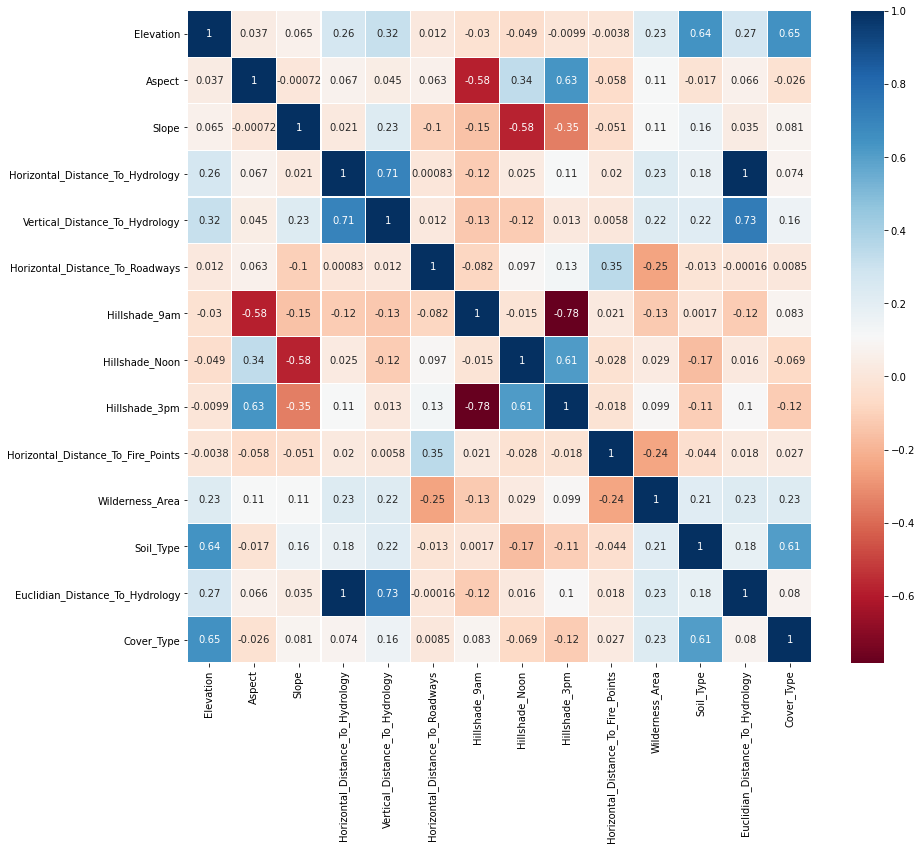

In [38]:
# #correlation heatmap

plt.figure(figsize=(14,12))

#plot heatmap set the title
colormap = plt.cm.RdBu
sns.heatmap(df3_rev_net.corr(), linewidths=0.1, vmax=1.0, square=False, cmap=colormap, linecolor='white', annot=True)

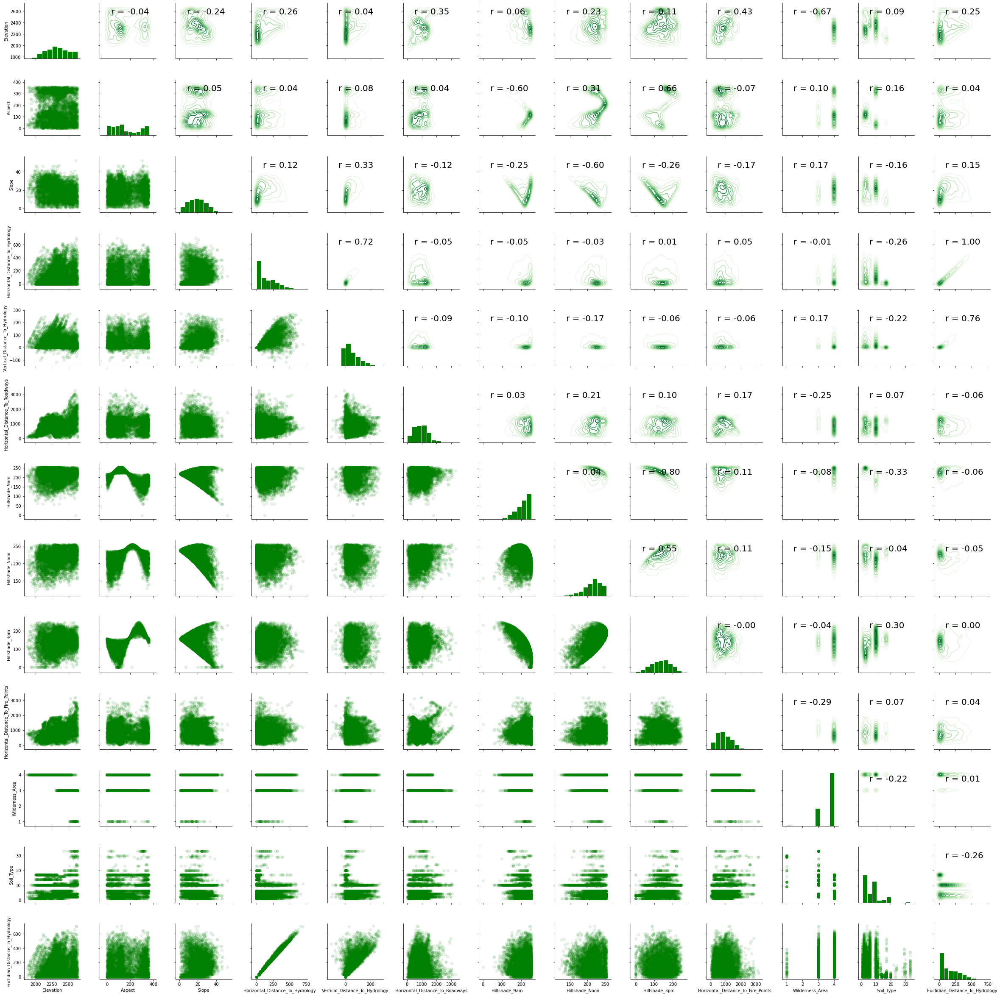

In [39]:
# # Create the pairgrid object
grid = sns.PairGrid(data = df1_rev_net.loc[:, :'Euclidian_Distance_To_Hydrology'])

# Upper is a correlation and kdeplot
grid.map_upper(corr_func)
grid.map_upper(sns.kdeplot, cmap = plt.cm.Greens)

# Diagonal is a histogram
grid.map_diag(plt.hist, color = 'green', edgecolor = 'white')

# Bottom is scatter plot
grid.map_lower(plt.scatter, color = 'green', alpha = 0.1)

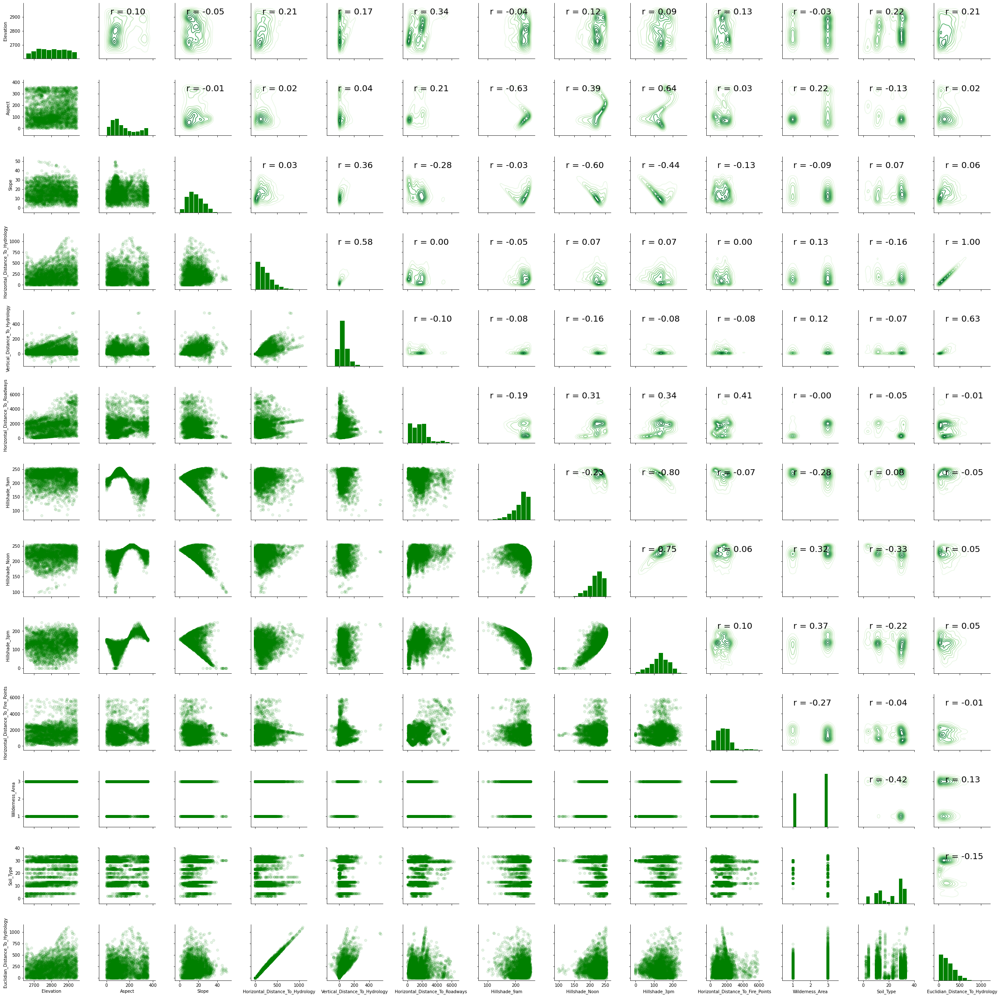

In [40]:
# # Create the pairgrid object
grid = sns.PairGrid(data = df2_rev_net.loc[:, :'Euclidian_Distance_To_Hydrology'])

# Upper is a correlation and kdeplot
grid.map_upper(corr_func)
grid.map_upper(sns.kdeplot, cmap = plt.cm.Greens)

# Diagonal is a histogram
grid.map_diag(plt.hist, color = 'green', edgecolor = 'white')

# Bottom is scatter plot
grid.map_lower(plt.scatter, color = 'green', alpha = 0.1)

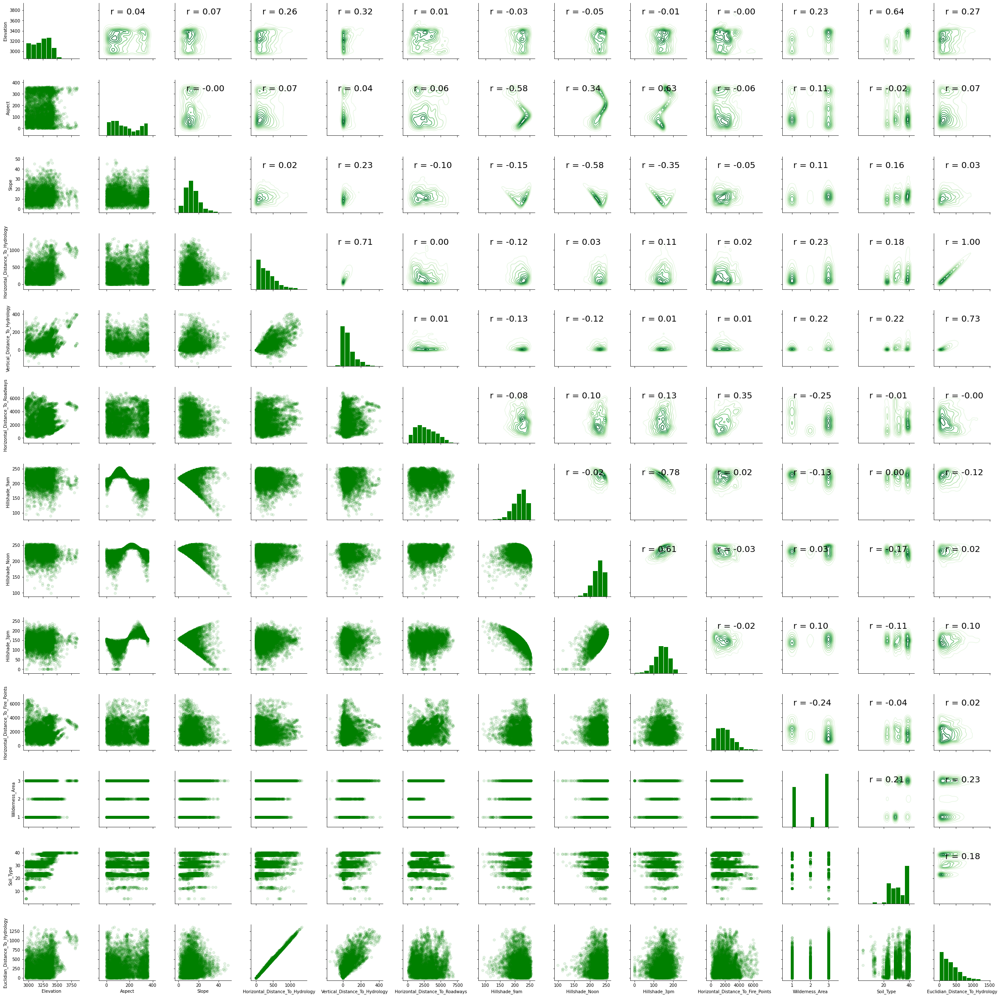

In [41]:
# # Create the pairgrid object
grid = sns.PairGrid(data = df3_rev_net.loc[:, :'Euclidian_Distance_To_Hydrology'])

# Upper is a correlation and kdeplot
grid.map_upper(corr_func)
grid.map_upper(sns.kdeplot, cmap = plt.cm.Greens)

# Diagonal is a histogram
grid.map_diag(plt.hist, color = 'green', edgecolor = 'white')

# Bottom is scatter plot
grid.map_lower(plt.scatter, color = 'green', alpha = 0.1)

In [46]:
#drop certain Cover Type, because of their underrepresentation in various Elevations:

df1_one.drop(df1_one[df1_one.Cover_Type == 1].index, inplace=True)
df2_one.drop(df2_one[df2_one.Cover_Type == 7].index, inplace=True)
df3_one.drop(df3_one[df3_one.Cover_Type == 5].index, inplace=True)

df1_one_net.drop(df1_one_net[df1_one_net.Cover_Type == 1].index, inplace=True)
df2_one_net.drop(df2_one_net[df2_one_net.Cover_Type == 7].index, inplace=True)
df3_one_net.drop(df3_one_net[df3_one_net.Cover_Type == 5].index, inplace=True)

df1_rev.drop(df1_rev[df1_rev.Cover_Type == 1].index, inplace=True)
df2_rev.drop(df2_rev[df2_rev.Cover_Type == 7].index, inplace=True)
df3_rev.drop(df3_rev[df3_rev.Cover_Type == 5].index, inplace=True)

df1_rev_net.drop(df1_rev_net[df1_rev_net.Cover_Type == 1].index, inplace=True)
df2_rev_net.drop(df2_rev_net[df2_rev_net.Cover_Type == 7].index, inplace=True)
df3_rev_net.drop(df3_rev_net[df3_rev_net.Cover_Type == 5].index, inplace=True)

In [47]:
#check if removal provided consistent results:

df1_one.shape[0] == df1_one_net.shape[0] == df1_rev.shape[0]  == df1_rev_net.shape[0]
df2_one.shape[0] == df2_one_net.shape[0] == df2_rev.shape[0]  == df2_rev_net.shape[0]
df3_one.shape[0] == df3_one_net.shape[0] == df3_rev.shape[0]  == df3_rev_net.shape[0]

True

In [48]:
#split all datasets to X and Y subsets:

df1_one_x = split_dataset(df1_one)[0]
df1_one_y = split_dataset(df1_one)[1]

df2_one_x = split_dataset(df2_one)[0]
df2_one_y = split_dataset(df2_one)[1]

df3_one_x = split_dataset(df3_one)[0]
df3_one_y = split_dataset(df3_one)[1]


df1_one_net_x = split_dataset(df1_one_net)[0]
df1_one_net_y = split_dataset(df1_one_net)[1]

df2_one_net_x = split_dataset(df2_one_net)[0]
df2_one_net_y = split_dataset(df2_one_net)[1]

df3_one_net_x = split_dataset(df3_one_net)[0]
df3_one_net_y = split_dataset(df3_one_net)[1]


df1_rev_x = split_dataset(df1_rev)[0]
df1_rev_y = split_dataset(df1_rev)[1]

df2_rev_x = split_dataset(df2_rev)[0]
df2_rev_y = split_dataset(df2_rev)[1]

df3_rev_x = split_dataset(df3_rev)[0]
df3_rev_y = split_dataset(df3_rev)[1]


df1_rev_net_x = split_dataset(df1_rev_net)[0]
df1_rev_net_y = split_dataset(df1_rev_net)[1]

df2_rev_net_x = split_dataset(df2_rev_net)[0]
df2_rev_net_y = split_dataset(df2_rev_net)[1]

df3_rev_net_x = split_dataset(df3_rev_net)[0]
df3_rev_net_y = split_dataset(df3_rev_net)[1]


In [49]:
#creating scalers:

scaler1_one = StandardScaler()
scaler2_one = StandardScaler()
scaler3_one = StandardScaler()

scaler1_one_net = StandardScaler()
scaler2_one_net = StandardScaler()
scaler3_one_net = StandardScaler()

scaler1_rev = StandardScaler()
scaler2_rev = StandardScaler()
scaler3_rev = StandardScaler()

scaler1_rev_net = StandardScaler()
scaler2_rev_net = StandardScaler()
scaler3_rev_net = StandardScaler()

In [50]:
#splitting and normalization df_one dataset to train/test:

X1_one_train, X1_one_test, y1_one_train, y1_one_test = train_test_split(df1_one_x, df1_one_y)
X2_one_train, X2_one_test, y2_one_train, y2_one_test = train_test_split(df2_one_x, df2_one_y)
X3_one_train, X3_one_test, y3_one_train, y3_one_test = train_test_split(df3_one_x, df3_one_y)


scaler1_one.fit(X1_one_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X1_one_train_1 = scaler1_one.transform(X1_one_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X1_one_train_1 = np.append(X1_one_train_1, np.array(X1_one_train.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)
X1_one_test_1 = scaler1_one.transform(X1_one_test.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X1_one_test_1 = np.append(X1_one_test_1, np.array(X1_one_test.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

scaler2_one.fit(X2_one_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X2_one_train_2 = scaler2_one.transform(X2_one_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X2_one_train_2 = np.append(X2_one_train_2, np.array(X2_one_train.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)
X2_one_test_2 = scaler2_one.transform(X2_one_test.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X2_one_test_2 = np.append(X2_one_test_2, np.array(X2_one_test.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

scaler3_one.fit(X3_one_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X3_one_train_3 = scaler3_one.transform(X3_one_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X3_one_train_3 = np.append(X3_one_train_3, np.array(X3_one_train.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)
X3_one_test_3 = scaler3_one.transform(X3_one_test.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X3_one_test_3 = np.append(X3_one_test_3, np.array(X3_one_test.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

In [51]:
# #splitting and normalization df_one_net dataset to train/test:

X1_one_net_train, X1_one_net_test, y1_one_net_train, y1_one_net_test = train_test_split(df1_one_net_x, df1_one_net_y)
X2_one_net_train, X2_one_net_test, y2_one_net_train, y2_one_net_test = train_test_split(df2_one_net_x, df2_one_net_y)
X3_one_net_train, X3_one_net_test, y3_one_net_train, y3_one_net_test = train_test_split(df3_one_net_x, df3_one_net_y)


scaler1_one_net.fit(X1_one_net_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X1_one_net_train_1 = scaler1_one_net.transform(X1_one_net_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X1_one_net_train_1 = np.append(X1_one_net_train_1, np.array(X1_one_net_train.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)
X1_one_net_test_1 = scaler1_one_net.transform(X1_one_net_test.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X1_one_net_test_1 = np.append(X1_one_net_test_1, np.array(X1_one_net_test.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

scaler2_one_net.fit(X2_one_net_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X2_one_net_train_2 = scaler2_one_net.transform(X2_one_net_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X2_one_net_train_2 = np.append(X2_one_net_train_2, np.array(X2_one_net_train.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)
X2_one_net_test_2 = scaler2_one_net.transform(X2_one_net_test.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X2_one_net_test_2 = np.append(X2_one_net_test_2, np.array(X2_one_net_test.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

scaler3_one_net.fit(X3_one_net_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X3_one_net_train_3 = scaler3_one_net.transform(X3_one_net_train.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X3_one_net_train_3 = np.append(X3_one_net_train_3, np.array(X3_one_net_train.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)
X3_one_net_test_3 = scaler3_one_net.transform(X3_one_net_test.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X3_one_net_test_3 = np.append(X3_one_net_test_3, np.array(X3_one_net_test.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6',  'Soil_Type7',  'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',  'Soil_Type15',  'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

In [52]:
#splitting and normalization df_rev dataset to train/test:

X1_rev_train, X1_rev_test, y1_rev_train, y1_rev_test = train_test_split(df1_rev_x, df1_rev_y)
X2_rev_train, X2_rev_test, y2_rev_train, y2_rev_test = train_test_split(df2_rev_x, df2_rev_y)
X3_rev_train, X3_rev_test, y3_rev_train, y3_rev_test = train_test_split(df3_rev_x, df3_rev_y)


scaler1_rev.fit(X1_rev_train)
X1_rev_train_1 = scaler1_rev.transform(X1_rev_train)
X1_rev_test_1 = scaler1_rev.transform(X1_rev_test)

scaler2_rev.fit(X2_rev_train)
X2_rev_train_2 = scaler2_rev.transform(X2_rev_train)
X2_rev_test_2 = scaler2_rev.transform(X2_rev_test)

scaler3_rev.fit(X3_rev_train)
X3_rev_train_3 = scaler3_rev.transform(X3_rev_train)
X3_rev_test_3 = scaler3_rev.transform(X3_rev_test)

In [53]:
#splitting and normalization df_rev_net dataset to train/test:

X1_rev_net_train, X1_rev_net_test, y1_rev_net_train, y1_rev_net_test = train_test_split(df1_rev_net_x, df1_rev_net_y)
X2_rev_net_train, X2_rev_net_test, y2_rev_net_train, y2_rev_net_test = train_test_split(df2_rev_net_x, df2_rev_net_y)
X3_rev_net_train, X3_rev_net_test, y3_rev_net_train, y3_rev_net_test = train_test_split(df3_rev_net_x, df3_rev_net_y)


scaler1_rev_net.fit(X1_rev_net_train)
X1_rev_net_train_1 = scaler1_rev_net.transform(X1_rev_net_train)
X1_rev_net_test_1 = scaler1_rev_net.transform(X1_rev_net_test)

scaler2_rev_net.fit(X2_rev_net_train)
X2_rev_net_train_2 = scaler2_rev_net.transform(X2_rev_net_train)
X2_rev_net_test_2 = scaler2_rev_net.transform(X2_rev_net_test)

scaler3_rev_net.fit(X3_rev_net_train)
X3_rev_net_train_3 = scaler3_rev_net.transform(X3_rev_net_train)
X3_rev_net_test_3 = scaler3_rev_net.transform(X3_rev_net_test)


In [54]:
########################################################
#######working only with df_one dataset#######
########################################################

In [55]:
#df_one create model apply fit_evaluate_model KNN:

knn_classifier1_one = KNeighborsClassifier()
knn_accuracy1_one = fit_evaluate_model(knn_classifier1_one, X1_one_train_1, y1_one_train, X1_one_test_1, y1_one_test)
print(knn_accuracy1_one[3])

knn_classifier2_one = KNeighborsClassifier()
knn_accuracy2_one = fit_evaluate_model(knn_classifier2_one, X2_one_train_2, y2_one_train, X2_one_test_2, y2_one_test)
print(knn_accuracy2_one[3])

knn_classifier3_one = KNeighborsClassifier()
knn_accuracy3_one = fit_evaluate_model(knn_classifier3_one, X3_one_train_3, y3_one_train, X3_one_test_3, y3_one_test)
print(knn_accuracy3_one[3])


              precision    recall  f1-score   support

           2       0.55      0.27      0.36        22
           3       0.83      0.73      0.77       492
           4       0.88      0.96      0.92       534
           5       0.64      0.64      0.64        22
           6       0.80      0.83      0.82       501

    accuracy                           0.83      1571
   macro avg       0.74      0.69      0.70      1571
weighted avg       0.83      0.83      0.83      1571

              precision    recall  f1-score   support

           1       0.56      0.26      0.36        57
           2       0.77      0.69      0.73       231
           3       0.78      0.67      0.72        57
           5       0.85      0.96      0.90       495
           6       0.74      0.77      0.75        52

    accuracy                           0.81       892
   macro avg       0.74      0.67      0.69       892
weighted avg       0.80      0.81      0.80       892

              precisio

In [56]:
#df_one create model apply fit_evaluate_model LGBM:

lgbm_classifier1_one = LGBMClassifier()
lgbm_accuracy1_one = fit_evaluate_model(lgbm_classifier1_one, X1_one_train_1, y1_one_train, X1_one_test_1, y1_one_test)
print(lgbm_accuracy1_one[3])

lgbm_classifier2_one = LGBMClassifier()
lgbm_accuracy2_one = fit_evaluate_model(lgbm_classifier2_one, X2_one_train_2, y2_one_train, X2_one_test_2, y2_one_test)
print(lgbm_accuracy2_one[3])

lgbm_classifier3_one = LGBMClassifier()
lgbm_accuracy3_one = fit_evaluate_model(lgbm_classifier3_one, X3_one_train_3, y3_one_train, X3_one_test_3, y3_one_test)
print(lgbm_accuracy3_one[3])


              precision    recall  f1-score   support

           2       0.50      0.27      0.35        22
           3       0.86      0.78      0.82       492
           4       0.94      0.97      0.96       534
           5       0.67      0.55      0.60        22
           6       0.82      0.88      0.85       501

    accuracy                           0.87      1571
   macro avg       0.76      0.69      0.71      1571
weighted avg       0.86      0.87      0.86      1571

              precision    recall  f1-score   support

           1       0.62      0.26      0.37        57
           2       0.79      0.81      0.80       231
           3       0.87      0.68      0.76        57
           5       0.90      0.97      0.93       495
           6       0.90      0.85      0.87        52

    accuracy                           0.86       892
   macro avg       0.81      0.71      0.75       892
weighted avg       0.85      0.86      0.85       892

              precisio

In [57]:
#df_one create model apply fit_evaluate_model Random Forest:

rf_classifier1_one = RandomForestClassifier()
rf_accuracy1_one = fit_evaluate_model(rf_classifier1_one, X1_one_train_1, y1_one_train, X1_one_test_1, y1_one_test)
print(rf_accuracy1_one[3])

rf_classifier2_one = RandomForestClassifier()
rf_accuracy2_one = fit_evaluate_model(rf_classifier2_one, X2_one_train_2, y2_one_train, X2_one_test_2, y2_one_test)
print(rf_accuracy2_one[3])

rf_classifier3_one = RandomForestClassifier()
rf_accuracy3_one = fit_evaluate_model(rf_classifier3_one, X3_one_train_3, y3_one_train, X3_one_test_3, y3_one_test)
print(rf_accuracy3_one[3])

              precision    recall  f1-score   support

           2       0.62      0.23      0.33        22
           3       0.87      0.78      0.82       492
           4       0.92      0.98      0.95       534
           5       0.78      0.64      0.70        22
           6       0.84      0.88      0.86       501

    accuracy                           0.87      1571
   macro avg       0.80      0.70      0.73      1571
weighted avg       0.87      0.87      0.87      1571

              precision    recall  f1-score   support

           1       0.54      0.12      0.20        57
           2       0.78      0.79      0.79       231
           3       0.89      0.72      0.80        57
           5       0.87      0.97      0.92       495
           6       0.89      0.79      0.84        52

    accuracy                           0.85       892
   macro avg       0.79      0.68      0.71       892
weighted avg       0.83      0.85      0.83       892

              precisio

In [58]:
#df_one create model apply fit_evaluate_model Extra Trees Rarndom Forest:

xrf_classifier1_one = ExtraTreesClassifier()
xrf_accuracy1_one = fit_evaluate_model(xrf_classifier1_one, X1_one_train_1, y1_one_train, X1_one_test_1, y1_one_test)
print(xrf_accuracy1_one[3])

xrf_classifier2_one = ExtraTreesClassifier()
xrf_accuracy2_one = fit_evaluate_model(xrf_classifier2_one, X2_one_train_2, y2_one_train, X2_one_test_2, y2_one_test)
print(xrf_accuracy2_one[3])

xrf_classifier3_one = ExtraTreesClassifier()
xrf_accuracy3_one = fit_evaluate_model(xrf_classifier3_one, X3_one_train_3, y3_one_train, X3_one_test_3, y3_one_test)
print(xrf_accuracy3_one[3])

              precision    recall  f1-score   support

           2       0.50      0.27      0.35        22
           3       0.89      0.79      0.84       492
           4       0.92      0.99      0.95       534
           5       0.73      0.73      0.73        22
           6       0.85      0.89      0.87       501

    accuracy                           0.88      1571
   macro avg       0.78      0.73      0.75      1571
weighted avg       0.88      0.88      0.88      1571

              precision    recall  f1-score   support

           1       0.74      0.25      0.37        57
           2       0.80      0.78      0.79       231
           3       0.84      0.75      0.80        57
           5       0.88      0.98      0.92       495
           6       0.93      0.83      0.88        52

    accuracy                           0.86       892
   macro avg       0.84      0.72      0.75       892
weighted avg       0.85      0.86      0.84       892

              precisio

In [59]:
#df_one create model apply fit_evaluate_model XGBoost:

xgb_classifier1_one = XGBClassifier()
xgb_accuracy1_one = fit_evaluate_model(xgb_classifier1_one, X1_one_train_1, y1_one_train, X1_one_test_1, y1_one_test)
print(xgb_accuracy1_one[3])

xgb_classifier2_one = XGBClassifier()
xgb_accuracy2_one = fit_evaluate_model(xgb_classifier2_one, X2_one_train_2, y2_one_train, X2_one_test_2, y2_one_test)
print(xgb_accuracy2_one[3])

xgb_classifier3_one = XGBClassifier()
xgb_accuracy3_one = fit_evaluate_model(xgb_classifier3_one, X3_one_train_3, y3_one_train, X3_one_test_3, y3_one_test)
print(xgb_accuracy3_one[3])

              precision    recall  f1-score   support

           2       0.50      0.23      0.31        22
           3       0.75      0.64      0.69       492
           4       0.87      0.96      0.91       534
           5       0.52      0.50      0.51        22
           6       0.74      0.79      0.76       501

    accuracy                           0.79      1571
   macro avg       0.68      0.62      0.64      1571
weighted avg       0.78      0.79      0.78      1571

              precision    recall  f1-score   support

           1       0.82      0.16      0.26        57
           2       0.76      0.65      0.70       231
           3       0.85      0.68      0.76        57
           5       0.82      0.98      0.89       495
           6       0.78      0.75      0.76        52

    accuracy                           0.81       892
   macro avg       0.81      0.64      0.68       892
weighted avg       0.80      0.81      0.79       892

              precisio

In [60]:
#df_one create model apply fit_evaluate_model MLPClassifier (NN):

mlp_classifier1_one = MLPClassifier(hidden_layer_sizes=(50), max_iter=1500)
mlp_accuracy1_one = fit_evaluate_model(mlp_classifier1_one, X1_one_train_1, y1_one_train, X1_one_test_1, y1_one_test)
print(mlp_accuracy1_one[3])

mlp_classifier2_one = MLPClassifier(hidden_layer_sizes=(50,50), max_iter=1500, alpha = 0.5)
mlp_accuracy2_one = fit_evaluate_model(mlp_classifier2_one, X2_one_train_2, y2_one_train, X2_one_test_2, y2_one_test)
print(mlp_accuracy2_one[3])

mlp_classifier3_one = MLPClassifier(hidden_layer_sizes=(80), max_iter=1500, alpha = 0.05)
mlp_accuracy3_one = fit_evaluate_model(mlp_classifier3_one, X3_one_train_3, y3_one_train, X3_one_test_3, y3_one_test)
print(mlp_accuracy3_one[3])

              precision    recall  f1-score   support

           2       0.44      0.36      0.40        22
           3       0.82      0.76      0.79       492
           4       0.93      0.96      0.95       534
           5       0.68      0.68      0.68        22
           6       0.81      0.85      0.83       501

    accuracy                           0.85      1571
   macro avg       0.74      0.72      0.73      1571
weighted avg       0.85      0.85      0.85      1571

              precision    recall  f1-score   support

           1       0.46      0.28      0.35        57
           2       0.79      0.77      0.78       231
           3       0.87      0.68      0.76        57
           5       0.89      0.96      0.92       495
           6       0.84      0.83      0.83        52

    accuracy                           0.84       892
   macro avg       0.77      0.70      0.73       892
weighted avg       0.83      0.84      0.83       892

              precisio

Text(0.5, 1.0, 'Accuracy Score of Different Models')

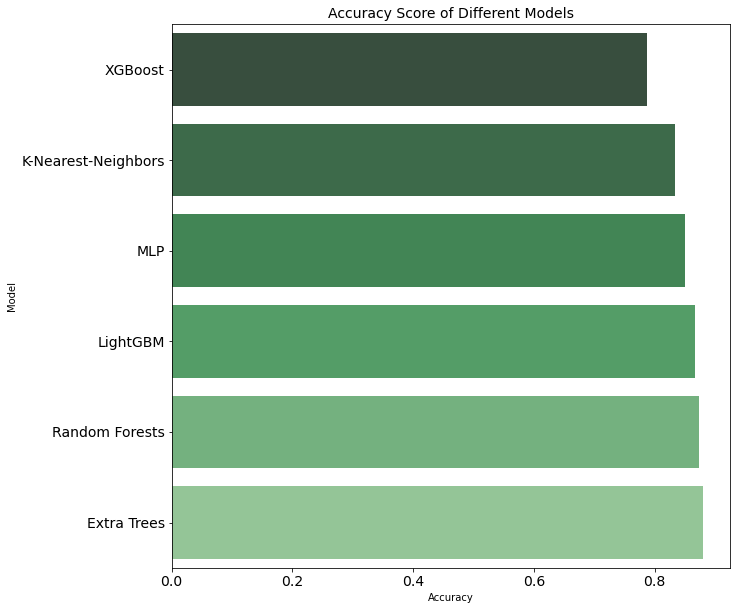

In [61]:
# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy1_one[1], lgbm_accuracy1_one[1], rf_accuracy1_one[1], xrf_accuracy1_one[1], xgb_accuracy1_one[1], mlp_accuracy1_one[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)

Text(0.5, 1.0, 'Accuracy Score of Different Models')

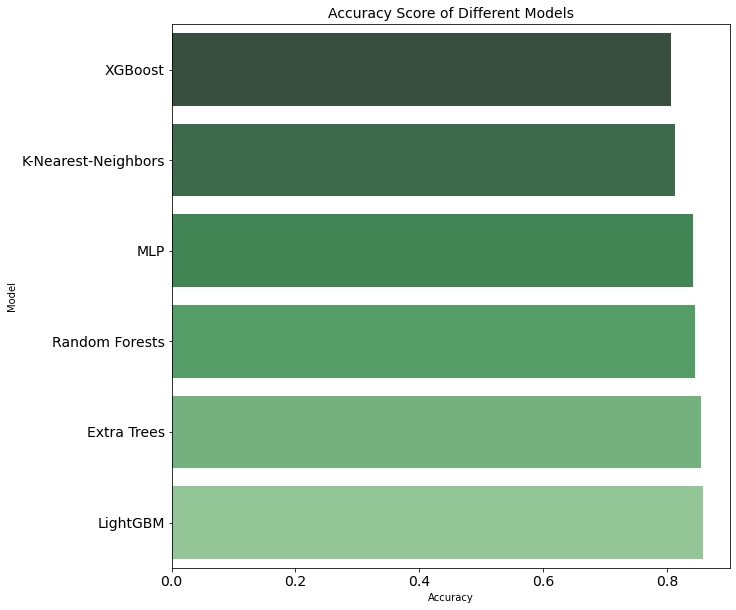

In [62]:
# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy2_one[1], lgbm_accuracy2_one[1], rf_accuracy2_one[1], xrf_accuracy2_one[1], xgb_accuracy2_one[1], mlp_accuracy2_one[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)

Text(0.5, 1.0, 'Accuracy Score of Different Models')

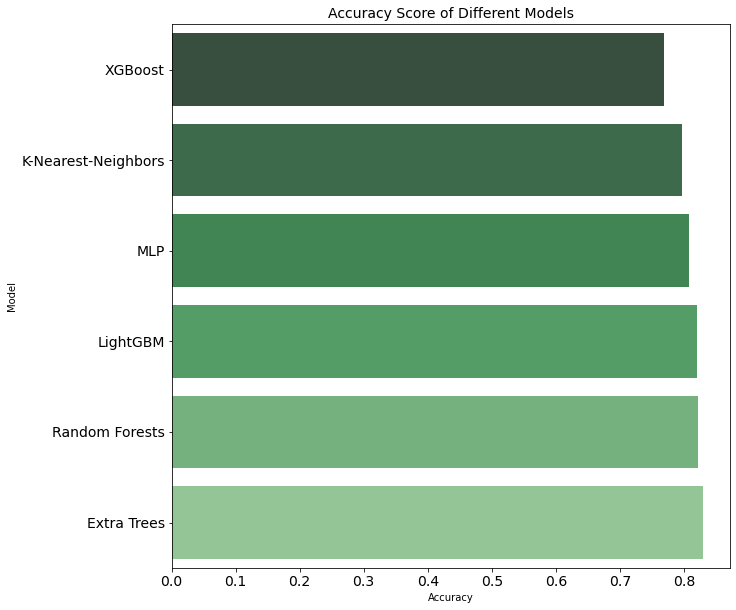

In [63]:
# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy3_one[1], lgbm_accuracy3_one[1], rf_accuracy3_one[1], xrf_accuracy3_one[1], xgb_accuracy3_one[1], mlp_accuracy3_one[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)

In [64]:
###hyperparameter optimization for Extra Trees###

In [65]:
#Using randomized search for optimization of Extra Trees:

# The number of trees in the forest algorithm, default value is 10.
xrf_n_estimators = [50, 100, 300, 500, 1000]

# The minimum number of samples required to split an internal node, default value is 2.
xrf_min_samples_split = [2, 3, 5, 7, 9]

# The minimum number of samples required to be at a leaf node, default value is 1.
xrf_min_samples_leaf = [1, 2, 4, 6, 8]

# The number of features to consider when looking for the best split, default value is auto.
xrf_max_features = ['auto', 'sqrt', 'log2', None] 

# Define the grid of hyperparameters to search
xrf_hyperparameter_grid = {'n_estimators': xrf_n_estimators,
                       'min_samples_leaf': xrf_min_samples_leaf,
                       'min_samples_split': xrf_min_samples_split,
                       'max_features': xrf_max_features}

In [66]:
#create model
best_model = ExtraTreesClassifier(random_state=42)

#create randomized search object
xrf_random_cv1_one=RandomizedSearchCV(estimator=best_model, param_distributions=xrf_hyperparameter_grid, cv=5, n_iter=20, scoring='accuracy', n_jobs=-1, verbose=1, return_train_score=True, random_state=42)
xrf_random_cv2_one=RandomizedSearchCV(estimator=best_model, param_distributions=xrf_hyperparameter_grid, cv=5, n_iter=20, scoring='accuracy', n_jobs=-1, verbose=1, return_train_score=True, random_state=42)
xrf_random_cv3_one=RandomizedSearchCV(estimator=best_model, param_distributions=xrf_hyperparameter_grid, cv=5, n_iter=20, scoring='accuracy', n_jobs=-1, verbose=1, return_train_score=True, random_state=42)

In [67]:
xrf_random_cv1_one.fit(X1_one_train_1, y1_one_train)
xrf_random_cv2_one.fit(X2_one_train_2, y2_one_train)
xrf_random_cv3_one.fit(X3_one_train_3, y3_one_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   26.0s finished


Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    4.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   17.9s finished


Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   22.7s finished


RandomizedSearchCV(cv=5, estimator=ExtraTreesClassifier(random_state=42),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'max_features': ['auto', 'sqrt', 'log2',
                                                         None],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 3, 5, 7, 9],
                                        'n_estimators': [50, 100, 300, 500,
                                                         1000]},
                   random_state=42, return_train_score=True, scoring='accuracy',
                   verbose=1)

In [68]:
print(xrf_random_cv1_one.best_score_)
print(xrf_random_cv2_one.best_score_)
print(xrf_random_cv3_one.best_score_)

0.888368647740756
0.849027060956898
0.8494270997582257


In [69]:
print(xrf_random_cv1_one.best_estimator_)
print(xrf_random_cv2_one.best_estimator_)
print(xrf_random_cv3_one.best_estimator_)

ExtraTreesClassifier(max_features=None, n_estimators=300, random_state=42)
ExtraTreesClassifier(max_features=None, n_estimators=300, random_state=42)
ExtraTreesClassifier(max_features=None, n_estimators=300, random_state=42)


In [70]:
#creating classifiers based on Random Search hyperparameter optimization:

xrf_classifier1_one_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)

xrf_classifier2_one_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)

xrf_classifier3_one_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=3,
                     min_weight_fraction_leaf=0.0, n_estimators=500,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)


xrf_accuracy1_one_random_search = fit_evaluate_model(xrf_classifier1_one_random_search, X1_one_train_1, y1_one_train, X1_one_test_1, y1_one_test)
xrf_accuracy2_one_random_search = fit_evaluate_model(xrf_classifier2_one_random_search, X2_one_train_2, y2_one_train, X2_one_test_2, y2_one_test)
xrf_accuracy3_one_random_search = fit_evaluate_model(xrf_classifier3_one_random_search, X3_one_train_3, y3_one_train, X3_one_test_3, y3_one_test)

In [71]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy1_one[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy1_one_random_search[1])

Accuracy score in the previous extra random forests model: 0.8803309993634627
Accuracy score after hyperparameter tuning: 0.8962444302991726


In [72]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy2_one[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy2_one_random_search[1])

Accuracy score in the previous extra random forests model: 0.8553811659192825
Accuracy score after hyperparameter tuning: 0.8811659192825112


In [73]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy3_one[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy3_one_random_search[1])

Accuracy score in the previous extra random forests model: 0.8301587301587302
Accuracy score after hyperparameter tuning: 0.8357142857142857


In [74]:
#Using Grid Search for optimization of Extra Trees:

# Create a range of trees to evaluate
trees_grid = {'n_estimators': [700, 900, 1200, 1500, 1800, 2100]}


# define all parameters except n_estimators:

xrf_classifier1_one_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)

xrf_classifier2_one_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)

xrf_classifier3_one_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)


# Grid Search Object using the trees range, the model and 5-fold cross validation

grid_search1_one = GridSearchCV(estimator = xrf_classifier1_one_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)

grid_search2_one = GridSearchCV(estimator = xrf_classifier2_one_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)

grid_search3_one = GridSearchCV(estimator = xrf_classifier3_one_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)

In [75]:
grid_search1_one.fit(X1_one_train_1, y1_one_train)
grid_search2_one.fit(X2_one_train_2, y2_one_train)
grid_search3_one.fit(X3_one_train_3, y3_one_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   51.8s finished


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   35.5s finished


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.5s finished


GridSearchCV(cv=5,
             estimator=ExtraTreesClassifier(max_features=None,
                                            min_samples_split=3,
                                            random_state=42),
             n_jobs=-1,
             param_grid={'n_estimators': [700, 900, 1200, 1500, 1800, 2100]},
             return_train_score=True, scoring='accuracy', verbose=1)

In [76]:
grid_search1_one.cv_results_

{'mean_fit_time': array([ 7.9803328 , 10.27582202, 13.58350916, 17.28212595, 20.13371291,
        20.55911155]),
 'std_fit_time': array([0.09265515, 0.1132449 , 0.1426851 , 0.19368569, 0.73104324,
        0.86025292]),
 'mean_score_time': array([0.19277573, 0.29066443, 0.39395843, 0.57992792, 0.71184769,
        0.81173525]),
 'std_score_time': array([0.00185642, 0.02285601, 0.00578812, 0.01298273, 0.02359586,
        0.03179861]),
 'param_n_estimators': masked_array(data=[700, 900, 1200, 1500, 1800, 2100],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'n_estimators': 700},
  {'n_estimators': 900},
  {'n_estimators': 1200},
  {'n_estimators': 1500},
  {'n_estimators': 1800},
  {'n_estimators': 2100}],
 'split0_test_score': array([0.90243902, 0.90455992, 0.90562036, 0.90562036, 0.90668081,
        0.90562036]),
 'split1_test_score': array([0.87698834, 0.87698834, 0.87592789, 0.87592789, 0.87486744,
       

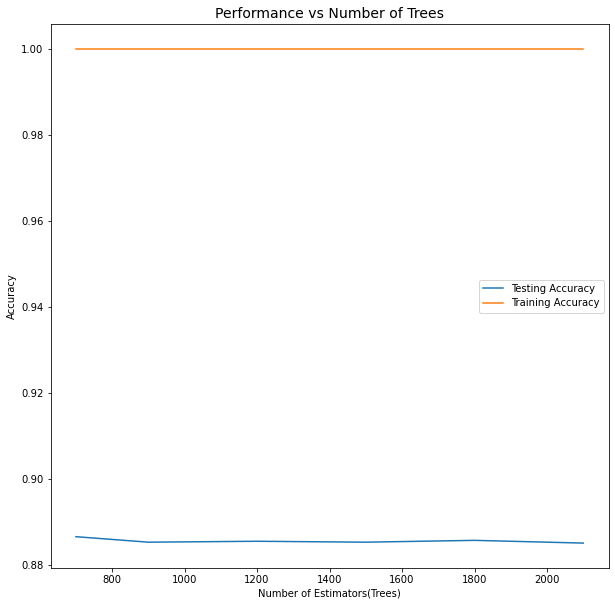

In [77]:
# Get the results into a dataframe
xrf_results1 = pd.DataFrame(grid_search1_one.cv_results_)

# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results1['param_n_estimators'], xrf_results1['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results1['param_n_estimators'], xrf_results1['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);

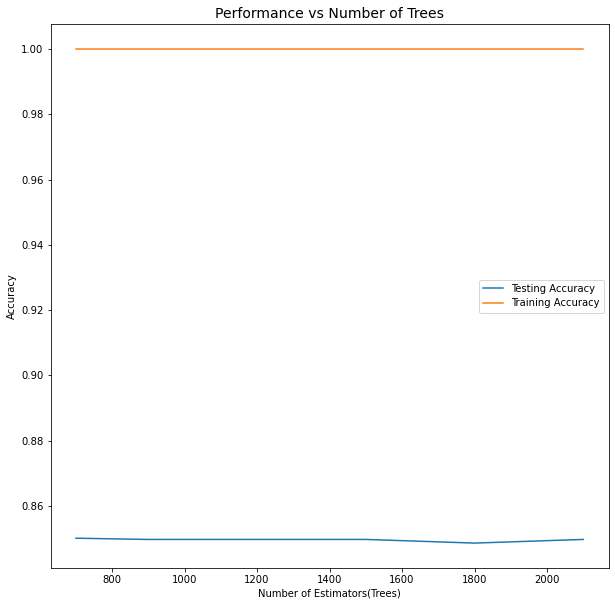

In [78]:
# Get the results into a dataframe
xrf_results2 = pd.DataFrame(grid_search2_one.cv_results_)

# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results2['param_n_estimators'], xrf_results2['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results2['param_n_estimators'], xrf_results2['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);

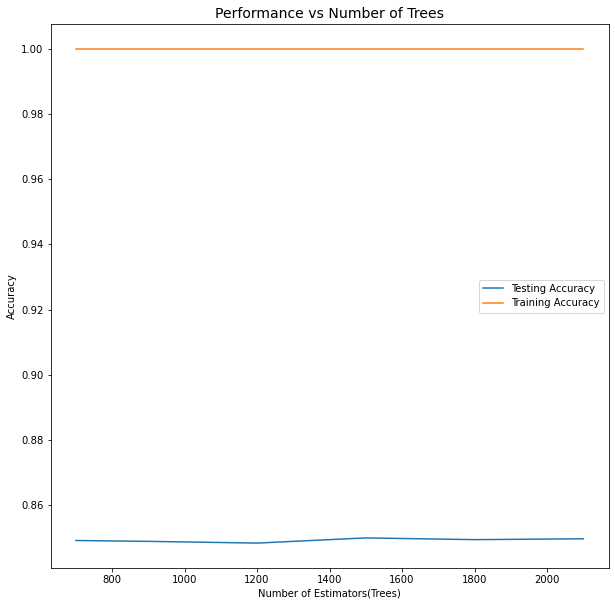

In [79]:
# Get the results into a dataframe
xrf_results3 = pd.DataFrame(grid_search3_one.cv_results_)

# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results3['param_n_estimators'], xrf_results3['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results3['param_n_estimators'], xrf_results3['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);

In [80]:
xrf_results1[["param_n_estimators", "params", "mean_test_score"]].sort_values(by="mean_test_score", ascending=False)

,param_n_estimators,params,mean_test_score
0,700,{'n_estimators': 700},0.886671
4,1800,{'n_estimators': 1800},0.885821
2,1200,{'n_estimators': 1200},0.885609
1,900,{'n_estimators': 900},0.885397
3,1500,{'n_estimators': 1500},0.885397
5,2100,{'n_estimators': 2100},0.885185


In [81]:
xrf_results2[["param_n_estimators", "params", "mean_test_score"]].sort_values(by="mean_test_score", ascending=False)

,param_n_estimators,params,mean_test_score
0,700,{'n_estimators': 700},0.850148
3,1500,{'n_estimators': 1500},0.849775
1,900,{'n_estimators': 900},0.849774
2,1200,{'n_estimators': 1200},0.849774
5,2100,{'n_estimators': 2100},0.849774
4,1800,{'n_estimators': 1800},0.848653


In [82]:
xrf_results3[["param_n_estimators", "params", "mean_test_score"]].sort_values(by="mean_test_score", ascending=False)

,param_n_estimators,params,mean_test_score
3,1500,{'n_estimators': 1500},0.849956
5,2100,{'n_estimators': 2100},0.849691
4,1800,{'n_estimators': 1800},0.849427
0,700,{'n_estimators': 700},0.849162
1,900,{'n_estimators': 900},0.848897
2,1200,{'n_estimators': 1200},0.848368


In [83]:
#creating classifiers based on Grid Search results:

xrf_classifier1_one_grid_search = ExtraTreesClassifier(n_estimators=900, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)

xrf_classifier2_one_grid_search = ExtraTreesClassifier(n_estimators=900, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)

xrf_classifier3_one_grid_search = ExtraTreesClassifier(n_estimators=900, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)

In [84]:
xrf_accuracy1_one_grid_search = fit_evaluate_model(xrf_classifier1_one_grid_search, X1_one_train_1, y1_one_train, X1_one_test_1, y1_one_test)
xrf_accuracy2_one_grid_search = fit_evaluate_model(xrf_classifier2_one_grid_search, X2_one_train_2, y2_one_train, X2_one_test_2, y2_one_test)
xrf_accuracy3_one_grid_search = fit_evaluate_model(xrf_classifier3_one_grid_search, X3_one_train_3, y3_one_train, X3_one_test_3, y3_one_test)

In [85]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy1_one[1])
print("Accuracy score after random search cv:", xrf_accuracy1_one_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy1_one_grid_search[1])

Accuracy score in the previous extra random forests model: 0.8803309993634627
Accuracy score after random search cv: 0.8962444302991726
Accuracy score after grid search cv: 0.8994271164863145


In [86]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy2_one[1])
print("Accuracy score after random search cv:", xrf_accuracy2_one_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy2_one_grid_search[1])

Accuracy score in the previous extra random forests model: 0.8553811659192825
Accuracy score after random search cv: 0.8811659192825112
Accuracy score after grid search cv: 0.8912556053811659


In [87]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy3_one[1])
print("Accuracy score after random search cv:", xrf_accuracy3_one_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy3_one_grid_search[1])

Accuracy score in the previous extra random forests model: 0.8301587301587302
Accuracy score after random search cv: 0.8357142857142857
Accuracy score after grid search cv: 0.8365079365079365


In [88]:
########################################################
###Using Extra Trees on complete df_one dataset:###

In [89]:
#creating dataset:

df1_one_complete = df_one[(df_one.Elevation <= mark1)]
df2_one_complete = df_one[((df_one.Elevation > mark1) & (df_one.Elevation < mark2))]
df3_one_complete = df_one[(df_one.Elevation >= mark2)]

df1_one_complete_x = split_dataset(df1_one_complete)[0]
df1_one_complete_y = split_dataset(df1_one_complete)[1]

df2_one_complete_x = split_dataset(df2_one_complete)[0]
df2_one_complete_y = split_dataset(df2_one_complete)[1]

df3_one_complete_x = split_dataset(df3_one_complete)[0]
df3_one_complete_y = split_dataset(df3_one_complete)[1]

X1_one_complete = scaler1_one.transform(df1_one_complete_x.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X1_one_complete = np.append(X1_one_complete, np.array(df1_one_complete_x.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

X2_one_complete = scaler2_one.transform(df2_one_complete_x.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X2_one_complete = np.append(X2_one_complete, np.array(df2_one_complete_x.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

X3_one_complete = scaler3_one.transform(df3_one_complete_x.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X3_one_complete = np.append(X3_one_complete, np.array(df3_one_complete_x.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

In [90]:
#create set of predictions:

df1_one_complete_y_pred = xrf_classifier1_one_random_search.predict(X1_one_complete)
df2_one_complete_y_pred = xrf_classifier2_one_random_search.predict(X2_one_complete)
df3_one_complete_y_pred = xrf_classifier3_one_random_search.predict(X3_one_complete)

In [91]:
# confusion matrix per elevation levels:

print(confusion_matrix(df1_one_complete_y, df1_one_complete_y_pred))
print('')
print(confusion_matrix(df2_one_complete_y, df2_one_complete_y_pred))
print('')
print(confusion_matrix(df3_one_complete_y, df3_one_complete_y_pred))

[[   0    3    1    0    0    6]
 [   0  163    6    0    2    7]
 [   0    3 1874   25    5   54]
 [   0    0    7 2147    0    6]
 [   0   59    1    0  107    2]
 [   0    1   32    9    1 1865]]

[[ 211   46    0    5    0    0]
 [  13  938    1   30    4    0]
 [   0    4  188    4    3    0]
 [   1   15    3 1913    0    0]
 [   0    1    1    3  247    0]
 [   0    0    0    5    0    0]]

[[1789   64    0   35]
 [  81  905    0   10]
 [  15   44    0    0]
 [  16    1    0 2138]]


In [92]:
# creating empty confusion matrix (based on number of unique values/classes in y):

cm_one_xrf = np.zeros([df_one.iloc[:, (df_one.shape[1]-1)].unique().shape[0], df_one.iloc[:, (df_one.shape[1]-1)].unique().shape[0]])
cmproc_one_xrf = np.zeros([df_one.iloc[:, (df_one.shape[1]-1)].unique().shape[0], df_one.iloc[:, (df_one.shape[1]-1)].unique().shape[0]])
cmreal_one_xrf = np.zeros([df_one.iloc[:, (df_one.shape[1]-1)].unique().shape[0], df_one.iloc[:, (df_one.shape[1]-1)].unique().shape[0]])

In [93]:
#filling confusion matrix with values:

for i in range (X1_one_complete.shape[0]):
    cm_one_xrf [(np.array(df1_one_complete_y)[i] - 1), (df1_one_complete_y_pred[i] - 1)] += 1
for i in range (X2_one_complete.shape[0]):
    cm_one_xrf [(np.array(df2_one_complete_y)[i] - 1), (df2_one_complete_y_pred[i] - 1)] += 1
for i in range (X3_one_complete.shape[0]):
    cm_one_xrf [(np.array(df3_one_complete_y)[i] - 1), (df3_one_complete_y_pred[i] - 1)] += 1

In [94]:
# calculating cummulative percentage for all 3 elevation segments:

cmproc_one_xrf[:, :] = cm_one_xrf[:, :]

for i in range(cmproc_one_xrf.shape[0]):
    cmproc_one_xrf [i, :] = cmproc_one_xrf [i, :] / cmproc_one_xrf.sum(axis=1)[i]
    
for i in range(cmreal_one_xrf.shape[0]):
    cmreal_one_xrf [i, i] = cm_one_xrf [i, i] / cm_one_xrf.sum().sum()
    


In [95]:
# Cummulative accuracy for Extra Trees with Random Search, based on df_one dataset:
print('Cummulative accuracy for Extra Trees Classifier using df_one dataset: ',cmreal_one_xrf.sum())

Cummulative accuracy for Extra Trees Classifier using df_one dataset:  0.9580026455026456


In [96]:
# # save the model to disk

# xrf1_one_full = xrf_accuracy1_one_random_search[0]
# xrf2_one_full = xrf_accuracy2_one_random_search[0]
# xrf3_one_full = xrf_accuracy3_one_random_search[0]


# filename = 'ForestCover-consolidated_full.sav'
# dump(xrf1_one_full, 'ForestCover-xrf1_one_full.joblib')
# dump(scaler1_one, 'ForestCover-xrf1_one_scaler1_one_full.joblib')
# dump(xrf2_one_full, 'ForestCover-xrf2_one_full.joblib')
# dump(scaler2_one, 'ForestCover-xrf2_one_scaler2_one_full.joblib')
# dump(xrf3_one_full, 'ForestCover-xrf3_one_full.joblib')
# dump(scaler3_one, 'ForestCover-xrf3_one_scaler3_one_full.joblib')


In [97]:
########################################################
#######working only with df_one_net dataset#######
########################################################

In [98]:
#df_one_net create model apply fit_evaluate_model KNN:

knn_classifier1_one_net = KNeighborsClassifier()
knn_accuracy1_one_net = fit_evaluate_model(knn_classifier1_one_net, X1_one_net_train_1, y1_one_net_train, X1_one_net_test_1, y1_one_net_test)
print(knn_accuracy1_one_net[3])

knn_classifier2_one_net = KNeighborsClassifier()
knn_accuracy2_one_net = fit_evaluate_model(knn_classifier2_one_net, X2_one_net_train_2, y2_one_net_train, X2_one_net_test_2, y2_one_net_test)
print(knn_accuracy2_one_net[3])

knn_classifier3_one_net = KNeighborsClassifier()
knn_accuracy3_one_net = fit_evaluate_model(knn_classifier3_one_net, X3_one_net_train_3, y3_one_net_train, X3_one_net_test_3, y3_one_net_test)
print(knn_accuracy3_one_net[3])

              precision    recall  f1-score   support

           2       0.88      0.40      0.55        35
           3       0.80      0.77      0.78       464
           4       0.88      0.95      0.92       527
           5       0.71      0.50      0.59        24
           6       0.83      0.83      0.83       521

    accuracy                           0.84      1571
   macro avg       0.82      0.69      0.73      1571
weighted avg       0.84      0.84      0.83      1571

              precision    recall  f1-score   support

           1       0.56      0.28      0.37        65
           2       0.79      0.64      0.71       243
           3       0.67      0.74      0.70        38
           5       0.83      0.98      0.90       479
           6       0.88      0.79      0.83        67

    accuracy                           0.81       892
   macro avg       0.75      0.68      0.70       892
weighted avg       0.80      0.81      0.80       892

              precisio

In [99]:
#df_one_net create model apply fit_evaluate_model LGBM:

lgbm_classifier1_one_net = LGBMClassifier()
lgbm_accuracy1_one_net = fit_evaluate_model(lgbm_classifier1_one_net, X1_one_net_train_1, y1_one_net_train, X1_one_net_test_1, y1_one_net_test)
print(lgbm_accuracy1_one_net[3])

lgbm_classifier2_one_net = LGBMClassifier()
lgbm_accuracy2_one_net = fit_evaluate_model(lgbm_classifier2_one_net, X2_one_net_train_2, y2_one_net_train, X2_one_net_test_2, y2_one_net_test)
print(lgbm_accuracy2_one_net[3])

lgbm_classifier3_one_net = LGBMClassifier()
lgbm_accuracy3_one_net = fit_evaluate_model(lgbm_classifier3_one_net, X3_one_net_train_3, y3_one_net_train, X3_one_net_test_3, y3_one_net_test)
print(lgbm_accuracy3_one_net[3])


              precision    recall  f1-score   support

           2       0.70      0.46      0.55        35
           3       0.82      0.81      0.82       464
           4       0.94      0.96      0.95       527
           5       0.81      0.71      0.76        24
           6       0.85      0.87      0.86       521

    accuracy                           0.87      1571
   macro avg       0.83      0.76      0.79      1571
weighted avg       0.87      0.87      0.87      1571

              precision    recall  f1-score   support

           1       0.64      0.28      0.39        65
           2       0.79      0.72      0.76       243
           3       0.79      0.79      0.79        38
           5       0.87      0.98      0.92       479
           6       0.89      0.85      0.87        67

    accuracy                           0.84       892
   macro avg       0.80      0.72      0.74       892
weighted avg       0.83      0.84      0.83       892

              precisio

In [100]:
#df_one_net create model apply fit_evaluate_model Random Forest:

rf_classifier1_one_net = RandomForestClassifier()
rf_accuracy1_one_net = fit_evaluate_model(rf_classifier1_one_net, X1_one_net_train_1, y1_one_net_train, X1_one_net_test_1, y1_one_net_test)
print(rf_accuracy1_one_net[3])

rf_classifier2_one_net = RandomForestClassifier()
rf_accuracy2_one_net = fit_evaluate_model(rf_classifier2_one_net, X2_one_net_train_2, y2_one_net_train, X2_one_net_test_2, y2_one_net_test)
print(rf_accuracy2_one_net[3])

rf_classifier3_one_net = RandomForestClassifier()
rf_accuracy3_one_net = fit_evaluate_model(rf_classifier3_one_net, X3_one_net_train_3, y3_one_net_train, X3_one_net_test_3, y3_one_net_test)
print(rf_accuracy3_one_net[3])


              precision    recall  f1-score   support

           2       0.88      0.43      0.58        35
           3       0.82      0.82      0.82       464
           4       0.92      0.96      0.94       527
           5       0.67      0.50      0.57        24
           6       0.86      0.87      0.86       521

    accuracy                           0.87      1571
   macro avg       0.83      0.71      0.75      1571
weighted avg       0.87      0.87      0.87      1571

              precision    recall  f1-score   support

           1       0.73      0.17      0.28        65
           2       0.80      0.76      0.78       243
           3       0.70      0.82      0.76        38
           5       0.87      0.98      0.92       479
           6       0.95      0.82      0.88        67

    accuracy                           0.84       892
   macro avg       0.81      0.71      0.72       892
weighted avg       0.84      0.84      0.83       892

              precisio

In [101]:
#df_one_net create model apply fit_evaluate_model Extra Trees Rarndom Forest:

xrf_classifier1_one_net = ExtraTreesClassifier()
xrf_accuracy1_one_net = fit_evaluate_model(xrf_classifier1_one_net, X1_one_net_train_1, y1_one_net_train, X1_one_net_test_1, y1_one_net_test)
print(xrf_accuracy1_one_net[3])

xrf_classifier2_one_net = ExtraTreesClassifier()
xrf_accuracy2_one_net = fit_evaluate_model(xrf_classifier2_one_net, X2_one_net_train_2, y2_one_net_train, X2_one_net_test_2, y2_one_net_test)
print(xrf_accuracy2_one_net[3])

xrf_classifier3_one_net = ExtraTreesClassifier()
xrf_accuracy3_one_net = fit_evaluate_model(xrf_classifier3_one_net, X3_one_net_train_3, y3_one_net_train, X3_one_net_test_3, y3_one_net_test)
print(xrf_accuracy3_one_net[3])

              precision    recall  f1-score   support

           2       0.86      0.54      0.67        35
           3       0.83      0.82      0.82       464
           4       0.93      0.96      0.94       527
           5       0.70      0.58      0.64        24
           6       0.87      0.87      0.87       521

    accuracy                           0.87      1571
   macro avg       0.84      0.76      0.79      1571
weighted avg       0.87      0.87      0.87      1571

              precision    recall  f1-score   support

           1       0.61      0.26      0.37        65
           2       0.80      0.78      0.79       243
           3       0.67      0.79      0.72        38
           5       0.89      0.97      0.93       479
           6       0.92      0.84      0.88        67

    accuracy                           0.85       892
   macro avg       0.78      0.73      0.74       892
weighted avg       0.84      0.85      0.84       892

              precisio

In [102]:
#df_one_net create model apply fit_evaluate_model XGBoost:

xgb_classifier1_one_net = XGBClassifier()
xgb_accuracy1_one_net = fit_evaluate_model(xgb_classifier1_one_net, X1_one_net_train_1, y1_one_net_train, X1_one_net_test_1, y1_one_net_test)
print(xgb_accuracy1_one_net[3])

xgb_classifier2_one_net = XGBClassifier()
xgb_accuracy2_one_net = fit_evaluate_model(xgb_classifier2_one_net, X2_one_net_train_2, y2_one_net_train, X2_one_net_test_2, y2_one_net_test)
print(xgb_accuracy2_one_net[3])

xgb_classifier3_one_net = XGBClassifier()
xgb_accuracy3_one_net = fit_evaluate_model(xgb_classifier3_one_net, X3_one_net_train_3, y3_one_net_train, X3_one_net_test_3, y3_one_net_test)
print(xgb_accuracy3_one_net[3])


              precision    recall  f1-score   support

           2       0.78      0.40      0.53        35
           3       0.70      0.68      0.69       464
           4       0.88      0.95      0.91       527
           5       0.52      0.54      0.53        24
           6       0.76      0.75      0.76       521

    accuracy                           0.78      1571
   macro avg       0.73      0.66      0.68      1571
weighted avg       0.78      0.78      0.78      1571

              precision    recall  f1-score   support

           1       0.67      0.12      0.21        65
           2       0.78      0.62      0.69       243
           3       0.72      0.74      0.73        38
           5       0.79      0.97      0.87       479
           6       0.80      0.73      0.77        67

    accuracy                           0.79       892
   macro avg       0.75      0.64      0.65       892
weighted avg       0.78      0.79      0.76       892

              precisio

In [103]:
#df_one_net create model apply fit_evaluate_model MLPClassifier (NN):

mlp_classifier1_one_net = MLPClassifier(hidden_layer_sizes=(50), max_iter=1500)
mlp_accuracy1_one_net = fit_evaluate_model(mlp_classifier1_one_net, X1_one_net_train_1, y1_one_net_train, X1_one_net_test_1, y1_one_net_test)
print(mlp_accuracy1_one_net[3])

mlp_classifier2_one_net = MLPClassifier(hidden_layer_sizes=(50,50), max_iter=1500, alpha = 0.5)
mlp_accuracy2_one_net = fit_evaluate_model(mlp_classifier2_one_net, X2_one_net_train_2, y2_one_net_train, X2_one_net_test_2, y2_one_net_test)
print(mlp_accuracy2_one_net[3])

mlp_classifier3_one_net = MLPClassifier(hidden_layer_sizes=(80), max_iter=1500, alpha = 0.05)
mlp_accuracy3_one_net = fit_evaluate_model(mlp_classifier3_one_net, X3_one_net_train_3, y3_one_net_train, X3_one_net_test_3, y3_one_net_test)
print(mlp_accuracy3_one_net[3])

              precision    recall  f1-score   support

           2       0.70      0.46      0.55        35
           3       0.76      0.79      0.77       464
           4       0.94      0.95      0.94       527
           5       0.73      0.67      0.70        24
           6       0.83      0.81      0.82       521

    accuracy                           0.84      1571
   macro avg       0.79      0.73      0.76      1571
weighted avg       0.84      0.84      0.84      1571

              precision    recall  f1-score   support

           1       0.46      0.28      0.35        65
           2       0.73      0.76      0.74       243
           3       0.64      0.74      0.68        38
           5       0.91      0.92      0.91       479
           6       0.82      0.82      0.82        67

    accuracy                           0.82       892
   macro avg       0.71      0.70      0.70       892
weighted avg       0.81      0.82      0.81       892

              precisio

Text(0.5, 1.0, 'Accuracy Score of Different Models')

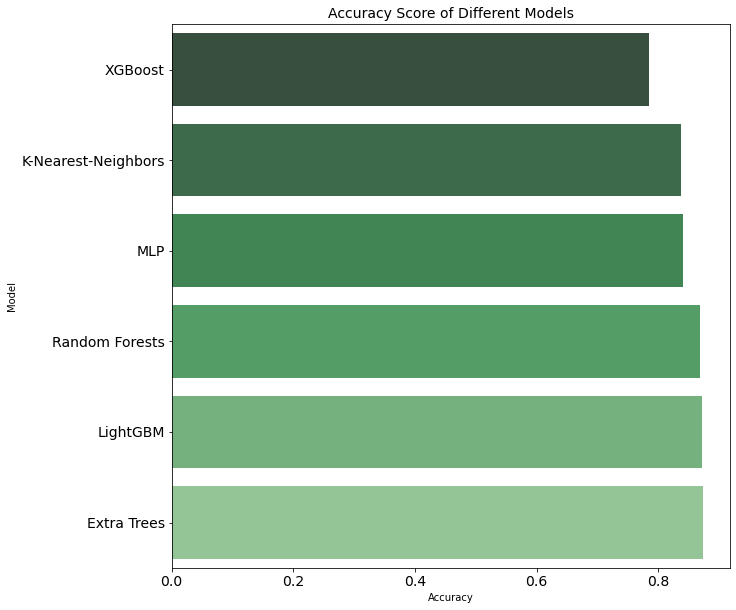

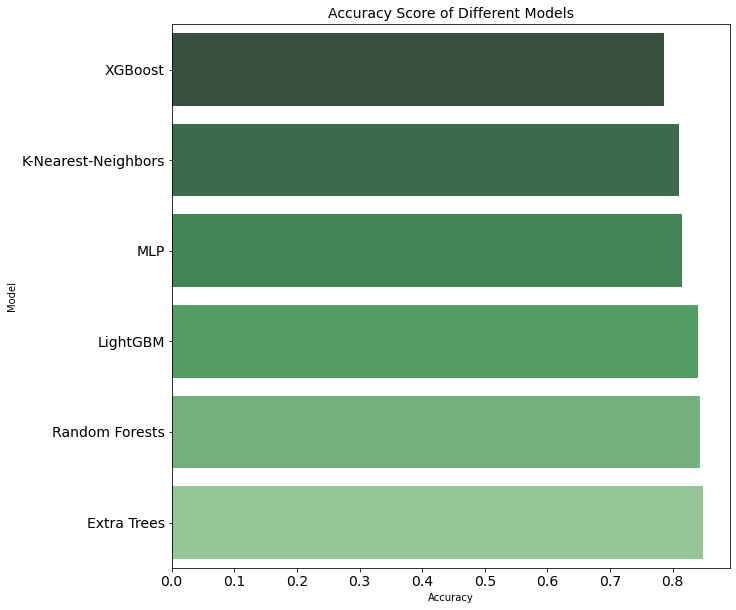

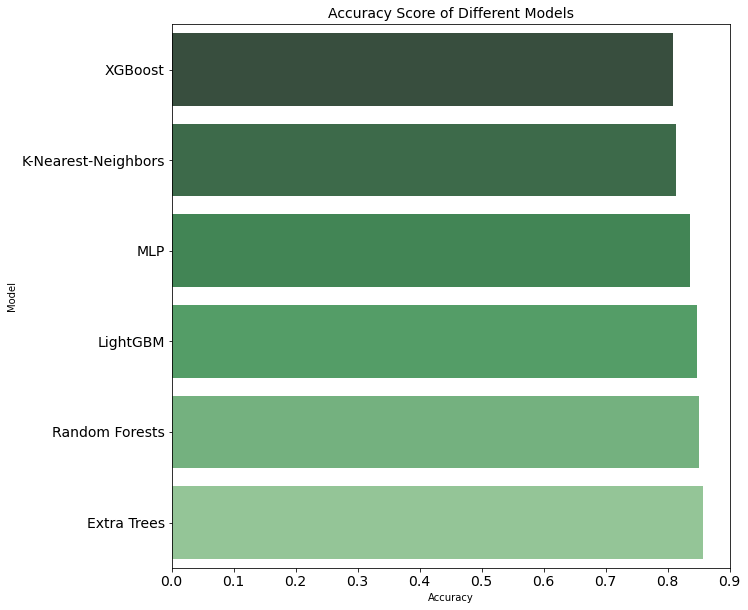

In [104]:
# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy1_one_net[1], lgbm_accuracy1_one_net[1], rf_accuracy1_one_net[1], xrf_accuracy1_one_net[1], xgb_accuracy1_one_net[1], mlp_accuracy1_one_net[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)



# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy2_one_net[1], lgbm_accuracy2_one_net[1], rf_accuracy2_one_net[1], xrf_accuracy2_one_net[1], xgb_accuracy2_one_net[1], mlp_accuracy2_one_net[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)




# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy3_one_net[1], lgbm_accuracy3_one_net[1], rf_accuracy3_one_net[1], xrf_accuracy3_one_net[1], xgb_accuracy3_one_net[1], mlp_accuracy3_one_net[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)

In [105]:
###hyperparameter optimization for Extra Trees###


#create model
best_model_one_net = ExtraTreesClassifier(random_state=42)

#create randomized search object
xrf_random_cv1_one_net=RandomizedSearchCV(estimator=best_model, param_distributions=xrf_hyperparameter_grid, cv=5, n_iter=20, scoring='accuracy', n_jobs=-1, verbose=1, return_train_score=True, random_state=42)
xrf_random_cv2_one_net=RandomizedSearchCV(estimator=best_model, param_distributions=xrf_hyperparameter_grid, cv=5, n_iter=20, scoring='accuracy', n_jobs=-1, verbose=1, return_train_score=True, random_state=42)
xrf_random_cv3_one_net=RandomizedSearchCV(estimator=best_model, param_distributions=xrf_hyperparameter_grid, cv=5, n_iter=20, scoring='accuracy', n_jobs=-1, verbose=1, return_train_score=True, random_state=42)


xrf_random_cv1_one_net.fit(X1_one_net_train_1, y1_one_net_train)
xrf_random_cv2_one_net.fit(X2_one_net_train_2, y2_one_net_train)
xrf_random_cv3_one_net.fit(X3_one_net_train_3, y3_one_net_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   25.3s finished


Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   18.4s finished


Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   23.0s finished


RandomizedSearchCV(cv=5, estimator=ExtraTreesClassifier(random_state=42),
                   n_iter=20, n_jobs=-1,
                   param_distributions={'max_features': ['auto', 'sqrt', 'log2',
                                                         None],
                                        'min_samples_leaf': [1, 2, 4, 6, 8],
                                        'min_samples_split': [2, 3, 5, 7, 9],
                                        'n_estimators': [50, 100, 300, 500,
                                                         1000]},
                   random_state=42, return_train_score=True, scoring='accuracy',
                   verbose=1)

In [106]:
print(xrf_random_cv1_one_net.best_score_)
print(xrf_random_cv2_one_net.best_score_)
print(xrf_random_cv3_one_net.best_score_)

0.8881561083680622
0.8546317478030409
0.8375177826833455


In [107]:
print(xrf_random_cv1_one_net.best_estimator_)
print(xrf_random_cv2_one_net.best_estimator_)
print(xrf_random_cv3_one_net.best_estimator_)

ExtraTreesClassifier(max_features=None, n_estimators=300, random_state=42)
ExtraTreesClassifier(max_features=None, min_samples_split=5, n_estimators=500,
                     random_state=42)
ExtraTreesClassifier(max_features=None, min_samples_split=5, n_estimators=500,
                     random_state=42)


In [108]:
#creating classifiers based on Random Search hyperparameter optimization:

xrf_classifier1_one_net_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)

xrf_classifier2_one_net_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)

xrf_classifier3_one_net_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)


xrf_accuracy1_one_net_random_search = fit_evaluate_model(xrf_classifier1_one_net_random_search, X1_one_net_train_1, y1_one_net_train, X1_one_net_test_1, y1_one_net_test)
xrf_accuracy2_one_net_random_search = fit_evaluate_model(xrf_classifier2_one_net_random_search, X2_one_net_train_2, y2_one_net_train, X2_one_net_test_2, y2_one_net_test)
xrf_accuracy3_one_net_random_search = fit_evaluate_model(xrf_classifier3_one_net_random_search, X3_one_net_train_3, y3_one_net_train, X3_one_net_test_3, y3_one_net_test)

In [109]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy1_one_net[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy1_one_net_random_search[1])
print("Accuracy score in the previous extra random forests model:", xrf_accuracy2_one_net[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy2_one_net_random_search[1])
print("Accuracy score in the previous extra random forests model:", xrf_accuracy3_one_net[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy3_one_net_random_search[1])

Accuracy score in the previous extra random forests model: 0.8739656269891789
Accuracy score after hyperparameter tuning: 0.8987905792488861
Accuracy score in the previous extra random forests model: 0.8486547085201793
Accuracy score after hyperparameter tuning: 0.8677130044843049
Accuracy score in the previous extra random forests model: 0.8571428571428571
Accuracy score after hyperparameter tuning: 0.8476190476190476


In [110]:
#Using Grid Search for optimization of Extra Trees:

# Create a range of trees to evaluate
trees_grid = {'n_estimators': [700, 900, 1200, 1500, 1800, 2100]}


# define all parameters except n_estimators:

xrf_classifier1_one_net_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)

xrf_classifier2_one_net_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)

xrf_classifier3_one_net_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)


# Grid Search Object using the trees range, the model and 5-fold cross validation

grid_search1_one_net = GridSearchCV(estimator = xrf_classifier1_one_net_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)

grid_search2_one_net = GridSearchCV(estimator = xrf_classifier2_one_net_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)

grid_search3_one_net = GridSearchCV(estimator = xrf_classifier3_one_net_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)

In [111]:
grid_search1_one_net.fit(X1_one_net_train_1, y1_one_net_train)
grid_search2_one_net.fit(X2_one_net_train_2, y2_one_net_train)
grid_search3_one_net.fit(X3_one_net_train_3, y3_one_net_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   52.7s finished


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   37.7s finished


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   47.5s finished


GridSearchCV(cv=5,
             estimator=ExtraTreesClassifier(max_features=None,
                                            min_samples_split=3,
                                            random_state=42),
             n_jobs=-1,
             param_grid={'n_estimators': [700, 900, 1200, 1500, 1800, 2100]},
             return_train_score=True, scoring='accuracy', verbose=1)

In [112]:
# Get the results into a dataframe

xrf_results1_one_net = pd.DataFrame(grid_search1_one_net.cv_results_)
xrf_results2_one_net = pd.DataFrame(grid_search2_one_net.cv_results_)
xrf_results3_one_net = pd.DataFrame(grid_search3_one_net.cv_results_)

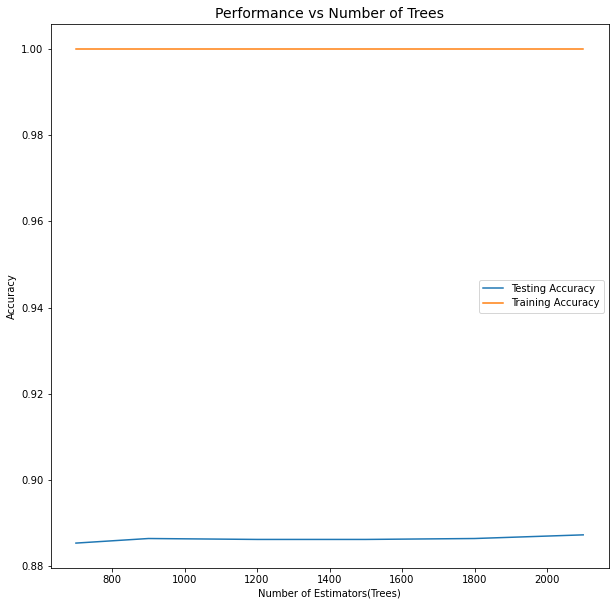

In [113]:
# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results1_one_net['param_n_estimators'], xrf_results1_one_net['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results1_one_net['param_n_estimators'], xrf_results1_one_net['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);

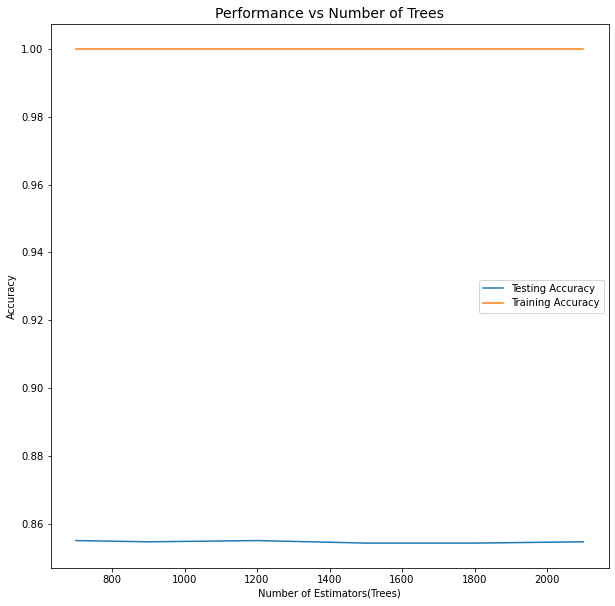

In [114]:
# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results2_one_net['param_n_estimators'], xrf_results2_one_net['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results2_one_net['param_n_estimators'], xrf_results2_one_net['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);

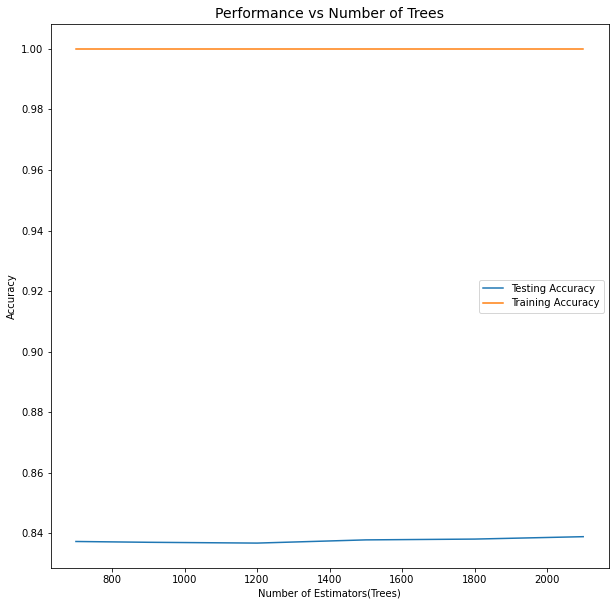

In [115]:
# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results3_one_net['param_n_estimators'], xrf_results3_one_net['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results3_one_net['param_n_estimators'], xrf_results3_one_net['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);

In [116]:
print(xrf_results1_one_net[["param_n_estimators", "params", "mean_test_score"]].sort_values(by="mean_test_score", ascending=False))
print(xrf_results2_one_net[["param_n_estimators", "params", "mean_test_score"]].sort_values(by="mean_test_score", ascending=False))
print(xrf_results3_one_net[["param_n_estimators", "params", "mean_test_score"]].sort_values(by="mean_test_score", ascending=False))

  param_n_estimators                  params  mean_test_score
5               2100  {'n_estimators': 2100}         0.887307
4               1800  {'n_estimators': 1800}         0.886458
1                900   {'n_estimators': 900}         0.886458
2               1200  {'n_estimators': 1200}         0.886246
3               1500  {'n_estimators': 1500}         0.886246
0                700   {'n_estimators': 700}         0.885398
  param_n_estimators                  params  mean_test_score
0                700   {'n_estimators': 700}         0.855003
2               1200  {'n_estimators': 1200}         0.855003
1                900   {'n_estimators': 900}         0.854630
5               2100  {'n_estimators': 2100}         0.854629
3               1500  {'n_estimators': 1500}         0.854255
4               1800  {'n_estimators': 1800}         0.854255
  param_n_estimators                  params  mean_test_score
5               2100  {'n_estimators': 2100}         0.838841
4       

In [117]:
#creating classifiers based on Grid Search results:

xrf_classifier1_one_net_grid_search = ExtraTreesClassifier(n_estimators=1200, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)

xrf_classifier2_one_net_grid_search = ExtraTreesClassifier(n_estimators=900, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)

xrf_classifier3_one_net_grid_search = ExtraTreesClassifier(n_estimators=1500, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)

In [118]:
xrf_accuracy1_one_net_grid_search = fit_evaluate_model(xrf_classifier1_one_net_grid_search, X1_one_net_train_1, y1_one_net_train, X1_one_net_test_1, y1_one_net_test)
xrf_accuracy2_one_net_grid_search = fit_evaluate_model(xrf_classifier2_one_net_grid_search, X2_one_net_train_2, y2_one_net_train, X2_one_net_test_2, y2_one_net_test)
xrf_accuracy3_one_net_grid_search = fit_evaluate_model(xrf_classifier3_one_net_grid_search, X3_one_net_train_3, y3_one_net_train, X3_one_net_test_3, y3_one_net_test)

In [119]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy1_one_net[1])
print("Accuracy score after random search cv:", xrf_accuracy1_one_net_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy1_one_net_grid_search[1])

print("Accuracy score in the previous extra random forests model:", xrf_accuracy2_one_net[1])
print("Accuracy score after random search cv:", xrf_accuracy2_one_net_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy2_one_net_grid_search[1])

print("Accuracy score in the previous extra random forests model:", xrf_accuracy3_one_net[1])
print("Accuracy score after random search cv:", xrf_accuracy3_one_net_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy3_one_net_grid_search[1])

Accuracy score in the previous extra random forests model: 0.8739656269891789
Accuracy score after random search cv: 0.8987905792488861
Accuracy score after grid search cv: 0.9000636537237429
Accuracy score in the previous extra random forests model: 0.8486547085201793
Accuracy score after random search cv: 0.8677130044843049
Accuracy score after grid search cv: 0.8688340807174888
Accuracy score in the previous extra random forests model: 0.8571428571428571
Accuracy score after random search cv: 0.8476190476190476
Accuracy score after grid search cv: 0.85


In [120]:
#creating dataset:

df1_one_net_complete = df_one_net[(df_one_net.Elevation <= mark1)]
df2_one_net_complete = df_one_net[((df_one_net.Elevation > mark1) & (df_one_net.Elevation < mark2))]
df3_one_net_complete = df_one_net[(df_one_net.Elevation >= mark2)]

df1_one_net_complete_x = split_dataset(df1_one_net_complete)[0]
df1_one_net_complete_y = split_dataset(df1_one_net_complete)[1]

df2_one_net_complete_x = split_dataset(df2_one_net_complete)[0]
df2_one_net_complete_y = split_dataset(df2_one_net_complete)[1]

df3_one_net_complete_x = split_dataset(df3_one_net_complete)[0]
df3_one_net_complete_y = split_dataset(df3_one_net_complete)[1]

X1_one_net_complete = scaler1_one_net.transform(df1_one_net_complete_x.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X1_one_net_complete = np.append(X1_one_net_complete, np.array(df1_one_net_complete_x.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

X2_one_net_complete = scaler2_one_net.transform(df2_one_net_complete_x.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X2_one_net_complete = np.append(X2_one_net_complete, np.array(df2_one_net_complete_x.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

X3_one_net_complete = scaler3_one_net.transform(df3_one_net_complete_x.drop(['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'], axis=1))
X3_one_net_complete = np.append(X3_one_net_complete, np.array(df3_one_net_complete_x.loc[:, ['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40']]), axis=1)

In [121]:
#create set of predictions:

df1_one_net_complete_y_pred = xrf_classifier1_one_net_grid_search.predict(X1_one_net_complete)
df2_one_net_complete_y_pred = xrf_classifier2_one_net_grid_search.predict(X2_one_net_complete)
df3_one_net_complete_y_pred = xrf_classifier3_one_net_grid_search.predict(X3_one_net_complete)


In [122]:
# confusion matrix per elevation levels:

print(confusion_matrix(df1_one_net_complete_y, df1_one_net_complete_y_pred))
print('')
print(confusion_matrix(df2_one_net_complete_y, df2_one_net_complete_y_pred))
print('')
print(confusion_matrix(df3_one_net_complete_y, df3_one_net_complete_y_pred))

[[   0    5    1    0    1    3]
 [   0  162    5    0    2    9]
 [   0    2 1898   20    3   38]
 [   0    0   12 2141    0    7]
 [   0   58    5    0  103    3]
 [   0    2   39    8    1 1858]]

[[ 203   53    0    5    1    0]
 [  10  939    5   31    1    0]
 [   0    3  190    2    4    0]
 [   0   14    4 1912    2    0]
 [   2    4    2    2  242    0]
 [   0    0    0    5    0    0]]

[[1807   57    0   24]
 [  83  910    0    3]
 [   8   48    0    3]
 [  21    1    0 2133]]


In [123]:
# creating empty confusion matrix (based on number of unique values/classes in y):

cm_one_net_xrf = np.zeros([df_one_net.iloc[:, (df_one_net.shape[1]-1)].unique().shape[0], df_one_net.iloc[:, (df_one_net.shape[1]-1)].unique().shape[0]])
cmproc_one_net_xrf = np.zeros([df_one_net.iloc[:, (df_one_net.shape[1]-1)].unique().shape[0], df_one_net.iloc[:, (df_one_net.shape[1]-1)].unique().shape[0]])
cmreal_one_net_xrf = np.zeros([df_one_net.iloc[:, (df_one_net.shape[1]-1)].unique().shape[0], df_one_net.iloc[:, (df_one_net.shape[1]-1)].unique().shape[0]])

In [124]:
#filling confusion matrix with values:

for i in range (X1_one_net_complete.shape[0]):
    cm_one_net_xrf [(np.array(df1_one_net_complete_y)[i] - 1), (df1_one_net_complete_y_pred[i] - 1)] += 1
for i in range (X2_one_net_complete.shape[0]):
    cm_one_net_xrf [(np.array(df2_one_net_complete_y)[i] - 1), (df2_one_net_complete_y_pred[i] - 1)] += 1
for i in range (X3_one_net_complete.shape[0]):
    cm_one_net_xrf [(np.array(df3_one_net_complete_y)[i] - 1), (df3_one_net_complete_y_pred[i] - 1)] += 1

In [125]:
# calculating cummulative percentage for all 3 elevation segments:

cmproc_one_net_xrf[:, :] = cm_one_net_xrf[:, :]

for i in range(cmproc_one_net_xrf.shape[0]):
    cmproc_one_net_xrf [i, :] = cmproc_one_net_xrf [i, :] / cmproc_one_net_xrf.sum(axis=1)[i]
    
for i in range(cmreal_one_net_xrf.shape[0]):
    cmreal_one_net_xrf [i, i] = cm_one_net_xrf [i, i] / cm_one_net_xrf.sum().sum()
    

In [126]:
# Cummulative accuracy for Extra Trees with Random Search, based on df_one dataset:
print('Cummulative accuracy for Extra Trees Classifier using df_one dataset: ',cmreal_one_xrf.sum())
print('Cummulative accuracy for Extra Trees Classifier using df_one_net dataset: ',cmreal_one_net_xrf.sum())

Cummulative accuracy for Extra Trees Classifier using df_one dataset:  0.9580026455026456
Cummulative accuracy for Extra Trees Classifier using df_one_net dataset:  0.9588624338624336


In [127]:
########################################################
#######working only with df_rev dataset#######
########################################################

In [128]:
#df_rev create model apply fit_evaluate_model KNN:

knn_classifier1_rev = KNeighborsClassifier()
knn_accuracy1_rev = fit_evaluate_model(knn_classifier1_rev, X1_rev_train_1, y1_rev_train, X1_rev_test_1, y1_rev_test)
print(knn_accuracy1_rev[3])

knn_classifier2_rev = KNeighborsClassifier()
knn_accuracy2_rev = fit_evaluate_model(knn_classifier2_rev, X2_rev_train_2, y2_rev_train, X2_rev_test_2, y2_rev_test)
print(knn_accuracy2_rev[3])

knn_classifier3_rev = KNeighborsClassifier()
knn_accuracy3_rev = fit_evaluate_model(knn_classifier3_rev, X3_rev_train_3, y3_rev_train, X3_rev_test_3, y3_rev_test)
print(knn_accuracy3_rev[3])


              precision    recall  f1-score   support

           2       0.85      0.44      0.58        39
           3       0.83      0.75      0.78       472
           4       0.90      0.97      0.93       543
           5       0.76      0.59      0.67        27
           6       0.79      0.84      0.82       490

    accuracy                           0.84      1571
   macro avg       0.83      0.72      0.75      1571
weighted avg       0.84      0.84      0.84      1571

              precision    recall  f1-score   support

           1       0.47      0.21      0.29        66
           2       0.75      0.61      0.67       231
           3       0.76      0.81      0.79        48
           5       0.82      0.96      0.89       475
           6       0.86      0.79      0.83        72

    accuracy                           0.79       892
   macro avg       0.73      0.68      0.69       892
weighted avg       0.78      0.79      0.78       892

              precisio

In [129]:
#df_rev create model apply fit_evaluate_model LGBM:

lgbm_classifier1_rev = LGBMClassifier()
lgbm_accuracy1_rev = fit_evaluate_model(lgbm_classifier1_rev, X1_rev_train_1, y1_rev_train, X1_rev_test_1, y1_rev_test)
print(lgbm_accuracy1_rev[3])

lgbm_classifier2_rev = LGBMClassifier()
lgbm_accuracy2_rev = fit_evaluate_model(lgbm_classifier2_rev, X2_rev_train_2, y2_rev_train, X2_rev_test_2, y2_rev_test)
print(lgbm_accuracy2_rev[3])

lgbm_classifier3_rev = LGBMClassifier()
lgbm_accuracy3_rev = fit_evaluate_model(lgbm_classifier3_rev, X3_rev_train_3, y3_rev_train, X3_rev_test_3, y3_rev_test)
print(lgbm_accuracy3_rev[3])



              precision    recall  f1-score   support

           2       0.86      0.46      0.60        39
           3       0.86      0.81      0.83       472
           4       0.93      0.96      0.94       543
           5       0.90      0.70      0.79        27
           6       0.82      0.87      0.84       490

    accuracy                           0.87      1571
   macro avg       0.87      0.76      0.80      1571
weighted avg       0.87      0.87      0.87      1571

              precision    recall  f1-score   support

           1       0.61      0.21      0.31        66
           2       0.74      0.71      0.73       231
           3       0.76      0.77      0.76        48
           5       0.87      0.97      0.92       475
           6       0.84      0.82      0.83        72

    accuracy                           0.82       892
   macro avg       0.76      0.70      0.71       892
weighted avg       0.81      0.82      0.81       892

              precisio

In [130]:
#df_rev create model apply fit_evaluate_model Random Forest:

rf_classifier1_rev = RandomForestClassifier()
rf_accuracy1_rev = fit_evaluate_model(rf_classifier1_rev, X1_rev_train_1, y1_rev_train, X1_rev_test_1, y1_rev_test)
print(rf_accuracy1_rev[3])

rf_classifier2_rev = RandomForestClassifier()
rf_accuracy2_rev = fit_evaluate_model(rf_classifier2_rev, X2_rev_train_2, y2_rev_train, X2_rev_test_2, y2_rev_test)
print(rf_accuracy2_rev[3])

rf_classifier3_rev = RandomForestClassifier()
rf_accuracy3_rev = fit_evaluate_model(rf_classifier3_rev, X3_rev_train_3, y3_rev_train, X3_rev_test_3, y3_rev_test)
print(rf_accuracy3_rev[3])



              precision    recall  f1-score   support

           2       0.93      0.36      0.52        39
           3       0.85      0.81      0.83       472
           4       0.92      0.95      0.94       543
           5       0.83      0.70      0.76        27
           6       0.83      0.88      0.85       490

    accuracy                           0.87      1571
   macro avg       0.87      0.74      0.78      1571
weighted avg       0.87      0.87      0.86      1571

              precision    recall  f1-score   support

           1       0.69      0.14      0.23        66
           2       0.73      0.71      0.72       231
           3       0.76      0.81      0.79        48
           5       0.86      0.97      0.91       475
           6       0.90      0.85      0.87        72

    accuracy                           0.82       892
   macro avg       0.79      0.70      0.70       892
weighted avg       0.81      0.82      0.80       892

              precisio

In [131]:
#df_rev create model apply fit_evaluate_model Extra Trees Rarndom Forest:

xrf_classifier1_rev = ExtraTreesClassifier()
xrf_accuracy1_rev = fit_evaluate_model(xrf_classifier1_rev, X1_rev_train_1, y1_rev_train, X1_rev_test_1, y1_rev_test)
print(xrf_accuracy1_rev[3])

xrf_classifier2_rev = ExtraTreesClassifier()
xrf_accuracy2_rev = fit_evaluate_model(xrf_classifier2_rev, X2_rev_train_2, y2_rev_train, X2_rev_test_2, y2_rev_test)
print(xrf_accuracy2_rev[3])

xrf_classifier3_rev = ExtraTreesClassifier()
xrf_accuracy3_rev = fit_evaluate_model(xrf_classifier3_rev, X3_rev_train_3, y3_rev_train, X3_rev_test_3, y3_rev_test)
print(xrf_accuracy3_rev[3])


              precision    recall  f1-score   support

           2       0.94      0.41      0.57        39
           3       0.87      0.80      0.83       472
           4       0.92      0.96      0.94       543
           5       0.87      0.74      0.80        27
           6       0.82      0.89      0.85       490

    accuracy                           0.87      1571
   macro avg       0.88      0.76      0.80      1571
weighted avg       0.87      0.87      0.87      1571

              precision    recall  f1-score   support

           1       0.63      0.18      0.28        66
           2       0.74      0.74      0.74       231
           3       0.81      0.88      0.84        48
           5       0.89      0.97      0.93       475
           6       0.94      0.88      0.91        72

    accuracy                           0.84       892
   macro avg       0.80      0.73      0.74       892
weighted avg       0.83      0.84      0.83       892

              precisio

In [132]:
#df_rev create model apply fit_evaluate_model XGBoost:

xgb_classifier1_rev = XGBClassifier()
xgb_accuracy1_rev = fit_evaluate_model(xgb_classifier1_rev, X1_rev_train_1, y1_rev_train, X1_rev_test_1, y1_rev_test)
print(xgb_accuracy1_rev[3])

xgb_classifier2_rev = XGBClassifier()
xgb_accuracy2_rev = fit_evaluate_model(xgb_classifier2_rev, X2_rev_train_2, y2_rev_train, X2_rev_test_2, y2_rev_test)
print(xgb_accuracy2_rev[3])

xgb_classifier3_rev = XGBClassifier()
xgb_accuracy3_rev = fit_evaluate_model(xgb_classifier3_rev, X3_rev_train_3, y3_rev_train, X3_rev_test_3, y3_rev_test)
print(xgb_accuracy3_rev[3])


              precision    recall  f1-score   support

           2       1.00      0.36      0.53        39
           3       0.73      0.69      0.71       472
           4       0.89      0.94      0.91       543
           5       0.74      0.63      0.68        27
           6       0.73      0.77      0.75       490

    accuracy                           0.79      1571
   macro avg       0.82      0.68      0.72      1571
weighted avg       0.79      0.79      0.79      1571

              precision    recall  f1-score   support

           1       0.53      0.12      0.20        66
           2       0.72      0.57      0.64       231
           3       0.73      0.75      0.74        48
           5       0.80      0.95      0.87       475
           6       0.79      0.82      0.80        72

    accuracy                           0.77       892
   macro avg       0.71      0.64      0.65       892
weighted avg       0.75      0.77      0.75       892

              precisio

In [133]:
#df_rev create model apply fit_evaluate_model MLPClassifier (NN):

mlp_classifier1_rev = MLPClassifier(hidden_layer_sizes=(50), max_iter=1500)
mlp_accuracy1_rev = fit_evaluate_model(mlp_classifier1_rev, X1_rev_train_1, y1_rev_train, X1_rev_test_1, y1_rev_test)
print(mlp_accuracy1_rev[3])

mlp_classifier2_rev = MLPClassifier(hidden_layer_sizes=(50,50), max_iter=1500, alpha = 0.5)
mlp_accuracy2_rev = fit_evaluate_model(mlp_classifier2_rev, X2_rev_train_2, y2_rev_train, X2_rev_test_2, y2_rev_test)
print(mlp_accuracy2_rev[3])

mlp_classifier3_rev = MLPClassifier(hidden_layer_sizes=(80), max_iter=1500, alpha = 0.05)
mlp_accuracy3_rev = fit_evaluate_model(mlp_classifier3_rev, X3_rev_train_3, y3_rev_train, X3_rev_test_3, y3_rev_test)
print(mlp_accuracy3_rev[3])

              precision    recall  f1-score   support

           2       0.70      0.41      0.52        39
           3       0.80      0.75      0.78       472
           4       0.93      0.96      0.94       543
           5       0.72      0.78      0.75        27
           6       0.78      0.82      0.80       490

    accuracy                           0.84      1571
   macro avg       0.79      0.74      0.76      1571
weighted avg       0.84      0.84      0.84      1571

              precision    recall  f1-score   support

           1       0.50      0.15      0.23        66
           2       0.72      0.68      0.70       231
           3       0.73      0.77      0.75        48
           5       0.86      0.96      0.90       475
           6       0.86      0.86      0.86        72

    accuracy                           0.81       892
   macro avg       0.73      0.68      0.69       892
weighted avg       0.79      0.81      0.79       892

              precisio

Text(0.5, 1.0, 'Accuracy Score of Different Models')

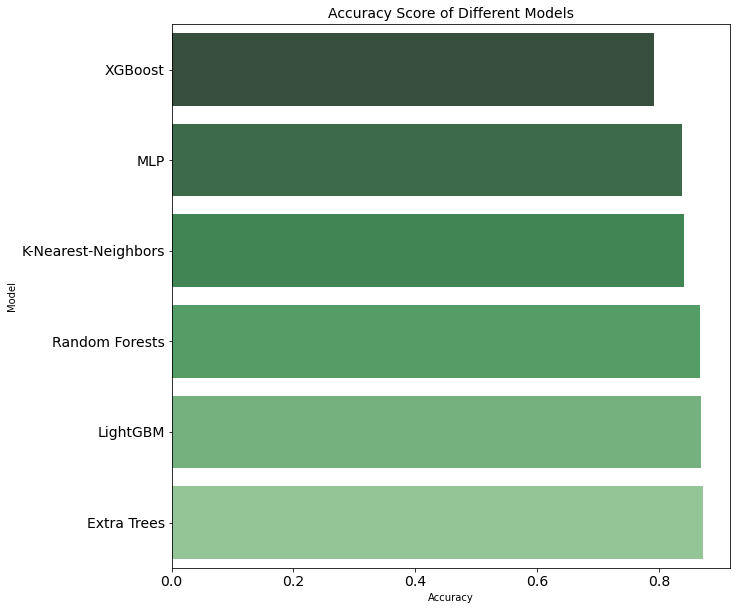

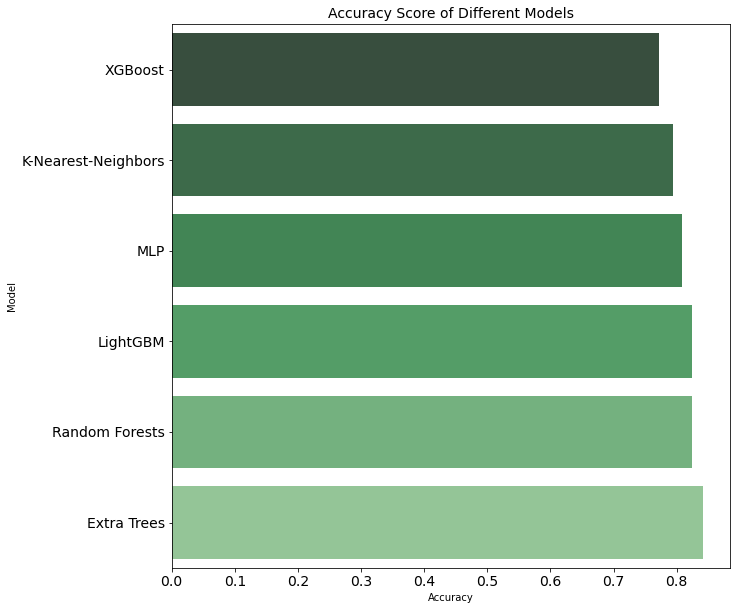

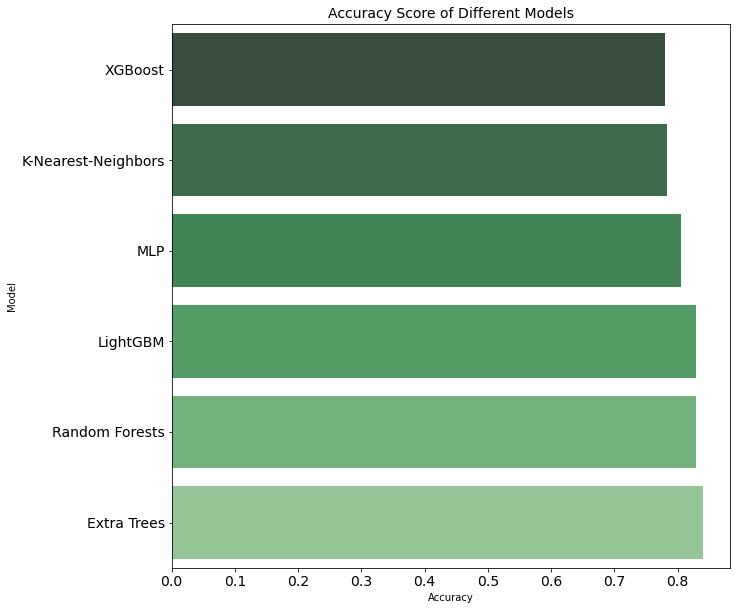

In [134]:
# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy1_rev[1], lgbm_accuracy1_rev[1], rf_accuracy1_rev[1], xrf_accuracy1_rev[1], xgb_accuracy1_rev[1], mlp_accuracy1_rev[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)



# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy2_rev[1], lgbm_accuracy2_rev[1], rf_accuracy2_rev[1], xrf_accuracy2_rev[1], xgb_accuracy2_rev[1], mlp_accuracy2_rev[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)




# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy3_rev[1], lgbm_accuracy3_rev[1], rf_accuracy3_rev[1], xrf_accuracy3_rev[1], xgb_accuracy3_rev[1], mlp_accuracy3_rev[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)


In [135]:
#creating classifiers based on Random Search hyperparameter optimization:

xrf_classifier1_rev_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)

xrf_classifier2_rev_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)

xrf_classifier3_rev_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)


xrf_accuracy1_rev_random_search = fit_evaluate_model(xrf_classifier1_rev_random_search, X1_rev_train_1, y1_rev_train, X1_rev_test_1, y1_rev_test)
xrf_accuracy2_rev_random_search = fit_evaluate_model(xrf_classifier2_rev_random_search, X2_rev_train_2, y2_rev_train, X2_rev_test_2, y2_rev_test)
xrf_accuracy3_rev_random_search = fit_evaluate_model(xrf_classifier3_rev_random_search, X3_rev_train_3, y3_rev_train, X3_rev_test_3, y3_rev_test)

In [136]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy1_rev[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy1_rev_random_search[1])
print("Accuracy score in the previous extra random forests model:", xrf_accuracy2_rev[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy2_rev_random_search[1])
print("Accuracy score in the previous extra random forests model:", xrf_accuracy3_rev[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy3_rev_random_search[1])

Accuracy score in the previous extra random forests model: 0.8726925525143221
Accuracy score after hyperparameter tuning: 0.893698281349459
Accuracy score in the previous extra random forests model: 0.8419282511210763
Accuracy score after hyperparameter tuning: 0.8531390134529148
Accuracy score in the previous extra random forests model: 0.8404761904761905
Accuracy score after hyperparameter tuning: 0.846031746031746


In [137]:
#Using Grid Search for optimization of Extra Trees:

# Create a range of trees to evaluate
trees_grid = {'n_estimators': [700, 900, 1200, 1500, 1800, 2100]}


# define all parameters except n_estimators:

xrf_classifier1_rev_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)

xrf_classifier2_rev_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)

xrf_classifier3_rev_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)


# Grid Search Object using the trees range, the model and 5-fold cross validation

grid_search1_rev = GridSearchCV(estimator = xrf_classifier1_rev_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)

grid_search2_rev = GridSearchCV(estimator = xrf_classifier2_rev_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)

grid_search3_rev = GridSearchCV(estimator = xrf_classifier3_rev_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)


grid_search1_rev.fit(X1_rev_train_1, y1_rev_train)
grid_search2_rev.fit(X2_rev_train_2, y2_rev_train)
grid_search3_rev.fit(X3_rev_train_3, y3_rev_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   38.9s finished


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   21.9s finished


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   27.6s finished


GridSearchCV(cv=5,
             estimator=ExtraTreesClassifier(max_features=None,
                                            min_samples_split=3,
                                            random_state=42),
             n_jobs=-1,
             param_grid={'n_estimators': [700, 900, 1200, 1500, 1800, 2100]},
             return_train_score=True, scoring='accuracy', verbose=1)

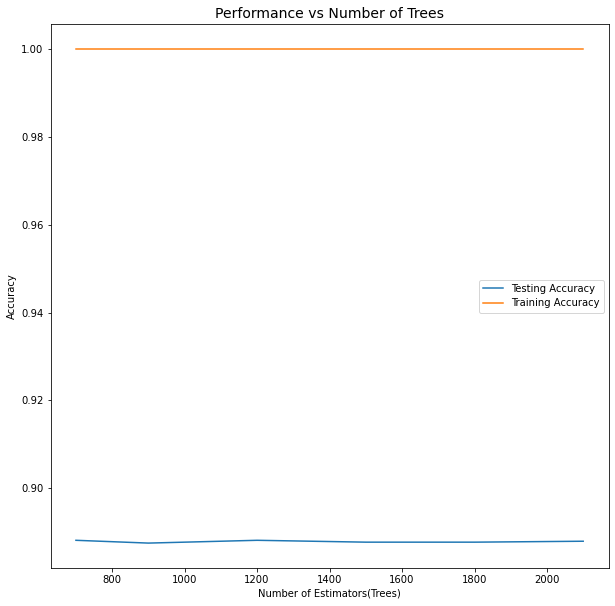

In [138]:
# Get the results into a dataframe
xrf_results1_rev = pd.DataFrame(grid_search1_rev.cv_results_)

# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results1_rev['param_n_estimators'], xrf_results1_rev['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results1_rev['param_n_estimators'], xrf_results1_rev['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);


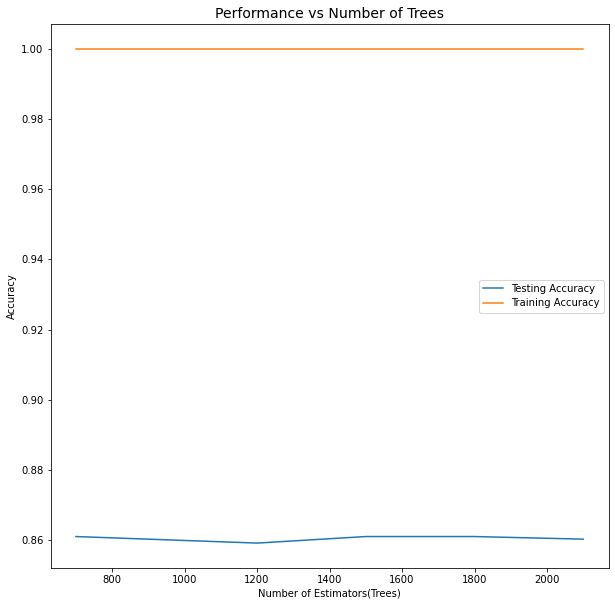

In [139]:
# Get the results into a dataframe
xrf_results2_rev = pd.DataFrame(grid_search2_rev.cv_results_)

# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results2_rev['param_n_estimators'], xrf_results2_rev['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results2_rev['param_n_estimators'], xrf_results2_rev['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);


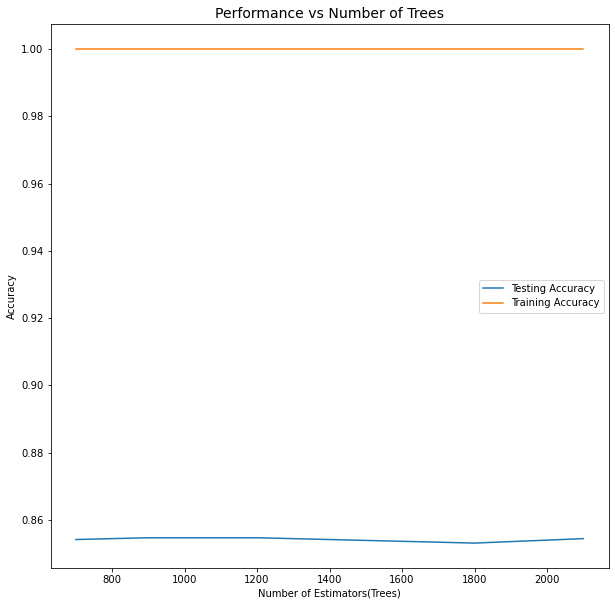

In [140]:
# Get the results into a dataframe
xrf_results3_rev = pd.DataFrame(grid_search3_rev.cv_results_)

# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results3_rev['param_n_estimators'], xrf_results3_rev['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results3_rev['param_n_estimators'], xrf_results3_rev['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);


In [141]:
#creating classifiers based on Grid Search results:

xrf_classifier1_rev_grid_search = ExtraTreesClassifier(n_estimators=1500, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)

xrf_classifier2_rev_grid_search = ExtraTreesClassifier(n_estimators=900, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)

xrf_classifier3_rev_grid_search = ExtraTreesClassifier(n_estimators=1200, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)
										   
										   
										   
										   
xrf_accuracy1_rev_grid_search = fit_evaluate_model(xrf_classifier1_rev_grid_search, X1_rev_train_1, y1_rev_train, X1_rev_test_1, y1_rev_test)
xrf_accuracy2_rev_grid_search = fit_evaluate_model(xrf_classifier2_rev_grid_search, X2_rev_train_2, y2_rev_train, X2_rev_test_2, y2_rev_test)
xrf_accuracy3_rev_grid_search = fit_evaluate_model(xrf_classifier3_rev_grid_search, X3_rev_train_3, y3_rev_train, X3_rev_test_3, y3_rev_test)


In [142]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy1_rev[1])
print("Accuracy score after random search cv:", xrf_accuracy1_rev_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy1_rev_grid_search[1])

print("Accuracy score in the previous extra random forests model:", xrf_accuracy2_rev[1])
print("Accuracy score after random search cv:", xrf_accuracy2_rev_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy2_rev_grid_search[1])

print("Accuracy score in the previous extra random forests model:", xrf_accuracy3_rev[1])
print("Accuracy score after random search cv:", xrf_accuracy3_rev_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy3_rev_grid_search[1])


Accuracy score in the previous extra random forests model: 0.8726925525143221
Accuracy score after random search cv: 0.893698281349459
Accuracy score after grid search cv: 0.8956078930617442
Accuracy score in the previous extra random forests model: 0.8419282511210763
Accuracy score after random search cv: 0.8531390134529148
Accuracy score after grid search cv: 0.8576233183856502
Accuracy score in the previous extra random forests model: 0.8404761904761905
Accuracy score after random search cv: 0.846031746031746
Accuracy score after grid search cv: 0.8476190476190476


In [143]:
#creating dataset:

df1_rev_complete = df_rev[(df_rev.Elevation <= mark1)]
df2_rev_complete = df_rev[((df_rev.Elevation > mark1) & (df_rev.Elevation < mark2))]
df3_rev_complete = df_rev[(df_rev.Elevation >= mark2)]

df1_rev_complete_x = split_dataset(df1_rev_complete)[0]
df1_rev_complete_y = split_dataset(df1_rev_complete)[1]

df2_rev_complete_x = split_dataset(df2_rev_complete)[0]
df2_rev_complete_y = split_dataset(df2_rev_complete)[1]

df3_rev_complete_x = split_dataset(df3_rev_complete)[0]
df3_rev_complete_y = split_dataset(df3_rev_complete)[1]

X1_rev_complete = scaler1_rev.transform(df1_rev_complete_x) 
X2_rev_complete = scaler2_rev.transform(df2_rev_complete_x)
X3_rev_complete = scaler3_rev.transform(df3_rev_complete_x)


In [144]:
#create set of predictions:

df1_rev_complete_y_pred = xrf_classifier1_rev_grid_search.predict(X1_rev_complete)
df2_rev_complete_y_pred = xrf_classifier2_rev_grid_search.predict(X2_rev_complete)
df3_rev_complete_y_pred = xrf_classifier3_rev_random_search.predict(X3_rev_complete)


In [145]:
# confusion matrix per elevation levels:

print(confusion_matrix(df1_rev_complete_y, df1_rev_complete_y_pred))
print('')
print(confusion_matrix(df2_rev_complete_y, df2_rev_complete_y_pred))
print('')
print(confusion_matrix(df3_rev_complete_y, df3_rev_complete_y_pred))



[[   0    4    1    0    0    5]
 [   0  156    7    0    2   13]
 [   0    2 1885   20    1   53]
 [   0    0   13 2139    0    8]
 [   0   57    2    0  106    4]
 [   0    0   25   14    0 1869]]

[[ 195   61    0    5    1    0]
 [  10  932    3   41    0    0]
 [   0    2  192    1    4    0]
 [   1   14    6 1911    0    0]
 [   0    3    1    3  245    0]
 [   0    0    1    4    0    0]]

[[1808   52    0   28]
 [  87  903    0    6]
 [   8   51    0    0]
 [  20    1    0 2134]]


In [146]:
# creating empty confusion matrix (based on number of unique values/classes in y):

cm_rev_xrf = np.zeros([df_rev.iloc[:, (df_rev.shape[1]-1)].unique().shape[0], df_rev.iloc[:, (df_rev.shape[1]-1)].unique().shape[0]])
cmproc_rev_xrf = np.zeros([df_rev.iloc[:, (df_rev.shape[1]-1)].unique().shape[0], df_rev.iloc[:, (df_rev.shape[1]-1)].unique().shape[0]])
cmreal_rev_xrf = np.zeros([df_rev.iloc[:, (df_rev.shape[1]-1)].unique().shape[0], df_rev.iloc[:, (df_rev.shape[1]-1)].unique().shape[0]])


#filling confusion matrix with values:

for i in range (X1_rev_complete.shape[0]):
    cm_rev_xrf [(np.array(df1_rev_complete_y)[i] - 1), (df1_rev_complete_y_pred[i] - 1)] += 1
for i in range (X2_rev_complete.shape[0]):
    cm_rev_xrf [(np.array(df2_rev_complete_y)[i] - 1), (df2_rev_complete_y_pred[i] - 1)] += 1
for i in range (X3_rev_complete.shape[0]):
    cm_rev_xrf [(np.array(df3_rev_complete_y)[i] - 1), (df3_rev_complete_y_pred[i] - 1)] += 1
	
	
	
	
# calculating cummulative percentage for all 3 elevation segments:

cmproc_rev_xrf[:, :] = cm_rev_xrf[:, :]

for i in range(cmproc_rev_xrf.shape[0]):
    cmproc_rev_xrf [i, :] = cmproc_rev_xrf [i, :] / cmproc_rev_xrf.sum(axis=1)[i]
    
for i in range(cmreal_rev_xrf.shape[0]):
    cmreal_rev_xrf [i, i] = cm_rev_xrf [i, i] / cm_rev_xrf.sum().sum()

In [147]:
# Cummulative accuracy for Extra Trees with Random Search, based on df_one dataset:
print('Cummulative accuracy for Extra Trees Classifier using df_one dataset: ',cmreal_one_xrf.sum())
print('Cummulative accuracy for Extra Trees Classifier using df_one_net dataset: ',cmreal_one_net_xrf.sum())
print('Cummulative accuracy for Extra Trees Classifier using df_rev dataset: ',cmreal_rev_xrf.sum())

Cummulative accuracy for Extra Trees Classifier using df_one dataset:  0.9580026455026456
Cummulative accuracy for Extra Trees Classifier using df_one_net dataset:  0.9588624338624336
Cummulative accuracy for Extra Trees Classifier using df_rev dataset:  0.9573412698412698


In [148]:
########################################################
#######working only with df_rev dataset#######
########################################################

In [149]:
#df_rev_net create model apply fit_evaluate_model KNN:

knn_classifier1_rev_net = KNeighborsClassifier()
knn_accuracy1_rev_net = fit_evaluate_model(knn_classifier1_rev_net, X1_rev_net_train_1, y1_rev_net_train, X1_rev_net_test_1, y1_rev_net_test)
print(knn_accuracy1_rev_net[3])

knn_classifier2_rev_net = KNeighborsClassifier()
knn_accuracy2_rev_net = fit_evaluate_model(knn_classifier2_rev_net, X2_rev_net_train_2, y2_rev_net_train, X2_rev_net_test_2, y2_rev_net_test)
print(knn_accuracy2_rev_net[3])

knn_classifier3_rev_net = KNeighborsClassifier()
knn_accuracy3_rev_net = fit_evaluate_model(knn_classifier3_rev_net, X3_rev_net_train_3, y3_rev_net_train, X3_rev_net_test_3, y3_rev_net_test)
print(knn_accuracy3_rev_net[3])


              precision    recall  f1-score   support

           2       0.94      0.41      0.57        39
           3       0.84      0.72      0.78       503
           4       0.85      0.97      0.91       500
           5       0.59      0.65      0.62        31
           6       0.81      0.84      0.82       498

    accuracy                           0.83      1571
   macro avg       0.81      0.72      0.74      1571
weighted avg       0.83      0.83      0.82      1571

              precision    recall  f1-score   support

           1       0.62      0.29      0.39        56
           2       0.80      0.62      0.70       254
           3       0.77      0.76      0.76        49
           5       0.81      0.98      0.89       465
           6       0.79      0.72      0.75        68

    accuracy                           0.80       892
   macro avg       0.76      0.67      0.70       892
weighted avg       0.79      0.80      0.79       892

              precisio

In [150]:
#df_rev_net create model apply fit_evaluate_model LGBM:

lgbm_classifier1_rev_net = LGBMClassifier()
lgbm_accuracy1_rev_net = fit_evaluate_model(lgbm_classifier1_rev_net, X1_rev_net_train_1, y1_rev_net_train, X1_rev_net_test_1, y1_rev_net_test)
print(lgbm_accuracy1_rev_net[3])

lgbm_classifier2_rev_net = LGBMClassifier()
lgbm_accuracy2_rev_net = fit_evaluate_model(lgbm_classifier2_rev_net, X2_rev_net_train_2, y2_rev_net_train, X2_rev_net_test_2, y2_rev_net_test)
print(lgbm_accuracy2_rev_net[3])

lgbm_classifier3_rev_net = LGBMClassifier()
lgbm_accuracy3_rev_net = fit_evaluate_model(lgbm_classifier3_rev_net, X3_rev_net_train_3, y3_rev_net_train, X3_rev_net_test_3, y3_rev_net_test)
print(lgbm_accuracy3_rev_net[3])



              precision    recall  f1-score   support

           2       0.90      0.49      0.63        39
           3       0.83      0.78      0.80       503
           4       0.92      0.97      0.94       500
           5       0.73      0.61      0.67        31
           6       0.80      0.85      0.83       498

    accuracy                           0.85      1571
   macro avg       0.84      0.74      0.77      1571
weighted avg       0.85      0.85      0.85      1571

              precision    recall  f1-score   support

           1       0.70      0.29      0.41        56
           2       0.81      0.76      0.78       254
           3       0.79      0.78      0.78        49
           5       0.87      0.97      0.92       465
           6       0.84      0.76      0.80        68

    accuracy                           0.84       892
   macro avg       0.80      0.71      0.74       892
weighted avg       0.83      0.84      0.83       892

              precisio

In [151]:
#df_rev_net create model apply fit_evaluate_model Random Forest:

rf_classifier1_rev_net = RandomForestClassifier()
rf_accuracy1_rev_net = fit_evaluate_model(rf_classifier1_rev_net, X1_rev_net_train_1, y1_rev_net_train, X1_rev_net_test_1, y1_rev_net_test)
print(rf_accuracy1_rev_net[3])

rf_classifier2_rev_net = RandomForestClassifier()
rf_accuracy2_rev_net = fit_evaluate_model(rf_classifier2_rev_net, X2_rev_net_train_2, y2_rev_net_train, X2_rev_net_test_2, y2_rev_net_test)
print(rf_accuracy2_rev_net[3])

rf_classifier3_rev_net = RandomForestClassifier()
rf_accuracy3_rev_net = fit_evaluate_model(rf_classifier3_rev_net, X3_rev_net_train_3, y3_rev_net_train, X3_rev_net_test_3, y3_rev_net_test)
print(rf_accuracy3_rev_net[3])


              precision    recall  f1-score   support

           2       0.95      0.46      0.62        39
           3       0.84      0.80      0.82       503
           4       0.92      0.96      0.94       500
           5       0.76      0.61      0.68        31
           6       0.83      0.87      0.85       498

    accuracy                           0.86      1571
   macro avg       0.86      0.74      0.78      1571
weighted avg       0.86      0.86      0.86      1571

              precision    recall  f1-score   support

           1       0.60      0.16      0.25        56
           2       0.78      0.74      0.76       254
           3       0.78      0.80      0.79        49
           5       0.86      0.97      0.91       465
           6       0.86      0.72      0.78        68

    accuracy                           0.83       892
   macro avg       0.78      0.68      0.70       892
weighted avg       0.81      0.83      0.81       892

              precisio

In [152]:
#df_rev_net create model apply fit_evaluate_model Extra Trees Rarndom Forest:

xrf_classifier1_rev_net = ExtraTreesClassifier()
xrf_accuracy1_rev_net = fit_evaluate_model(xrf_classifier1_rev_net, X1_rev_net_train_1, y1_rev_net_train, X1_rev_net_test_1, y1_rev_net_test)
print(xrf_accuracy1_rev_net[3])

xrf_classifier2_rev_net = ExtraTreesClassifier()
xrf_accuracy2_rev_net = fit_evaluate_model(xrf_classifier2_rev_net, X2_rev_net_train_2, y2_rev_net_train, X2_rev_net_test_2, y2_rev_net_test)
print(xrf_accuracy2_rev_net[3])

xrf_classifier3_rev_net = ExtraTreesClassifier()
xrf_accuracy3_rev_net = fit_evaluate_model(xrf_classifier3_rev_net, X3_rev_net_train_3, y3_rev_net_train, X3_rev_net_test_3, y3_rev_net_test)
print(xrf_accuracy3_rev_net[3])



              precision    recall  f1-score   support

           2       0.95      0.46      0.62        39
           3       0.83      0.80      0.81       503
           4       0.93      0.97      0.95       500
           5       0.80      0.65      0.71        31
           6       0.83      0.88      0.85       498

    accuracy                           0.86      1571
   macro avg       0.87      0.75      0.79      1571
weighted avg       0.86      0.86      0.86      1571

              precision    recall  f1-score   support

           1       0.89      0.29      0.43        56
           2       0.81      0.76      0.78       254
           3       0.80      0.82      0.81        49
           5       0.87      0.97      0.92       465
           6       0.86      0.79      0.82        68

    accuracy                           0.85       892
   macro avg       0.84      0.73      0.75       892
weighted avg       0.85      0.85      0.83       892

              precisio

In [153]:
#df_rev_net create model apply fit_evaluate_model XGBoost:

xgb_classifier1_rev_net = XGBClassifier()
xgb_accuracy1_rev_net = fit_evaluate_model(xgb_classifier1_rev_net, X1_rev_net_train_1, y1_rev_net_train, X1_rev_net_test_1, y1_rev_net_test)
print(xgb_accuracy1_rev_net[3])

xgb_classifier2_rev_net = XGBClassifier()
xgb_accuracy2_rev_net = fit_evaluate_model(xgb_classifier2_rev_net, X2_rev_net_train_2, y2_rev_net_train, X2_rev_net_test_2, y2_rev_net_test)
print(xgb_accuracy2_rev_net[3])

xgb_classifier3_rev_net = XGBClassifier()
xgb_accuracy3_rev_net = fit_evaluate_model(xgb_classifier3_rev_net, X3_rev_net_train_3, y3_rev_net_train, X3_rev_net_test_3, y3_rev_net_test)
print(xgb_accuracy3_rev_net[3])


              precision    recall  f1-score   support

           2       1.00      0.41      0.58        39
           3       0.76      0.68      0.71       503
           4       0.84      0.96      0.90       500
           5       0.59      0.42      0.49        31
           6       0.73      0.75      0.74       498

    accuracy                           0.78      1571
   macro avg       0.78      0.64      0.69      1571
weighted avg       0.78      0.78      0.77      1571

              precision    recall  f1-score   support

           1       0.64      0.16      0.26        56
           2       0.77      0.62      0.69       254
           3       0.75      0.80      0.77        49
           5       0.79      0.96      0.87       465
           6       0.76      0.66      0.71        68

    accuracy                           0.78       892
   macro avg       0.74      0.64      0.66       892
weighted avg       0.77      0.78      0.76       892

              precisio

In [154]:
#df_rev_net create model apply fit_evaluate_model MLPClassifier (NN):

mlp_classifier1_rev_net = MLPClassifier(hidden_layer_sizes=(50), max_iter=1500)
mlp_accuracy1_rev_net = fit_evaluate_model(mlp_classifier1_rev_net, X1_rev_net_train_1, y1_rev_net_train, X1_rev_net_test_1, y1_rev_net_test)
print(mlp_accuracy1_rev_net[3])

mlp_classifier2_rev_net = MLPClassifier(hidden_layer_sizes=(50,50), max_iter=1500, alpha = 0.5)
mlp_accuracy2_rev_net = fit_evaluate_model(mlp_classifier2_rev_net, X2_rev_net_train_2, y2_rev_net_train, X2_rev_net_test_2, y2_rev_net_test)
print(mlp_accuracy2_rev_net[3])

mlp_classifier3_rev_net = MLPClassifier(hidden_layer_sizes=(80), max_iter=1500, alpha = 0.05)
mlp_accuracy3_rev_net = fit_evaluate_model(mlp_classifier3_rev_net, X3_rev_net_train_3, y3_rev_net_train, X3_rev_net_test_3, y3_rev_net_test)
print(mlp_accuracy3_rev_net[3])

              precision    recall  f1-score   support

           2       0.86      0.49      0.62        39
           3       0.77      0.78      0.77       503
           4       0.90      0.95      0.93       500
           5       0.61      0.61      0.61        31
           6       0.81      0.78      0.80       498

    accuracy                           0.82      1571
   macro avg       0.79      0.72      0.75      1571
weighted avg       0.82      0.82      0.82      1571

              precision    recall  f1-score   support

           1       0.52      0.25      0.34        56
           2       0.77      0.72      0.74       254
           3       0.70      0.78      0.74        49
           5       0.86      0.96      0.91       465
           6       0.84      0.69      0.76        68

    accuracy                           0.82       892
   macro avg       0.74      0.68      0.70       892
weighted avg       0.80      0.82      0.81       892

              precisio

Text(0.5, 1.0, 'Accuracy Score of Different Models')

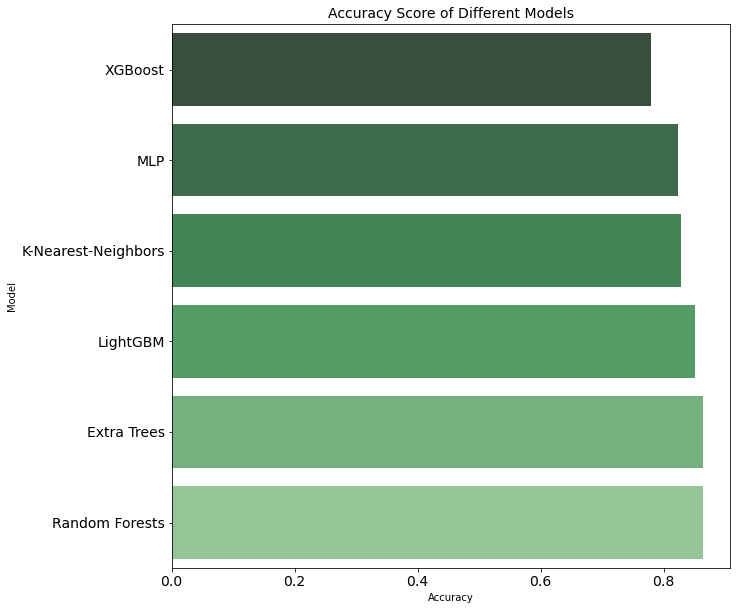

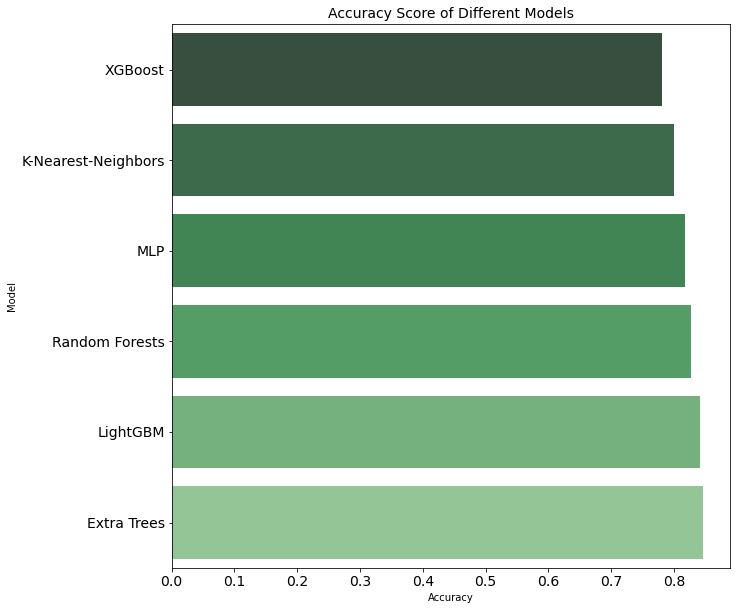

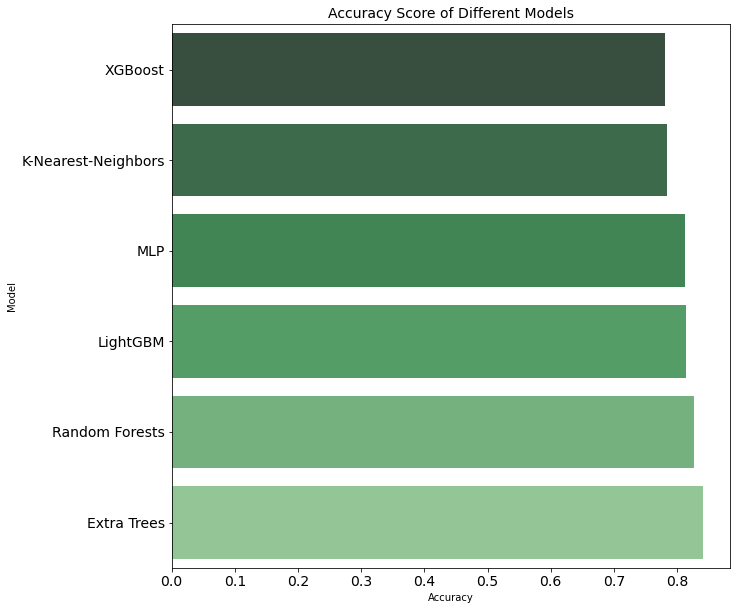

In [155]:
# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy1_rev_net[1], lgbm_accuracy1_rev_net[1], rf_accuracy1_rev_net[1], xrf_accuracy1_rev_net[1], xgb_accuracy1_rev_net[1], mlp_accuracy1_rev_net[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)



# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy2_rev_net[1], lgbm_accuracy2_rev_net[1], rf_accuracy2_rev_net[1], xrf_accuracy2_rev_net[1], xgb_accuracy2_rev_net[1], mlp_accuracy2_rev_net[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)




# create dataframe of accuracy and model and sort values
performance_comparison = pd.DataFrame({'Model':['K-Nearest-Neighbors', 'LightGBM', 'Random Forests', 'Extra Trees', 'XGBoost', 'MLP'], 'Accuracy': [knn_accuracy3_rev_net[1], lgbm_accuracy3_rev_net[1], rf_accuracy3_rev_net[1], xrf_accuracy3_rev_net[1], xgb_accuracy3_rev_net[1], mlp_accuracy3_rev_net[1]]})

performance_comparison = performance_comparison.sort_values(by='Accuracy', ascending='True')

#set the plot
plt.figure(figsize=(10,10))
ax = sns.barplot(x='Accuracy', y='Model', data=performance_comparison, palette='Greens_d')

#set the title arrange labels
plt.xticks(size=14)
plt.yticks(size=14)
plt.title("Accuracy Score of Different Models", size=14)



In [156]:
#creating classifiers based on Random Search hyperparameter optimization:

xrf_classifier1_rev_net_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)

xrf_classifier2_rev_net_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)

xrf_classifier3_rev_net_random_search = ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features=None,
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=300,
                     n_jobs=None, oob_score=False, random_state=42, verbose=0,
                     warm_start=False)


xrf_accuracy1_rev_net_random_search = fit_evaluate_model(xrf_classifier1_rev_net_random_search, X1_rev_net_train_1, y1_rev_net_train, X1_rev_net_test_1, y1_rev_net_test)
xrf_accuracy2_rev_net_random_search = fit_evaluate_model(xrf_classifier2_rev_net_random_search, X2_rev_net_train_2, y2_rev_net_train, X2_rev_net_test_2, y2_rev_net_test)
xrf_accuracy3_rev_net_random_search = fit_evaluate_model(xrf_classifier3_rev_net_random_search, X3_rev_net_train_3, y3_rev_net_train, X3_rev_net_test_3, y3_rev_net_test)

In [157]:
print("Accuracy score in the previous extra random forests model:", xrf_accuracy1_rev_net[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy1_rev_net_random_search[1])
print("Accuracy score in the previous extra random forests model:", xrf_accuracy2_rev_net[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy2_rev_net_random_search[1])
print("Accuracy score in the previous extra random forests model:", xrf_accuracy3_rev_net[1])
print("Accuracy score after hyperparameter tuning:", xrf_accuracy3_rev_net_random_search[1])

Accuracy score in the previous extra random forests model: 0.8637810311903247
Accuracy score after hyperparameter tuning: 0.890515595162317
Accuracy score in the previous extra random forests model: 0.8464125560538116
Accuracy score after hyperparameter tuning: 0.8643497757847534
Accuracy score in the previous extra random forests model: 0.8412698412698413
Accuracy score after hyperparameter tuning: 0.8444444444444444


In [158]:
#Using Grid Search for optimization of Extra Trees:

# Create a range of trees to evaluate
trees_grid = {'n_estimators': [700, 900, 1200, 1500, 1800, 2100]}


# define all parameters except n_estimators:

xrf_classifier1_rev_net_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)

xrf_classifier2_rev_net_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)

xrf_classifier3_rev_net_grid_search = ExtraTreesClassifier(max_features=None, 
                                                    min_samples_leaf=1, 
                                                    min_samples_split=3,
                                                    random_state=42)


# Grid Search Object using the trees range, the model and 5-fold cross validation

grid_search1_rev_net = GridSearchCV(estimator = xrf_classifier1_rev_net_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)

grid_search2_rev_net = GridSearchCV(estimator = xrf_classifier2_rev_net_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)

grid_search3_rev_net = GridSearchCV(estimator = xrf_classifier3_rev_net_grid_search, param_grid=trees_grid, 
                           cv = 5, scoring = 'accuracy', verbose = 1,
                           n_jobs = -1, return_train_score = True)
						   
						   
						   
						   
grid_search1_rev_net.fit(X1_rev_net_train_1, y1_rev_net_train)
grid_search2_rev_net.fit(X2_rev_net_train_2, y2_rev_net_train)
grid_search3_rev_net.fit(X3_rev_net_train_3, y3_rev_net_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   40.5s finished


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   23.7s finished


Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:   29.0s finished


GridSearchCV(cv=5,
             estimator=ExtraTreesClassifier(max_features=None,
                                            min_samples_split=3,
                                            random_state=42),
             n_jobs=-1,
             param_grid={'n_estimators': [700, 900, 1200, 1500, 1800, 2100]},
             return_train_score=True, scoring='accuracy', verbose=1)

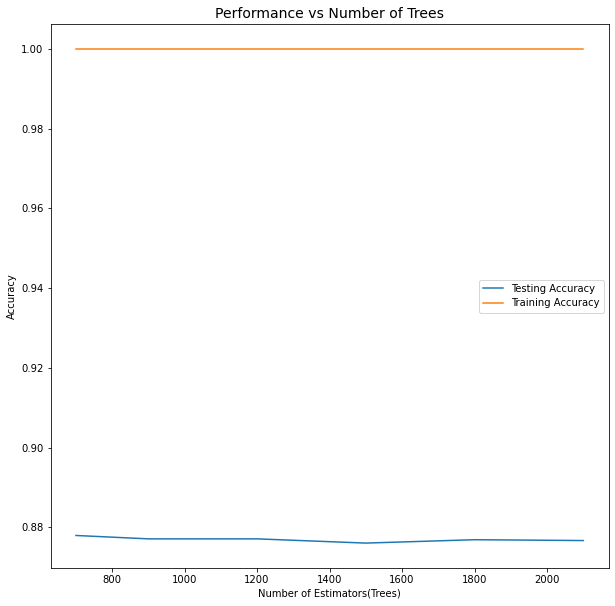

In [159]:
# Get the results into a dataframe
xrf_results1_rev_net = pd.DataFrame(grid_search1_rev_net.cv_results_)

# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results1_rev_net['param_n_estimators'], xrf_results1_rev_net['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results1_rev_net['param_n_estimators'], xrf_results1_rev_net['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);


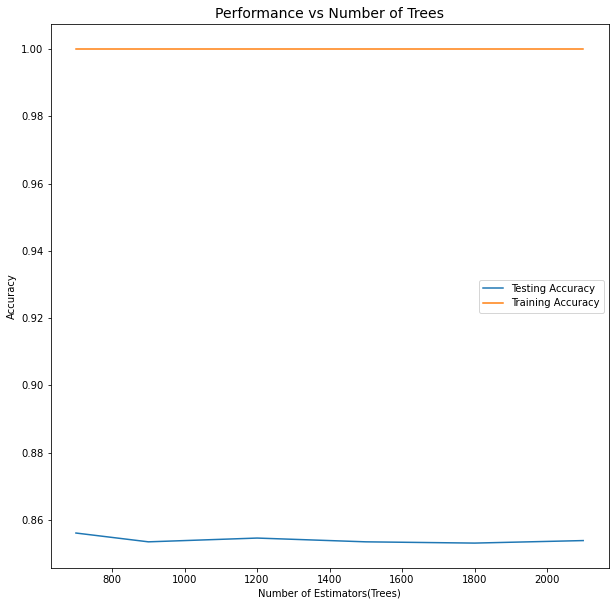

In [160]:
# Get the results into a dataframe
xrf_results2_rev_net = pd.DataFrame(grid_search2_rev_net.cv_results_)

# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results2_rev_net['param_n_estimators'], xrf_results2_rev_net['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results2_rev_net['param_n_estimators'], xrf_results2_rev_net['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);


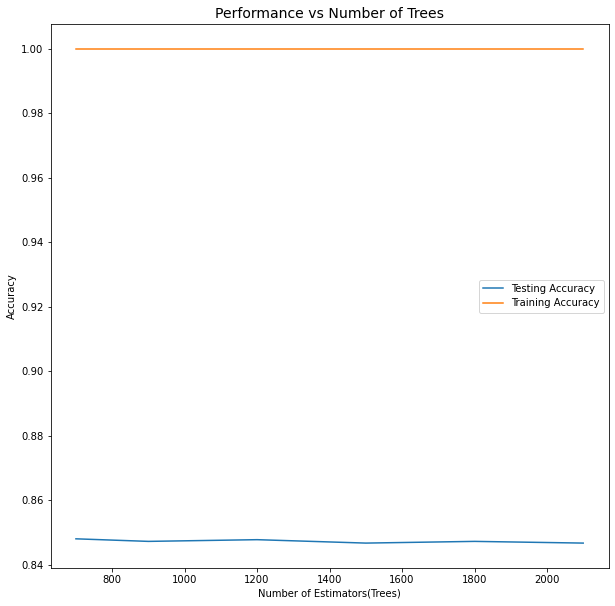

In [161]:
# Get the results into a dataframe
xrf_results3_rev_net = pd.DataFrame(grid_search3_rev_net.cv_results_)

# Plot the training and testing error vs number of trees
plt.figure(figsize=(10,10))
plt.plot(xrf_results3_rev_net['param_n_estimators'], xrf_results3_rev_net['mean_test_score'], label = 'Testing Accuracy')
plt.plot(xrf_results3_rev_net['param_n_estimators'], xrf_results3_rev_net['mean_train_score'], label = 'Training Accuracy')

# set title, labels and legend
plt.xlabel('Number of Estimators(Trees)'); plt.ylabel('Accuracy'); plt.legend();
plt.title('Performance vs Number of Trees', size=14);


In [162]:
#creating classifiers based on Grid Search results:

xrf_classifier1_rev_net_grid_search = ExtraTreesClassifier(n_estimators=700, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)

xrf_classifier2_rev_net_grid_search = ExtraTreesClassifier(n_estimators=900, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)

xrf_classifier3_rev_net_grid_search = ExtraTreesClassifier(n_estimators=1800, 
                                           max_features=None, 
                                           min_samples_leaf=1, 
                                           min_samples_split=3,
                                           random_state=42)
										   
										   
										   
										   
xrf_accuracy1_rev_net_grid_search = fit_evaluate_model(xrf_classifier1_rev_net_grid_search, X1_rev_net_train_1, y1_rev_net_train, X1_rev_net_test_1, y1_rev_net_test)
xrf_accuracy2_rev_net_grid_search = fit_evaluate_model(xrf_classifier2_rev_net_grid_search, X2_rev_net_train_2, y2_rev_net_train, X2_rev_net_test_2, y2_rev_net_test)
xrf_accuracy3_rev_net_grid_search = fit_evaluate_model(xrf_classifier3_rev_net_grid_search, X3_rev_net_train_3, y3_rev_net_train, X3_rev_net_test_3, y3_rev_net_test)


In [163]:
print("Accuracy score in the prev_netious extra random forests model:", xrf_accuracy1_rev_net[1])
print("Accuracy score after random search cv:", xrf_accuracy1_rev_net_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy1_rev_net_grid_search[1])

print("Accuracy score in the prev_netious extra random forests model:", xrf_accuracy2_rev_net[1])
print("Accuracy score after random search cv:", xrf_accuracy2_rev_net_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy2_rev_net_grid_search[1])

print("Accuracy score in the prev_netious extra random forests model:", xrf_accuracy3_rev_net[1])
print("Accuracy score after random search cv:", xrf_accuracy3_rev_net_random_search[1])
print("Accuracy score after grid search cv:", xrf_accuracy3_rev_net_grid_search[1])



Accuracy score in the prev_netious extra random forests model: 0.8637810311903247
Accuracy score after random search cv: 0.890515595162317
Accuracy score after grid search cv: 0.887332908975175
Accuracy score in the prev_netious extra random forests model: 0.8464125560538116
Accuracy score after random search cv: 0.8643497757847534
Accuracy score after grid search cv: 0.8665919282511211
Accuracy score in the prev_netious extra random forests model: 0.8412698412698413
Accuracy score after random search cv: 0.8444444444444444
Accuracy score after grid search cv: 0.8444444444444444


In [164]:
#creating dataset:

df1_rev_net_complete = df_rev_net[(df_rev_net.Elevation <= mark1)]
df2_rev_net_complete = df_rev_net[((df_rev_net.Elevation > mark1) & (df_rev_net.Elevation < mark2))]
df3_rev_net_complete = df_rev_net[(df_rev_net.Elevation >= mark2)]

df1_rev_net_complete_x = split_dataset(df1_rev_net_complete)[0]
df1_rev_net_complete_y = split_dataset(df1_rev_net_complete)[1]

df2_rev_net_complete_x = split_dataset(df2_rev_net_complete)[0]
df2_rev_net_complete_y = split_dataset(df2_rev_net_complete)[1]

df3_rev_net_complete_x = split_dataset(df3_rev_net_complete)[0]
df3_rev_net_complete_y = split_dataset(df3_rev_net_complete)[1]

X1_rev_net_complete = scaler1_rev_net.transform(df1_rev_net_complete_x) 
X2_rev_net_complete = scaler2_rev_net.transform(df2_rev_net_complete_x)
X3_rev_net_complete = scaler3_rev_net.transform(df3_rev_net_complete_x)



In [165]:
#create set of predictions:

df1_rev_net_complete_y_pred = xrf_classifier1_rev_net_grid_search.predict(X1_rev_net_complete)
df2_rev_net_complete_y_pred = xrf_classifier2_rev_net_grid_search.predict(X2_rev_net_complete)
df3_rev_net_complete_y_pred = xrf_classifier3_rev_net_grid_search.predict(X3_rev_net_complete)



In [166]:
# confusion matrix per elevation levels:

print(confusion_matrix(df1_rev_net_complete_y, df1_rev_net_complete_y_pred))
print('')
print(confusion_matrix(df2_rev_net_complete_y, df2_rev_net_complete_y_pred))
print('')
print(confusion_matrix(df3_rev_net_complete_y, df3_rev_net_complete_y_pred))


[[   0    4    1    0    0    5]
 [   0  158    7    0    3   10]
 [   0    2 1880   24    3   52]
 [   0    0   16 2138    0    6]
 [   0   57    4    0  103    5]
 [   0    0   37    7    1 1863]]

[[ 209   44    0    8    1    0]
 [   7  932    6   37    4    0]
 [   0    1  191    5    2    0]
 [   0   21    1 1910    0    0]
 [   0    4    2    5  241    0]
 [   0    1    0    4    0    0]]

[[1822   40    0   26]
 [ 109  883    0    4]
 [  15   44    0    0]
 [  17    0    0 2138]]


In [167]:
# creating empty confusion matrix (based on number of unique values/classes in y):

cm_rev_net_xrf = np.zeros([df_rev_net.iloc[:, (df_rev_net.shape[1]-1)].unique().shape[0], df_rev_net.iloc[:, (df_rev_net.shape[1]-1)].unique().shape[0]])
cmproc_rev_net_xrf = np.zeros([df_rev_net.iloc[:, (df_rev_net.shape[1]-1)].unique().shape[0], df_rev_net.iloc[:, (df_rev_net.shape[1]-1)].unique().shape[0]])
cmreal_rev_net_xrf = np.zeros([df_rev_net.iloc[:, (df_rev_net.shape[1]-1)].unique().shape[0], df_rev_net.iloc[:, (df_rev_net.shape[1]-1)].unique().shape[0]])


#filling confusion matrix with values:

for i in range (X1_rev_net_complete.shape[0]):
    cm_rev_net_xrf [(np.array(df1_rev_net_complete_y)[i] - 1), (df1_rev_net_complete_y_pred[i] - 1)] += 1
for i in range (X2_rev_net_complete.shape[0]):
    cm_rev_net_xrf [(np.array(df2_rev_net_complete_y)[i] - 1), (df2_rev_net_complete_y_pred[i] - 1)] += 1
for i in range (X3_rev_net_complete.shape[0]):
    cm_rev_net_xrf [(np.array(df3_rev_net_complete_y)[i] - 1), (df3_rev_net_complete_y_pred[i] - 1)] += 1
	
	
	
	
# calculating cummulative percentage for all 3 elevation segments:

cmproc_rev_net_xrf[:, :] = cm_rev_net_xrf[:, :]

for i in range(cmproc_rev_net_xrf.shape[0]):
    cmproc_rev_net_xrf [i, :] = cmproc_rev_net_xrf [i, :] / cmproc_rev_net_xrf.sum(axis=1)[i]
    
for i in range(cmreal_rev_net_xrf.shape[0]):
    cmreal_rev_net_xrf [i, i] = cm_rev_net_xrf [i, i] / cm_rev_net_xrf.sum().sum()
    

In [168]:
# Cummulative accuracy for Extra Trees with Random Search, based on df_one dataset:
print('Cummulative accuracy for Extra Trees Classifier using df_one dataset: ',cmreal_one_xrf.sum())
print('Cummulative accuracy for Extra Trees Classifier using df_one_net dataset: ',cmreal_one_net_xrf.sum())
print('Cummulative accuracy for Extra Trees Classifier using df_rev dataset: ',cmreal_rev_xrf.sum())
print('Cummulative accuracy for Extra Trees Classifier using df_rev_net dataset: ',cmreal_rev_net_xrf.sum())

Cummulative accuracy for Extra Trees Classifier using df_one dataset:  0.9580026455026456
Cummulative accuracy for Extra Trees Classifier using df_one_net dataset:  0.9588624338624336
Cummulative accuracy for Extra Trees Classifier using df_rev dataset:  0.9573412698412698
Cummulative accuracy for Extra Trees Classifier using df_rev_net dataset:  0.9568783068783069


In [169]:
print("One Accuracy score in the prev_netious extra random forests model:", xrf_accuracy1_one[1])
print("One Accuracy score after random search cv:", xrf_accuracy1_one_random_search[1])
print("One Accuracy score after grid search cv:", xrf_accuracy1_one_grid_search[1])

print("One_net Accuracy score in the prev_netious extra random forests model:", xrf_accuracy1_one_net[1])
print("One_net Accuracy score after random search cv:", xrf_accuracy1_one_net_random_search[1])
print("One_net Accuracy score after grid search cv:", xrf_accuracy1_one_net_grid_search[1])

print("Rev Accuracy score in the prev_netious extra random forests model:", xrf_accuracy1_rev[1])
print("Rev Accuracy score after random search cv:", xrf_accuracy1_rev_random_search[1])
print("Rev Accuracy score after grid search cv:", xrf_accuracy1_rev_grid_search[1])

print("Rev_net Accuracy score in the prev_netious extra random forests model:", xrf_accuracy1_rev_net[1])
print("Rev_net Accuracy score after random search cv:", xrf_accuracy1_rev_net_random_search[1])
print("Rev_net Accuracy score after grid search cv:", xrf_accuracy1_rev_net_grid_search[1])

print('')

print("One Accuracy score in the prev_netious extra random forests model:", xrf_accuracy2_one[1])
print("One Accuracy score after random search cv:", xrf_accuracy2_one_random_search[1])
print("One Accuracy score after grid search cv:", xrf_accuracy2_one_grid_search[1])

print("One_net Accuracy score in the prev_netious extra random forests model:", xrf_accuracy2_one_net[1])
print("One_net Accuracy score after random search cv:", xrf_accuracy2_one_net_random_search[1])
print("One_net Accuracy score after grid search cv:", xrf_accuracy2_one_net_grid_search[1])

print("Rev Accuracy score in the prev_netious extra random forests model:", xrf_accuracy2_rev[1])
print("Rev Accuracy score after random search cv:", xrf_accuracy2_rev_random_search[1])
print("Rev Accuracy score after grid search cv:", xrf_accuracy2_rev_grid_search[1])

print("Rev_net Accuracy score in the prev_netious extra random forests model:", xrf_accuracy2_rev_net[1])
print("Rev_net Accuracy score after random search cv:", xrf_accuracy2_rev_net_random_search[1])
print("Rev_net Accuracy score after grid search cv:", xrf_accuracy2_rev_net_grid_search[1])

print('')

print("One Accuracy score in the prev_netious extra random forests model:", xrf_accuracy3_one[1])
print("One Accuracy score after random search cv:", xrf_accuracy3_one_random_search[1])
print("One Accuracy score after grid search cv:", xrf_accuracy3_one_grid_search[1])

print("One_net Accuracy score in the prev_netious extra random forests model:", xrf_accuracy3_one_net[1])
print("One_net Accuracy score after random search cv:", xrf_accuracy3_one_net_random_search[1])
print("One_net Accuracy score after grid search cv:", xrf_accuracy3_one_net_grid_search[1])

print("Rev Accuracy score in the prev_netious extra random forests model:", xrf_accuracy3_rev[1])
print("Rev Accuracy score after random search cv:", xrf_accuracy3_rev_random_search[1])
print("Rev Accuracy score after grid search cv:", xrf_accuracy3_rev_grid_search[1])

print("Rev_net Accuracy score in the prev_netious extra random forests model:", xrf_accuracy3_rev_net[1])
print("Rev_net Accuracy score after random search cv:", xrf_accuracy3_rev_net_random_search[1])
print("Rev_net Accuracy score after grid search cv:", xrf_accuracy3_rev_net_grid_search[1])


One Accuracy score in the prev_netious extra random forests model: 0.8803309993634627
One Accuracy score after random search cv: 0.8962444302991726
One Accuracy score after grid search cv: 0.8994271164863145
One_net Accuracy score in the prev_netious extra random forests model: 0.8739656269891789
One_net Accuracy score after random search cv: 0.8987905792488861
One_net Accuracy score after grid search cv: 0.9000636537237429
Rev Accuracy score in the prev_netious extra random forests model: 0.8726925525143221
Rev Accuracy score after random search cv: 0.893698281349459
Rev Accuracy score after grid search cv: 0.8956078930617442
Rev_net Accuracy score in the prev_netious extra random forests model: 0.8637810311903247
Rev_net Accuracy score after random search cv: 0.890515595162317
Rev_net Accuracy score after grid search cv: 0.887332908975175

One Accuracy score in the prev_netious extra random forests model: 0.8553811659192825
One Accuracy score after random search cv: 0.881165919282511

In [170]:
# confusion matrix per elevation levels:

print(confusion_matrix(df1_rev_complete_y, df1_rev_complete_y_pred))
print('')
print(confusion_matrix(df2_rev_net_complete_y, df2_rev_net_complete_y_pred))
print('')
print(confusion_matrix(df3_rev_net_complete_y, df3_rev_net_complete_y_pred))


[[   0    4    1    0    0    5]
 [   0  156    7    0    2   13]
 [   0    2 1885   20    1   53]
 [   0    0   13 2139    0    8]
 [   0   57    2    0  106    4]
 [   0    0   25   14    0 1869]]

[[ 209   44    0    8    1    0]
 [   7  932    6   37    4    0]
 [   0    1  191    5    2    0]
 [   0   21    1 1910    0    0]
 [   0    4    2    5  241    0]
 [   0    1    0    4    0    0]]

[[1822   40    0   26]
 [ 109  883    0    4]
 [  15   44    0    0]
 [  17    0    0 2138]]


In [171]:
# creating empty confusion matrix (based on number of unique values/classes in y):

cm_rev_mix_xrf = np.zeros([df_rev.iloc[:, (df_rev.shape[1]-1)].unique().shape[0], df_rev.iloc[:, (df_rev.shape[1]-1)].unique().shape[0]])
cmproc_rev_mix_xrf = np.zeros([df_rev_net.iloc[:, (df_rev_net.shape[1]-1)].unique().shape[0], df_rev_net.iloc[:, (df_rev_net.shape[1]-1)].unique().shape[0]])
cmreal_rev_mix_xrf = np.zeros([df_rev_net.iloc[:, (df_rev_net.shape[1]-1)].unique().shape[0], df_rev_net.iloc[:, (df_rev_net.shape[1]-1)].unique().shape[0]])


#filling confusion matrix with values:

for i in range (X1_rev_complete.shape[0]):
    cm_rev_mix_xrf [(np.array(df1_rev_complete_y)[i] - 1), (df1_rev_complete_y_pred[i] - 1)] += 1
for i in range (X2_rev_net_complete.shape[0]):
    cm_rev_mix_xrf [(np.array(df2_rev_net_complete_y)[i] - 1), (df2_rev_net_complete_y_pred[i] - 1)] += 1
for i in range (X3_rev_net_complete.shape[0]):
    cm_rev_mix_xrf [(np.array(df3_rev_net_complete_y)[i] - 1), (df3_rev_net_complete_y_pred[i] - 1)] += 1
	
	
	
	
# calculating cummulative percentage for all 3 elevation segments:

cmproc_rev_mix_xrf[:, :] = cm_rev_mix_xrf[:, :]

for i in range(cmproc_rev_mix_xrf.shape[0]):
    cmproc_rev_mix_xrf [i, :] = cmproc_rev_mix_xrf [i, :] / cmproc_rev_mix_xrf.sum(axis=1)[i]
    
for i in range(cmreal_rev_mix_xrf.shape[0]):
    cmreal_rev_mix_xrf [i, i] = cm_rev_mix_xrf [i, i] / cm_rev_mix_xrf.sum().sum()
    

In [172]:
# Cummulative accuracy for Extra Trees with Random Search, based on df_one dataset:
print('Cummulative accuracy for Extra Trees Classifier using df_one dataset: ',cmreal_one_xrf.sum())
print('Cummulative accuracy for Extra Trees Classifier using df_one_net dataset: ',cmreal_one_net_xrf.sum())
print('Cummulative accuracy for Extra Trees Classifier using df_rev dataset: ',cmreal_rev_xrf.sum())
print('Cummulative accuracy for Extra Trees Classifier using df_rev_net dataset: ',cmreal_rev_net_xrf.sum())
print('Cummulative accuracy for Extra Trees Classifier using df_rev and df_rev_net mixed dataset: ',cmreal_rev_mix_xrf.sum())

Cummulative accuracy for Extra Trees Classifier using df_one dataset:  0.9580026455026456
Cummulative accuracy for Extra Trees Classifier using df_one_net dataset:  0.9588624338624336
Cummulative accuracy for Extra Trees Classifier using df_rev dataset:  0.9573412698412698
Cummulative accuracy for Extra Trees Classifier using df_rev_net dataset:  0.9568783068783069
Cummulative accuracy for Extra Trees Classifier using df_rev and df_rev_net mixed dataset:  0.9577380952380953


In [173]:
# # save the model rev to disk

# xrf1_rev_full = xrf_accuracy1_rev_grid_search[0]
# xrf2_rev_full = xrf_accuracy2_rev_grid_search[0]
# xrf3_rev_full = xrf_accuracy3_rev_grid_search[0]


# filename = 'ForestCover-consolidated_full.sav'
# dump(xrf1_rev_full, 'ForestCover-xrf1_rev_full.joblib')
# dump(scaler1_rev, 'ForestCover-xrf1_rev_scaler1_rev_full.joblib')
# dump(xrf1_rev_full, 'ForestCover-xrf2_rev_full.joblib')
# dump(scaler2_rev, 'ForestCover-xrf2_rev_scaler2_rev_full.joblib')
# dump(xrf1_rev_full, 'ForestCover-xrf3_rev_full.joblib')
# dump(scaler3_rev, 'ForestCover-xrf3_rev_scaler3_rev_full.joblib')


In [174]:
# # save the model rev_net to disk

# xrf1_rev_net_full = xrf_accuracy1_rev_net_grid_search[0]
# xrf2_rev_net_full = xrf_accuracy2_rev_net_grid_search[0]
# xrf3_rev_net_full = xrf_accuracy3_rev_net_grid_search[0]


# filename = 'ForestCover-consolidated_full.sav'
# dump(xrf1_rev_net_full, 'ForestCover-xrf1_rev_net_full.joblib')
# dump(scaler1_rev_net, 'ForestCover-xrf1_rev_net_scaler1_rev_net_full.joblib')
# dump(xrf1_rev_net_full, 'ForestCover-xrf2_rev_net_full.joblib')
# dump(scaler2_rev_net, 'ForestCover-xrf2_rev_net_scaler2_rev_net_full.joblib')
# dump(xrf1_rev_net_full, 'ForestCover-xrf3_rev_net_full.joblib')
# dump(scaler3_rev_net, 'ForestCover-xrf3_rev_net_scaler3_rev_net_full.joblib')